# Genome Paper Figures: DMT analysis Version 2

## Introduction

&nbsp;&nbsp;&nbsp;&nbsp; This notebook summarizes the analysis that was done for the *Aspidoscelis marmoratus* genome publication. The analysis done for this project started in 2011 and spans many projects. Many of these side projects did not make it in entirety into the final publication. Rather than upload every single sub project, regardless of whether all the material contained was relevent, we decided instead to summarize the manuscript  in a single, organized notebook. Any additional information required can be requested by contacting me at duncan@baumannlab.org.

## Imports

In [1]:
from __future__ import print_function
from __future__ import division
%matplotlib inline
%load_ext ipycache
import matplotlib 
import matplotlib.pylab as plt
import matplotlib.ticker as ticker
from matplotlib.ticker import ScalarFormatter
from matplotlib.patches import Rectangle
import matplotlib.gridspec as gridspec
from matplotlib.collections import BrokenBarHCollection
import matplotlib.patches as mpatches
from shapely.geometry.polygon import Polygon
from descartes import PolygonPatch
import os
import sys
from IPython.display import Markdown, display
import pandas as pd
from pandas.tools.plotting import scatter_matrix
import seaborn as sns
import scipy.stats as stats
import itertools
from itertools import izip
import multiprocessing as mp
import numpy as np
import glob
from pprint import pprint
from IPython.display import Image
from IPython.display import display
from collections import defaultdict
from IPython.display import set_matplotlib_formats
from IPython.display import Image
from matplotlib.ticker import FuncFormatter
import matplotlib
plt.style.use('seaborn-whitegrid')
plt.rcParams["font.family"] = "sans-serif"
plt.rcParams["font.sans-serif"] = "Arial"
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
pd.set_option('display.max_colwidth', -1)

sys.path = ['../bin'] + sys.path
import gff3_plotting as gff3
import fasta_classes as fa
import blizzard2 as bliz


/home/dut/anaconda3/envs/anaconda2/lib/python2.7/site-packages/IPython/config.py:13: ShimWarning: The `IPython.config` package has been deprecated since IPython 4.0. You should import from traitlets.config instead.
  "You should import from traitlets.config instead.", ShimWarning)
/home/dut/anaconda3/envs/anaconda2/lib/python2.7/site-packages/IPython/utils/traitlets.py:5: UserWarning: IPython.utils.traitlets has moved to a top-level traitlets package.
  warn("IPython.utils.traitlets has moved to a top-level traitlets package.")


## Naming Colors and Constants

Here I establish some colors and dictionaries to convert sample names back and forth.

In [2]:
colors = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c"]
animal_names = ['122', '8450', '001', '003']
animal_ids   = ['Atig_122', 'A_tigris8450', 'Atig001','Atig003']
color_names = dict(zip(animal_names,colors))
color_ids = dict(zip(animal_ids, colors))
id_to_name = dict(zip(animal_ids, animal_names))
name_to_id = dict(zip(animal_names, animal_ids))
majorFontSize = 10
minorFontSize = 9
sns.set(font_scale=1.0, style='whitegrid')

In [3]:
def change_name(name, map_dict=id_to_name):
    name = map_dict[name]
    return name

## Accesory Functions

Here are a few accessory functions that I use later in the analysis. 

In [4]:
def col_name_for_max(row, cols_to_check):
    if row[cols_to_check].max() > 0:
        max_col = row[cols_to_check].argmax()
    else:
        max_col = 'Unclassified'

    return max_col

In [5]:
def apply_df(df, func, *args):
    return df.apply(lambda x: func(x, *args), axis=1)

In [6]:
def apply_df(df, func, *args):
    return df.apply(lambda x: func(x, *args), axis=1)

def apply_by_multiprocessing(df, func, workers, *args):
    pool = mp.Pool(processes=workers)
    result = [pool.apply_async(apply_df, args = (d, func) + args) for d in np.array_split(df, workers)]
    output = [p.get() for p in result]
    pool.close()
    return pd.concat(output)

## Initial Microsatellite Genotyping of 8450 and 122

This figure was generated in excel prior to me joining the lab. I have included it here both to show the data and transfer the image for the manuscript upload.

In [7]:
%%bash
cp ../fig/old\ 8450\ and\ 122\ genotypes.pdf ../fig2/Figure2A.pdf

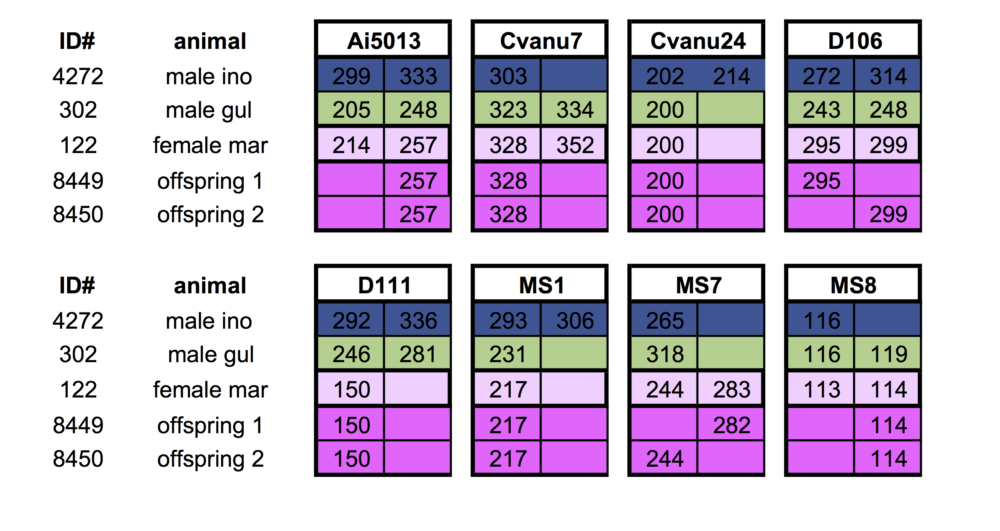

In [8]:
Image('../fig/old 8450 and 122 genotypes.png', height=600, width=600)

## Population Microsatellite Analysis and Figures

The following python class can be used to bin and manipulate microsatellite genotyping data and calculate internal relatedness. The data must be formatted in a specific tsv format.

In [ ]:
# %load ../bin/blizzard2.py
#!/usr/bin/env python
# Author: Duncan Tormey
# Email: dut@stowers.org or duncantormey@gmail.com

from __future__ import print_function
from __future__ import division
from collections import Counter
import pandas as pd


class MicrosatellitePopulation(object):
    """
    Class for calculating iternal relatedness and homozygosity by loci for a set of individuals
    micosatellite genotypes. Also provides a a way to filter data prior to analysis.
    """

    def __init__(self, data_file_path, split_id=True):

        self.data_file_path = data_file_path
        self.genotypes_df = pd.read_excel(self.data_file_path)
        if split_id:
            self.genotypes_df.columns = ['sample_id', 'size_1', 'size_2', 'height_1', 'height_2']
            self.genotypes_df['sample_name'] = self.genotypes_df['sample_id'].apply(lambda x: x.split('-')[0])
            self.genotypes_df['micro_sat'] = self.genotypes_df['sample_id'].apply(lambda x: x.split('-')[1])
        else:
            self.genotypes_df.columns = ['sample_name', 'micro_sat', 'size_1', 'size_2', 'height_1', 'height_2']

        self.genotypes_df.size_2.fillna(self.genotypes_df.size_1, inplace=True)
        self.genotypes_df.drop_duplicates(inplace=True)
        self.population_sizes = {}
        self.sat_bins = {}
        self.population_intervals = {}
        self.binned_population_sizes = {}
        self.population_size_frequencies = {}


    def remove_microsattelite(self, micro_sat):
        """Removes a specific microsatellite from all individuals in population data"""
        self.genotypes_df = self.genotypes_df[self.genotypes_df.micro_sat != micro_sat]

    def remove_sample(self, sample_name):
        """Removes a individual based on sample name from the population"""
        self.genotypes_df = self.genotypes_df[self.genotypes_df.sample_name != sample_name]
        self.genotypes_df = self.genotypes_df[self.genotypes_df.sample_name != str(sample_name)]

    def get_population_sizes(self):
        """Populates the population sizes dictionary with all alleles across all animals"""
        for sat in self.genotypes_df.micro_sat.unique():
            size_dist = \
                self.genotypes_df[self.genotypes_df.micro_sat == sat].filter(regex='size').stack().reset_index()[
                    0].tolist()
            size_dist = [round(size) for size in size_dist]
            self.population_sizes[sat] = size_dist

    def get_sat_bins(self):
        """Determines the number of bins for each microsatellite, based on 3 nucleotide windows"""
        for sat in self.population_sizes:
            bins = round(float(max(self.population_sizes[sat]) -
                               min(self.population_sizes[sat])) / 3.0)
            if bins <= 0:
                bins = 1
            self.sat_bins[sat] = bins

    def get_population_intervals(self):
        """Determines the intervals for the number of bins for each microsatellite based on
        self.get_sat_bins"""
        for sat in self.population_sizes:
            out, bins = pd.cut(self.population_sizes[sat],
                               bins=self.sat_bins[sat],
                               retbins=True)

            intervals = [
                tuple(
                    float(i)
                    for i in str(o).translate(None, "()[]").split(', ')
                )
                for o in set(out)
                ]
            self.population_intervals[sat] = intervals

    def in_interval(self, size, intervals):
        """This is method that takes a allele and list of intervals and returns the interval in
        which the allele resides"""
        matched = None
        for interval in intervals:
            if interval[0] < size <= interval[1]:
                matched = interval[1]
                break
        return matched

    def get_binned_population_sizes(self):
        """Assigns each of the alleles in population_sizes to an interval"""
        for sat in self.population_sizes:
            self.binned_population_sizes[sat] = [self.in_interval(size, self.population_intervals[sat])
                                                 for size in self.population_sizes[sat]]

    def get_population_size_frequencies(self):
        """Determines the frequency of each allele in binned_population_sizes."""
        self.population_size_frequencies = {
            key: {
                k: float(v) / float(len(val))
                for k, v in Counter(val).items()
                }
            for key, val in self.binned_population_sizes.items()
            }

    def bin_data(self):
        """Bins thea data for each sample"""
        self.get_population_sizes()
        self.get_sat_bins()
        self.get_population_intervals()
        self.get_binned_population_sizes()
        self.get_population_size_frequencies()
        self.genotypes_df['binned_size_1'] = self.genotypes_df.apply(lambda x:
                                                                     self.in_interval(round(x['size_1']),
                                                                                      self.population_intervals[
                                                                                          x['micro_sat']]),
                                                                     axis=1)
        self.genotypes_df['binned_size_2'] = self.genotypes_df.apply(lambda x:
                                                                     self.in_interval(round(x['size_2']),
                                                                                      self.population_intervals[
                                                                                          x['micro_sat']]),
                                                                     axis=1)

    def calc_internal_relatedness(self):
        """Calculates internal relatedness and homozygosity by loci for each sample"""
        self.bin_data()
        self.ir_df = []
        for sample_name in self.genotypes_df.sample_name.unique():
            l_df = self.genotypes_df[self.genotypes_df.sample_name == sample_name]
            e_homo = 0
            e_hetero = 0
            num_hom_loci = 0
            num_loci = 0
            l_df.fillna(0.0, inplace=True)
            for row in l_df.itertuples():
                if row.binned_size_1 != 0.0 and row.binned_size_2 != 0.0:
                    num_loci += 1
                    if row.binned_size_1 == row.binned_size_2:
                        num_hom_loci += 1
                        e_homo += self.population_size_frequencies[row.micro_sat][row.binned_size_1]
                        e_homo += self.population_size_frequencies[row.micro_sat][row.binned_size_2]
                    else:
                        e_hetero += self.population_size_frequencies[row.micro_sat][row.binned_size_1]
                        e_hetero += self.population_size_frequencies[row.micro_sat][row.binned_size_2]

            score = e_homo / (e_hetero + e_homo)
            ir = (2 * num_hom_loci - (e_homo + e_hetero)) / (2 * num_loci - (e_homo + e_hetero))
            self.ir_df.append({'sample_name': sample_name, 'homozygosity_by_loci': score,
                               'internal_relatedness': ir, 'num_hom_loci': num_hom_loci,
                               'total_loci': num_loci})
        self.ir_df = pd.DataFrame(self.ir_df)
        self.ir_df = self.ir_df[['sample_name', 'homozygosity_by_loci',
                                 'internal_relatedness', 'num_hom_loci', 'total_loci']]
        self.ir_df = self.ir_df.sort_values('internal_relatedness', ascending=False)
        self.ir_df.reset_index(inplace=True, drop=True)


if __name__ == '__main__':
    print('')


First, I loaded in the microsatellite data that was provided to me by Peter Baumann. This file contains the genotyping data for the more up to date panel of microsatellites. I restructure the data to work better with the python class I wrote. 

In [9]:
populationData = pd.read_excel('../data/marmorata_mirco_test_data.xlsx')
populationData.head()

,Sample ID,Size 1,Size 2,Height 1,Height 2
0,9387-A105-LizardMS,NaN,NaN,NaN,NaN
1,9387-Ai5013-LizardMS,227.66,253.09,7229.0,6420.0
2,9387-Ai5043-LizardMS,175.87,NaN,824.0,NaN
3,9387-Cvanu24-LizardMS,200.09,NaN,6737.0,NaN
4,9387-Cvanu7-LizardMS,NaN,NaN,NaN,NaN


In [10]:
marmPopulation = bliz.MicrosatellitePopulation('../data/marmorata_mirco_test_data.xlsx', split_id=True)

In [11]:
len(marmPopulation.genotypes_df.micro_sat.unique())

12

In [12]:
for x in marmPopulation.genotypes_df.micro_sat.unique():
    print(x)

A105
Ai5013
Ai5043
Cvanu24
Cvanu7
D106
D107
D111
MS1
MS6
MS7
MS8


In [13]:
for x in marmPopulation.genotypes_df.sample_name.unique():
    print(x)

9387
9525
95261
9526
9721
9722
115841
12512
125131
137461
137471
16996
16997
17033
17034
17049
17050
17051
17330
176291
17630
176311
19687
116001
11784
14796
16998
17114
184
185
187
195
234
261
267
268
8033
8873
171151
171161
171171
17118
122_tig
8450_tig


In [14]:
marmPopulation.genotypes_df.head()

,sample_id,size_1,size_2,height_1,height_2,sample_name,micro_sat
0,9387-A105-LizardMS,NaN,NaN,NaN,NaN,9387,A105
1,9387-Ai5013-LizardMS,227.66,253.09,7229.0,6420.0,9387,Ai5013
2,9387-Ai5043-LizardMS,175.87,175.87,824.0,NaN,9387,Ai5043
3,9387-Cvanu24-LizardMS,200.09,200.09,6737.0,NaN,9387,Cvanu24
4,9387-Cvanu7-LizardMS,NaN,NaN,NaN,NaN,9387,Cvanu7


In [15]:
marmPopulation.genotypes_df.groupby('sample_name').count().sort_values('size_1').head()

,sample_id,size_1,size_2,height_1,height_2,micro_sat
sample_name,,,,,,
9526,1,1,1,1,1,1
9387,12,7,7,7,4,12
95261,11,8,8,8,2,11
9525,12,10,10,10,5,12
122_tig,12,11,11,11,5,12


In [16]:
marmPopulation.remove_sample('9387')
marmPopulation.remove_sample('9526')


In [17]:
marmPopulation.genotypes_df[marmPopulation.genotypes_df.sample_name=='8450_tig']

,sample_id,size_1,size_2,height_1,height_2,sample_name,micro_sat
519,8450_tig-A105-LizardMS,NaN,NaN,NaN,NaN,8450_tig,A105
520,8450_tig-Ai5013-LizardMS,257.14,257.14,32277.0,NaN,8450_tig,Ai5013
521,8450_tig-Ai5043-LizardMS,178.81,178.81,7372.0,NaN,8450_tig,Ai5043
522,8450_tig-Cvanu24-LizardMS,199.92,199.92,32614.0,NaN,8450_tig,Cvanu24
523,8450_tig-Cvanu7-LizardMS,328.32,328.32,13329.0,NaN,8450_tig,Cvanu7
524,8450_tig-D106-LizardMS,299.26,299.26,18096.0,NaN,8450_tig,D106
525,8450_tig-D107-LizardMS,178.88,178.88,114.0,NaN,8450_tig,D107
526,8450_tig-D111-LizardMS,150.00,150.00,10241.0,NaN,8450_tig,D111
527,8450_tig-MS1-LizardMS,216.99,216.99,28176.0,NaN,8450_tig,MS1
528,8450_tig-MS6-LizardMS,174.18,174.18,32639.0,NaN,8450_tig,MS6


In [18]:
marmPopulation.genotypes_df[marmPopulation.genotypes_df.sample_name=='122_tig']

,sample_id,size_1,size_2,height_1,height_2,sample_name,micro_sat
507,122_tig-A105-LizardMS,NaN,NaN,NaN,NaN,122_tig,A105
508,122_tig-Ai5013-LizardMS,213.73,257.15,31746.0,24594.0,122_tig,Ai5013
509,122_tig-Ai5043-LizardMS,181.65,181.65,11064.0,NaN,122_tig,Ai5043
510,122_tig-Cvanu24-LizardMS,200.00,200.00,32659.0,NaN,122_tig,Cvanu24
511,122_tig-Cvanu7-LizardMS,328.41,351.65,9057.0,4693.0,122_tig,Cvanu7
512,122_tig-D106-LizardMS,295.40,299.43,12924.0,11387.0,122_tig,D106
513,122_tig-D107-LizardMS,127.91,127.91,665.0,NaN,122_tig,D107
514,122_tig-D111-LizardMS,150.00,150.00,10981.0,NaN,122_tig,D111
515,122_tig-MS1-LizardMS,217.04,217.04,30346.0,NaN,122_tig,MS1
516,122_tig-MS6-LizardMS,174.27,174.27,32567.0,NaN,122_tig,MS6


In [19]:
marmPopulation.genotypes_df[marmPopulation.genotypes_df.sample_name=='19687']

,sample_id,size_1,size_2,height_1,height_2,sample_name,micro_sat
255,19687-A105-LizardMS,255.79,255.79,37.0,NaN,19687,A105
256,19687-Ai5013-LizardMS,220.28,220.28,6972.0,NaN,19687,Ai5013
257,19687-Ai5043-LizardMS,175.83,175.83,1236.0,NaN,19687,Ai5043
258,19687-Cvanu24-LizardMS,199.91,199.91,7414.0,NaN,19687,Cvanu24
259,19687-Cvanu7-LizardMS,331.56,331.56,1350.0,NaN,19687,Cvanu7
260,19687-D106-LizardMS,290.91,290.91,2567.0,NaN,19687,D106
261,19687-D107-LizardMS,170.47,170.47,171.0,NaN,19687,D107
262,19687-D111-LizardMS,150.10,150.10,1522.0,NaN,19687,D111
263,19687-MS1-LizardMS,216.86,216.86,8039.0,NaN,19687,MS1
264,19687-MS6-LizardMS,174.16,174.16,6526.0,NaN,19687,MS6


In [20]:
marmPopulation.genotypes_df[marmPopulation.genotypes_df.sample_name=='17330']

,sample_id,size_1,size_2,height_1,height_2,sample_name,micro_sat
204,17330-A105-LizardMS,255.89,255.89,496.0,NaN,17330,A105
205,17330-Ai5013-LizardMS,220.28,220.28,31495.0,NaN,17330,Ai5013
206,17330-Ai5043-LizardMS,175.95,175.95,16340.0,NaN,17330,Ai5043
207,17330-Cvanu24-LizardMS,199.91,199.91,32360.0,NaN,17330,Cvanu24
208,17330-Cvanu7-LizardMS,331.64,331.64,9399.0,NaN,17330,Cvanu7
209,17330-D106-LizardMS,294.86,294.86,17247.0,NaN,17330,D106
210,17330-D107-LizardMS,178.59,268.36,612.0,271.0,17330,D107
211,17330-D111-LizardMS,150.19,150.19,5223.0,NaN,17330,D111
212,17330-MS1-LizardMS,216.86,216.86,28794.0,NaN,17330,MS1
213,17330-MS6-LizardMS,174.12,174.12,32581.0,NaN,17330,MS6


In [21]:
listsOfAnimalsAndMSUsed = pd.DataFrame({'list of microsatellite markers used':pd.Series(marmPopulation.genotypes_df.micro_sat.unique()),'list of animals used':pd.Series(marmPopulation.genotypes_df.sample_name.unique())})
listsOfAnimalsAndMSUsed.to_excel('../data/listsOfAnimalsAndMSUsed.xlsx')

In [22]:
marmPopulation.calc_internal_relatedness()

/home/dut/anaconda3/envs/anaconda2/lib/python2.7/site-packages/pandas/core/frame.py:2852: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  downcast=downcast, **kwargs)


In [23]:
marmPopulation.ir_df.head()

,sample_name,homozygosity_by_loci,internal_relatedness,num_hom_loci,total_loci
0,8450_tig,1.000000,1.000000,11,11
1,19687,1.000000,1.000000,12,12
2,17330,0.989654,0.800759,11,12
3,125131,0.897412,0.614075,10,12
4,12512,0.898693,0.506762,9,12


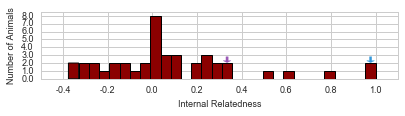

In [24]:
marm_ir = marmPopulation.ir_df
sns.set(style='whitegrid')
plt.figure(figsize=(6.4,1.2))
ax = sns.distplot(marm_ir['internal_relatedness'], kde=False, rug=False, bins=30, color='darkred', hist_kws={'alpha':1.0,'edgecolor':"k", 'linewidth':1})
ax.set_ylim((0,8.5))
ax.set_ylabel('Number of Animals', fontsize=minorFontSize)
ax.set_xlabel('Internal Relatedness', fontsize=minorFontSize)
#ax.set_title('Internal Relatedness of 44 Aspidoscelis marmorata')
ax.arrow(0.978,2.8,0.0,-0.5, width=0.01, head_width=0.035, head_length=0.25, color='#3498db')
ax.arrow(0.335 ,2.8,0.0,-0.5, width=0.01, head_width=0.035, head_length=0.25, color="#9b59b6")
ax.set_xlim(-0.5,1.1)
ax.set_xticklabels(ax.get_xticks(), fontsize=minorFontSize)
ax.set_yticklabels(ax.get_yticks(), fontsize=minorFontSize)

fig = ax.get_figure()
fig.savefig('../fig2/Figure2B.pdf', bbox_inches='tight')

In [25]:
marmPopulation.genotypes_df[['sample_name', 'micro_sat','size_1', 'size_2', 'height_1', 'height_2', 'binned_size_1', 'binned_size_2']].head()

,sample_name,micro_sat,size_1,size_2,height_1,height_2,binned_size_1,binned_size_2
12,9525,A105,NaN,NaN,NaN,NaN,NaN,NaN
13,9525,Ai5013,220.34,252.96,2195.0,1931.0,220.333,253.944
14,9525,Ai5043,175.71,175.71,7536.0,NaN,179.000,179.000
15,9525,Cvanu24,200.00,200.00,4915.0,NaN,200.200,200.200
16,9525,Cvanu7,332.59,352.53,651.0,392.0,334.182,355.818


In [26]:
supplementalTable1 = marmPopulation.genotypes_df[['sample_name', 'micro_sat','size_1', 'size_2', 'height_1', 'height_2', 'binned_size_1', 'binned_size_2']]
supplementalTable1.to_csv('../data/supplemental_data/supplemental_table_1.csv',index=False)

Here I calculate the size ranges for each of the microsatellites in the population.

In [27]:
stack1 = marmPopulation.genotypes_df[['micro_sat', 'size_1']].copy()
stack2 = marmPopulation.genotypes_df[['micro_sat', 'size_2']].copy()
stack1.columns = ['micro_sat', 'size']
stack2.columns = ['micro_sat', 'size']
allSizesDf = pd.concat([stack1, stack2])
allSizesDf.head()

,micro_sat,size
12,A105,NaN
13,Ai5013,220.34
14,Ai5043,175.71
15,Cvanu24,200.00
16,Cvanu7,332.59


I use the group by method and describe to generate the following table.

In [28]:
microSatSizeRangesDf = allSizesDf.groupby('micro_sat').describe().reset_index().reset_index()
microSatSizeRangesDf

index micro_sat  size                                                    \
                   count        mean        std     min       25%      50%   
0   0     A105      74.0  246.969189  18.979147  197.16  255.7150  255.835   
1   1     Ai5013    84.0  231.230714  16.885507  201.63  220.2225  227.445   
2   2     Ai5043    84.0  176.634762  1.591840   175.50  175.7700  175.840   
3   3     Cvanu24   84.0  199.933571  0.097877   199.73  199.9100  199.910   
4   4     Cvanu7    82.0  337.467683  9.083376   328.20  331.5650  331.670   
5   5     D106      84.0  300.888214  21.955367  274.69  294.8100  298.900   
6   6     D107      90.0  158.812222  36.975351  89.65   127.7225  166.365   
7   7     D111      80.0  152.250875  6.991427   149.90  150.0000  150.100   
8   8     MS1       84.0  217.545357  3.686983   216.62  216.7600  216.850   
9   9     MS6       84.0  171.701786  5.910574   157.80  174.0200  174.130   
10  10    MS7       82.0  268.911098  16.973769  235.67  259.0825  266.785   
11  11    MS8       84.0  111.705119  2.947997   108.80  109.1100  109.285   

                      
         75%     max  
0   255.8975  256.03  
1   250.9125  257.15  
2   176.0700  181.65  
3   200.0000  200.17  
4   344.2500  361.60  
5   299.3800  484.02  
6   174.5175  268.36  
7   150.2000  207.90  
8   216.9300  239.14  
9   174.2400  176.26  
10  289.0675  298.10  
11  113.3950  119.71

I then subset to display only min and max values. I then manually copied this into the excel document that Rob sent me.

In [29]:
df = microSatSizeRangesDf['size'][[ 'min', 'max']]
df['micro_sat'] = microSatSizeRangesDf['micro_sat']
df

,min,max,micro_sat
0,197.16,256.03,A105
1,201.63,257.15,Ai5013
2,175.50,181.65,Ai5043
3,199.73,200.17,Cvanu24
4,328.20,361.60,Cvanu7
5,274.69,484.02,D106
6,89.65,268.36,D107
7,149.90,207.90,D111
8,216.62,239.14,MS1
9,157.80,176.26,MS6


He I read in the final table, and rewrite it to a file named 'supplemental table 2.

In [30]:
supplementalTable2 = pd.read_excel('../data/Microsatellite_primer_pairs_used_for_genotyping.xlsx')
supplementalTable2

,Microsatellite,Oligo 1 sequence (5’ → 3’),Oligo 2 sequence (5’ → 3’),Min Size,Max Size
0,A105,AATCCTGAACCTACGGTAAGC,TGCCAGAAAATAGAGGGAAG,197.16,256.03
1,Ai5013,AATTAATGTGCAGCACTAT,GGCAGTTTTTCAGCTAAG,201.63,257.15
2,Ai5043,AAAAAGAAAAGGAAGAACTAA,TGAGACAAGTTGGGTAGA,175.50,181.65
3,Cvanu24,TTTAATGCATCCACTGAGTC,GGAATATAGTGGCATATCAG,199.73,200.17
4,Cvanu7,GACCAATAATGTGGAAGCTG,ACATGGCTGAGTAATTGGTG,328.20,361.60
5,D106,TTAAAGCAGAGGTCAGGTTATC,GATGGAAGAATAGGATGATGAA,274.69,484.02
6,D107,TACCCACCTGGAGATGTTTAG,AGGACGCCTTAAAATAGGAAG,89.65,268.36
7,D111,TGGAGGCAGTCTTGGTATC,GAACATTGACCGCATCAC,149.90,207.90
8,MS1,TGCATGATGGAGGAATCTTC,CTAGTGGTGATAGAAACATGG,216.62,239.14
9,MS6,CACACCCATATTATAAGTGG,CATTCAGATGAAACCTAACC,157.80,176.26


In [31]:
supplementalTable2.to_excel('../data/supplemental_data/supplemental_table_2.xls',index=False)

## Genomic Sequencing Data

Here I read in the table that describes all of the sequencing data. This is referenced when we first describe the genome

In [32]:
supplementalTable3 = pd.read_csv('../../ncbi_genome_delivery/data/supplemental_sequencing_data.csv', sep=',')
supplementalTable3

,library id,sample name,tissue,sex,Instrument Model,design description,Purpose,order type,selection,read length,total reads or read pairs
0,L11871,A_tigris8450,liver,Female,Illumina HiSeq 2500,5kb Mate Pair,DNA Sequencing of Aspidoscelis marmoratus: A_tigris8450,Mate Pair (1ug or 4ug),RANDOM,150,68124235.0
1,L11871-1,A_tigris8450,liver,Female,Illumina HiSeq 2500,8kb Mate Pair,DNA Sequencing of Aspidoscelis marmoratus: A_tigris8450,Mate Pair (1ug or 4ug),RANDOM,150,62138640.0
2,L11871-2,A_tigris8450,liver,Female,Illumina HiSeq 2500,2-15kb Mate Pair,DNA Sequencing of Aspidoscelis marmoratus: A_tigris8450,Mate Pair (1ug or 4ug),RANDOM,150,67949265.0
3,L13136-2,A_tigris8450,liver,Female,Illumina HiSeq 2500,Paired End,DNA Sequencing of Aspidoscelis marmoratus: A_tigris8450,DNA-Seq (1ug),RANDOM,250,376374707.0
4,L15771,A_tigris8450,liver,Female,Illumina HiSeq 2500,CHICAGO,DNA Sequencing of Aspidoscelis marmoratus: A_tigris8450,CHICAGO,RANDOM,100,207139607.0
5,L15772,A_tigris8450,liver,Female,Illumina HiSeq 2500,CHICAGO,DNA Sequencing of Aspidoscelis marmoratus: A_tigris8450,CHICAGO,RANDOM,100,52923608.0
6,S11870,A_tigris8450,liver,Female,Illumina MiSeq,40kb Mate Pair,DNA Sequencing of Aspidoscelis marmoratus: A_tigris8450,Mate Pair,RANDOM,184,7325966.0
7,S11870,A_tigris8450,liver,Female,Illumina MiSeq,40kb Mate Pair,DNA Sequencing of Aspidoscelis marmoratus: A_tigris8450,Mate Pair,RANDOM,250,7578267.0
8,L13087,Atig001,liver,not collected,Illumina HiSeq 2500,Paired End,DNAseq for Aspidoscelis marmoratus Variant Calling,DNA-Seq (1ug),RANDOM,150,96536963.0
9,L13088,Atig003,liver,not collect,Illumina HiSeq 2500,Paired End,DNAseq for Aspidoscelis marmoratus Variant Calling,DNA-Seq (1ug),RANDOM,150,71079632.0


In [33]:
supplementalTable3.to_csv('../data/supplemental_data/supplemental_table_3.csv')

## Genome Size Prediction with FACs

Next I need to copy over the excel document that contains the analysis for genome size prediction. I had to manually copy the file over directly from Google drive to the N drive. Here I rename it as supplemental table 5.

In [34]:
%%bash
cp ../data/supplemental_data/09cy569_acb-tableMarch2017.xlsx ../data/supplemental_data/supplemental_table_4.xlsx

cp: cannot stat ‘../data/supplemental_data/09cy569_acb-tableMarch2017.xlsx’: No such file or directory


## All Scaffolds Genome Stats

The following python module is used to manipulate and gather data from a fasta formated sequence file.

In [35]:
# %load ../bin/fasta_classes.py

In [36]:
dovetailGenomeFile = '../../dovetail_genome_delivery/data/fastas/lizard_23Jun2015_piz6a.upper.fasta'
dtGenome = fa.Fasta_file(dovetailGenomeFile)
dtGenome.get_stats()

perc_genome_covered_by_scaffolds_greater_than_1mb 98.4720241117
total bases 1639530780
perc_genome_covered_by_scaffolds_greater_than_100kb 99.4578671466
scaffolds_greater_than_100Mb 0
N90 7979424
scaffolds_greater_than_1Mb 90
median_scaffold 1450
perc_genome_covered_by_scaffolds_greater_than_10kb 99.6264638594
N50 32220929
max_scaffold 85027298
scaffolds_greater_than_10kb 223
mean_scaffold 428523.465761
min_scaffold 927
scaffolds_greater_than_10Mb 45
scaffolds_greater_than_100kb 133
number of scaffolds 3826


## Large Scaffold Genome Stats

Here I load in the fasta file containing all scaffolds in the genome greater than 10kb using the fasta_classes.py module shown above. I use this module to gather basic statistics about the genome

In [37]:
dovetailGenomeFile = '../data/gatk6/reference/tigris_scaffolds_filt_10000.fa'
dtGenome = fa.Fasta_file(dovetailGenomeFile)
dtGenome.get_bc_stats()

perc_genome_covered_by_scaffolds_greater_than_1mb 98.8412318344
total bases 1633406540
perc_genome_covered_by_scaffolds_greater_than_100kb 99.8307711563
scaffolds_greater_than_100Mb 0
N90 8340160
scaffolds_greater_than_1Mb 90
median_scaffold 296338
perc_genome_covered_by_scaffolds_greater_than_10kb 100.0
N50 32220929
max_scaffold 85027298
scaffolds_greater_than_10kb 223
mean_scaffold 7324693.00448
min_scaffold 10129
scaffolds_greater_than_10Mb 45
scaffolds_greater_than_100kb 133
number of scaffolds 223


In [38]:
statDF = pd.DataFrame(dtGenome.stats,index=['statistic'])
statDF

,N50,N90,max_scaffold,mean_scaffold,median_scaffold,min_scaffold,number of scaffolds,perc_A,perc_C,perc_G,...,perc_T,perc_genome_covered_by_scaffolds_greater_than_100kb,perc_genome_covered_by_scaffolds_greater_than_10kb,perc_genome_covered_by_scaffolds_greater_than_1mb,scaffolds_greater_than_100Mb,scaffolds_greater_than_100kb,scaffolds_greater_than_10Mb,scaffolds_greater_than_10kb,scaffolds_greater_than_1Mb,total bases
statistic,32220929,8340160,85027298,7.324693e+06,296338,10129,223,27.049532,20.123188,20.129348,...,27.050599,99.830771,100.0,98.841232,0,133,45,223,90,1633406540


Here I show the basic statistics gathered by the fasta class

In [39]:
statDF['non_n_GC%'] = statDF[['perc_G','perc_C']].T.sum() / statDF[['perc_A','perc_G','perc_C','perc_T']].T.sum() * 100.0
statDF['non_n_AT%'] = statDF[['perc_A','perc_T']].T.sum() / statDF[['perc_A','perc_G','perc_C','perc_T']].T.sum() * 100.0

statDF = statDF.T
statDF['statistic'] = statDF['statistic'].apply(lambda x: '%.5f' % x)
statDF

,statistic
N50,32220929.00000
N90,8340160.00000
max_scaffold,85027298.00000
mean_scaffold,7324693.00448
median_scaffold,296338.00000
min_scaffold,10129.00000
number of scaffolds,223.00000
perc_A,27.04953
perc_C,20.12319
perc_G,20.12935


In [40]:
statDF = statDF.reset_index()

In [41]:
statDF.columns = ['statistic', 'value']

In [42]:
statDF

,statistic,value
0,N50,32220929.00000
1,N90,8340160.00000
2,max_scaffold,85027298.00000
3,mean_scaffold,7324693.00448
4,median_scaffold,296338.00000
5,min_scaffold,10129.00000
6,number of scaffolds,223.00000
7,perc_A,27.04953
8,perc_C,20.12319
9,perc_G,20.12935


In [43]:
statDF.to_csv('../data/supplemental_data/supplemental_table_5.csv',index=False)

Next, I use the module to calculate N50 like scores. I then plot those scores in the next figure.

In [44]:
nxDF = pd.DataFrame(dtGenome.return_nx_dist()).T
nxDF.columns=['perc','size']
nxDF = nxDF.sort_values('perc')

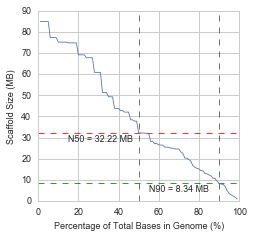

In [45]:
ax1 = nxDF.plot('perc','size', fontsize=minorFontSize, legend=False, linewidth=0.8, figsize=(3.6,3.4))

ax1.get_yaxis().get_major_formatter().set_scientific(False)
ax1.get_yaxis().set_major_formatter(FuncFormatter(lambda x, p: format(int(x/1000000), ',')))
ax1.set_ylabel('Scaffold Size (MB)',fontsize=minorFontSize)


ax1.set_xlabel('Percentage of Total Bases in Genome (%)',fontsize=minorFontSize)
ax1.set_xticks(np.arange(0,120,20))

ax1.vlines(x=50,color ='r',ymin=0,ymax=100000000,linestyle='--', linewidth=0.8)
ax1.hlines(y=32220929,color ='r',xmin=0,xmax=100,linestyle='--', linewidth=0.8)
ax1.annotate('N50 = 32.22 MB',xy=(15,28000000),fontsize=minorFontSize)

ax1.vlines(x=90,color ='g',ymin=0,ymax=100000000,linestyle='--', linewidth=0.8)
ax1.hlines(y=8340160,color ='g',xmin=0,xmax=100,linestyle='--', linewidth=0.8)
ax1.annotate('N90 = 8.34 MB',xy=(55,4500000),fontsize = minorFontSize)

ax1.set_ylim(0,90000000)


ax1.get_xaxis().tick_bottom()
ax1.get_yaxis().tick_left()

fig = ax1.get_figure()
fig.savefig('../fig2/Figure3A.pdf', bbox_inches='tight')


Here I load in the sizes of each scaffold in the genome. These are used multiple times later in analysis.

In [46]:
scaffoldSizes = pd.read_csv('/n/projects/dut/a_marmorata/dovetail_genome_delivery/data/fastas/scaffold_sizes.clean.tsv',sep='\t',names=['scaffold','scaffold_size'])
scaffoldSizes = scaffoldSizes.sort_values('scaffold_size',ascending=False)
orderedScaffolds = scaffoldSizes.scaffold.tolist()
scaffoldSizeDict = dict(zip(scaffoldSizes.scaffold,scaffoldSizes.scaffold_size))

## Isochore Analysis

  Full details on the ischore analysis are included in a separate notebook, "../../marmorata_isochores" is the location of the project

In [47]:
#See notebook at ../../marmorata_isochores for full details on analysis

In [48]:
isochoreFiles = glob.glob('../../marmorata_isochores/data/*window.tsv')
isochoreFiles[:10]

['../../marmorata_isochores/data/Gallus_gallus.Gallus_gallus-5.0.dna.toplevel.gc_5000_scaffold_window.tsv',
 '../../marmorata_isochores/data/Pelodiscus_sinensis.PelSin_1.0.dna.toplevel.gc_10000_scaffold_window.tsv',
 '../../marmorata_isochores/data/Danio_rerio.GRCz10.dna.toplevel.gc_80000_scaffold_window.tsv',
 '../../marmorata_isochores/data/tigris_scaffolds_filt_10000.gc_160000_scaffold_window.tsv',
 '../../marmorata_isochores/data/Pelodiscus_sinensis.PelSin_1.0.dna.toplevel.gc_160000_scaffold_window.tsv',
 '../../marmorata_isochores/data/Danio_rerio.GRCz10.dna.toplevel.gc_320000_scaffold_window.tsv',
 '../../marmorata_isochores/data/Homo_sapiens.GRCh38.dna.primary_assembly.gc_20000_scaffold_window.tsv',
 '../../marmorata_isochores/data/GCA_000186305.2_Python_molurus_bivittatus-5.0.2_genomic.gc_160000_scaffold_window.tsv',
 '../../marmorata_isochores/data/GCA_000186305.2_Python_molurus_bivittatus-5.0.2_genomic.gc_40000_scaffold_window.tsv',
 '../../marmorata_isochores/data/GCA_000186

In [49]:
list_std = []
isochorePathDict = {}
for path in isochoreFiles:
    sample = path.split('/')[-1].split('.')[:2]
    window_size = int(path.split('_')[-3])
    if 'Python' in sample[1]:
        sample = sample[1]
        
    elif 'tigris' in sample[0]:
        sample = 'Aspidoscelis_marmorata'
    else:
        sample = sample[0]
    name = sample.replace('2_','').replace('-5','').replace('_', ' ')
    isochorePathDict[(name,window_size)]=path
    windows_df = pd.read_csv(path, sep='\t', names=['scaffold', 'start', 'stop', 'perc_gc'])
    windows_df.dropna(inplace=True)
    amount_data = len(windows_df) * window_size
    std = windows_df.perc_gc.std()
    dict_data = {'organism':sample, 'window_size':window_size, 'bases_analyzed':amount_data, 'std_dev':std}
    list_std.append(dict_data)

    
gcSTD = pd.DataFrame(list_std)

Here I plot the standard deviation of GC content across various genomes with different window sizes. The data shows that Aspidoscelis marmoratus has similar isochore structure to that of the python, turtle, and mouse.

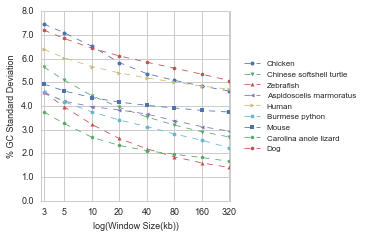

In [50]:
fig = plt.figure(1, figsize=(3.4, 3.4))
ax2 = fig.add_subplot(111)
organism_map = {'Gallus_gallus': 'Chicken', '2_Python_molurus_bivittatus-5': 'Burmese python', 'Aspidoscelis_marmorata': 'Aspidoscelis marmoratus', 
                'Pelodiscus_sinensis': 'Chinese softshell turtle', 'Homo_sapiens': 'Human', 'Canis_familiaris': 'Dog', 'Mus_musculus': 'Mouse', 
                'Danio_rerio': 'Zebrafish', 'Anolis_carolinensis': 'Carolina anole lizard'}

markers=['--o', '--v', '--^', '--<', '-->', '--8', '--s', '--p', '--h', '--H', '--D', '--d']
for i, organism in enumerate(gcSTD.organism.unique()):
    name = organism_map[organism]
    gc_dist = gcSTD[gcSTD.organism ==organism].copy()
    gc_dist.sort_values('window_size',inplace=True)
    ax2.plot(gc_dist['window_size'],
            gc_dist['std_dev'], 
            markers[i],
            label=name,
            markersize=4,
            linewidth=0.8)

ax2.set_xscale("log")
ax2.set_xticks([10] + gc_dist['window_size'].tolist())
ax2.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
ax2.set_xlim(2770,330000)
xtick_labels = [str(int(float(x)/1000.0)) for x in ax2.get_xticks()]
ax2.set_xticklabels(xtick_labels, fontsize=minorFontSize)

ax2.set_yticks(np.arange(0,11,1.0))
ax2.set_yticklabels(ax2.get_yticks(),fontsize=minorFontSize)

ax2.set_ylim(0,8)
ax2.set_ylabel('% GC Standard Deviation', fontsize=minorFontSize)
ax2.set_xlabel('log(Window Size(kb))', fontsize=minorFontSize)
ax2.legend(loc=5,bbox_to_anchor=(1.7, 0.5), prop={'size':8})

ax2.get_xaxis().tick_bottom()
ax2.get_yaxis().tick_left()

fig.savefig('../fig2/Figure3B.pdf', bbox_inches='tight')


## Busco Analysis (Done by Rutendo Sigauke)

In [51]:
%%bash
cp /n/projects/rfs/lizard/marmorata/busco_analysis/figures/busco_summary_figure.pdf ../fig2/Figure4A.pdf

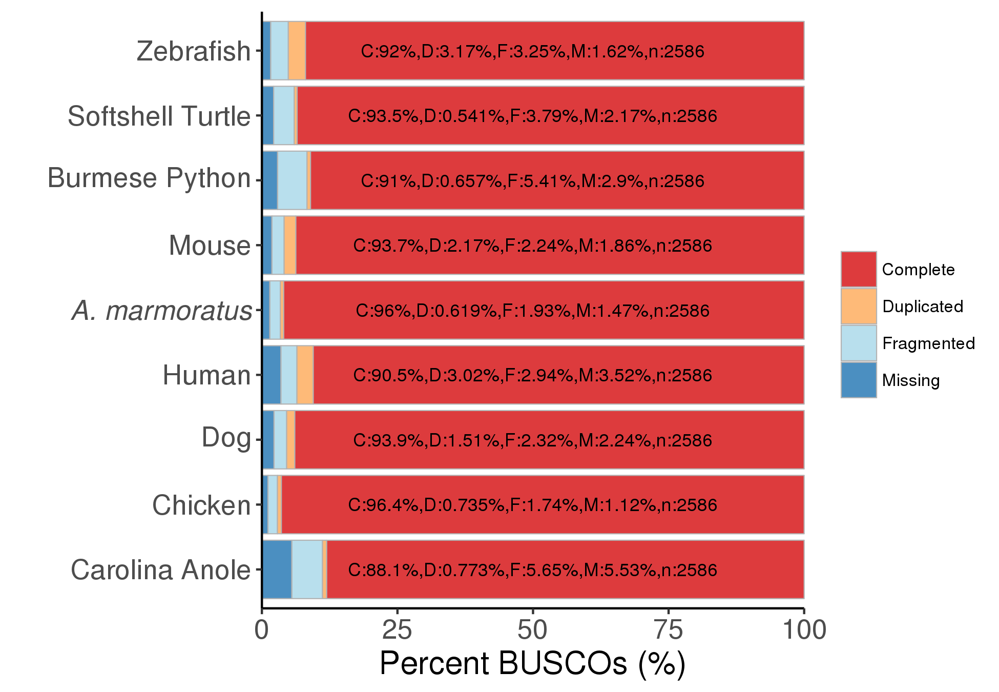

In [52]:
Image('/n/projects/rfs/lizard/marmorata/busco_analysis/figures/busco_summary_figure.png', height=900, width=900)

In [53]:
%%bash
cp /n/projects/rfs/lizard/marmorata/busco_analysis/figures/phylogeny_1536BUSCOs_Gblocks_100bootstrap_Arial_Common_Name.pdf ../fig2/Figure4B.pdf

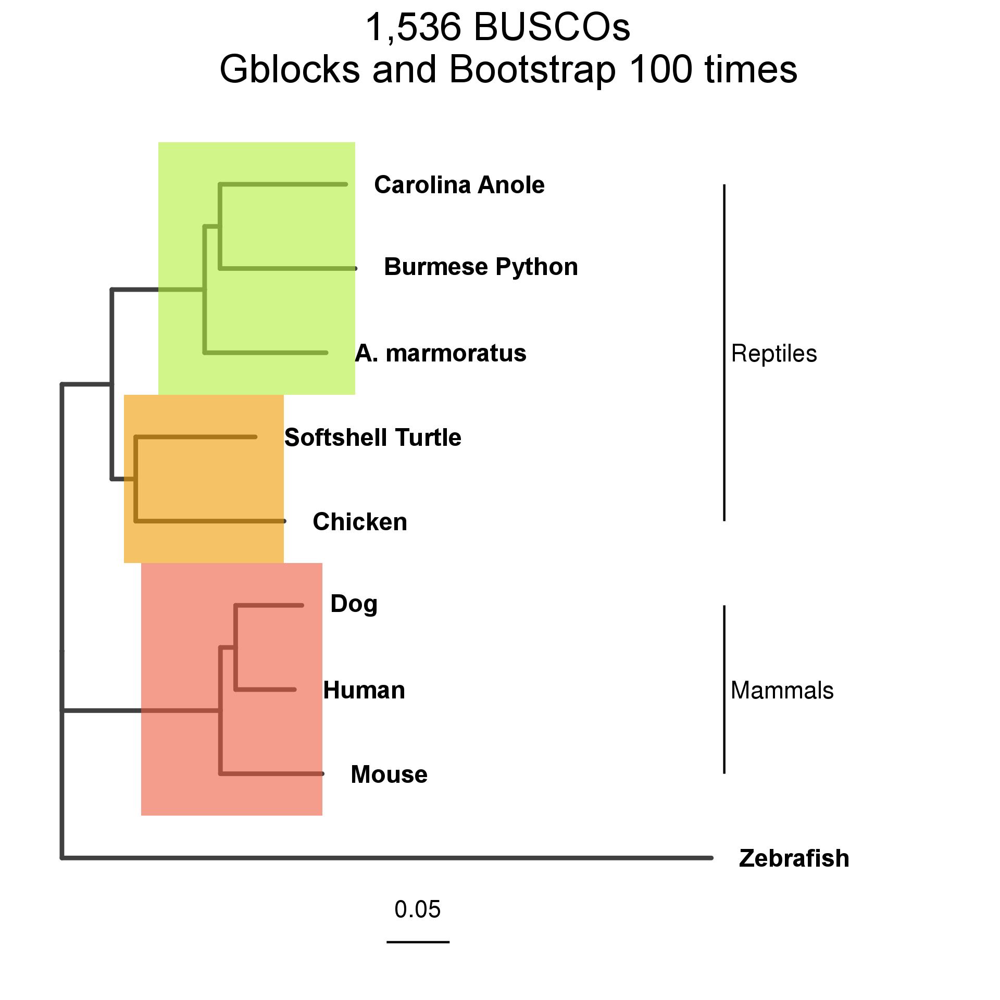

In [54]:
Image('/n/projects/rfs/lizard/marmorata/busco_analysis/figures/phylogeny_1536BUSCOs_Gblocks_100bootstrap_Arial_Common_Name.png', height=900, width=900)

## Synteny Analysis (Done by Rutendo Sigauke)

In [55]:
%%bash
cp /n/projects/rfs/lizard/marmorata/synteny/figures/Marmorata_Anole_synteny_99score_allScaff_Arial_common_name.pdf ../fig2/Figure4C.pdf

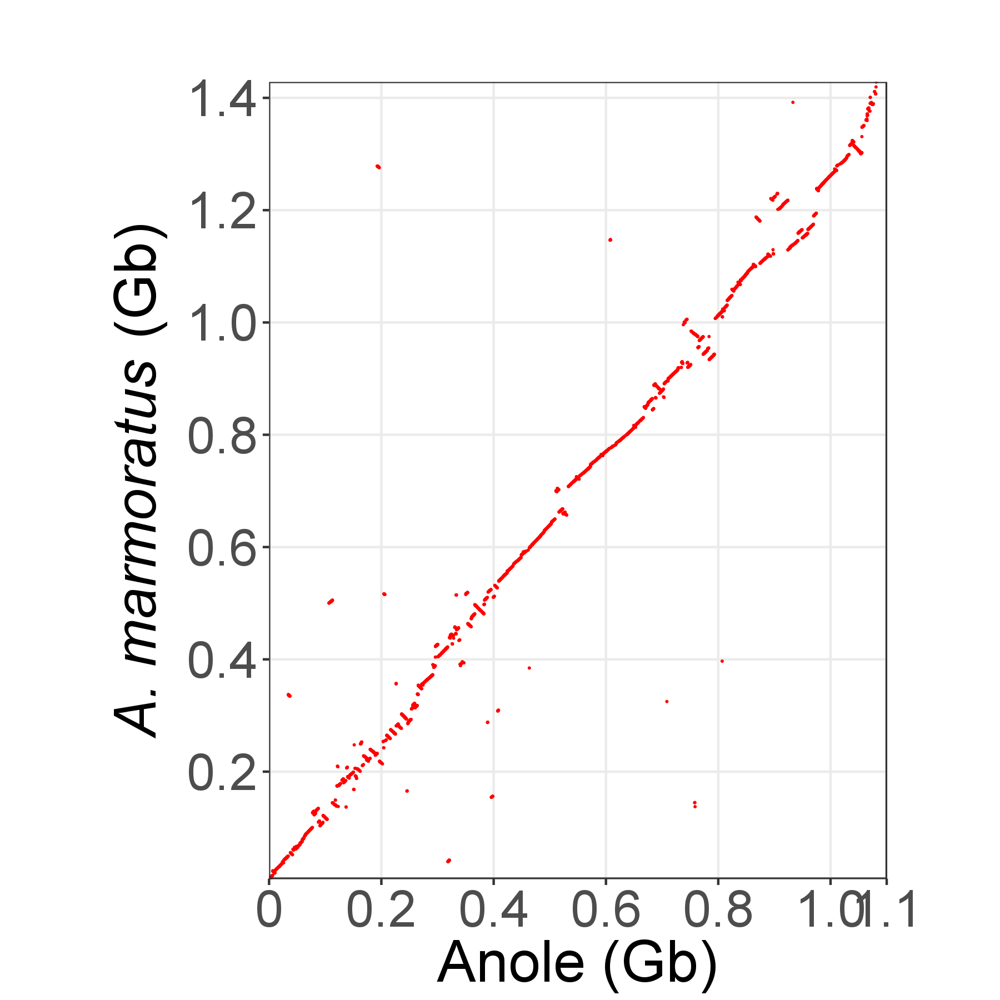

In [56]:
Image('/n/projects/rfs/lizard/marmorata/synteny/figures/Marmorata_Anole_synteny_99score_allScaff_Arial_common_name.png', height=600, width=600)

In [57]:
%%bash
cp /n/projects/rfs/lizard/marmorata/synteny/figures/Marmorata_Chicken_synteny_99score_allScaff_Arial_common_names.pdf ../fig2/Figure4D.pdf

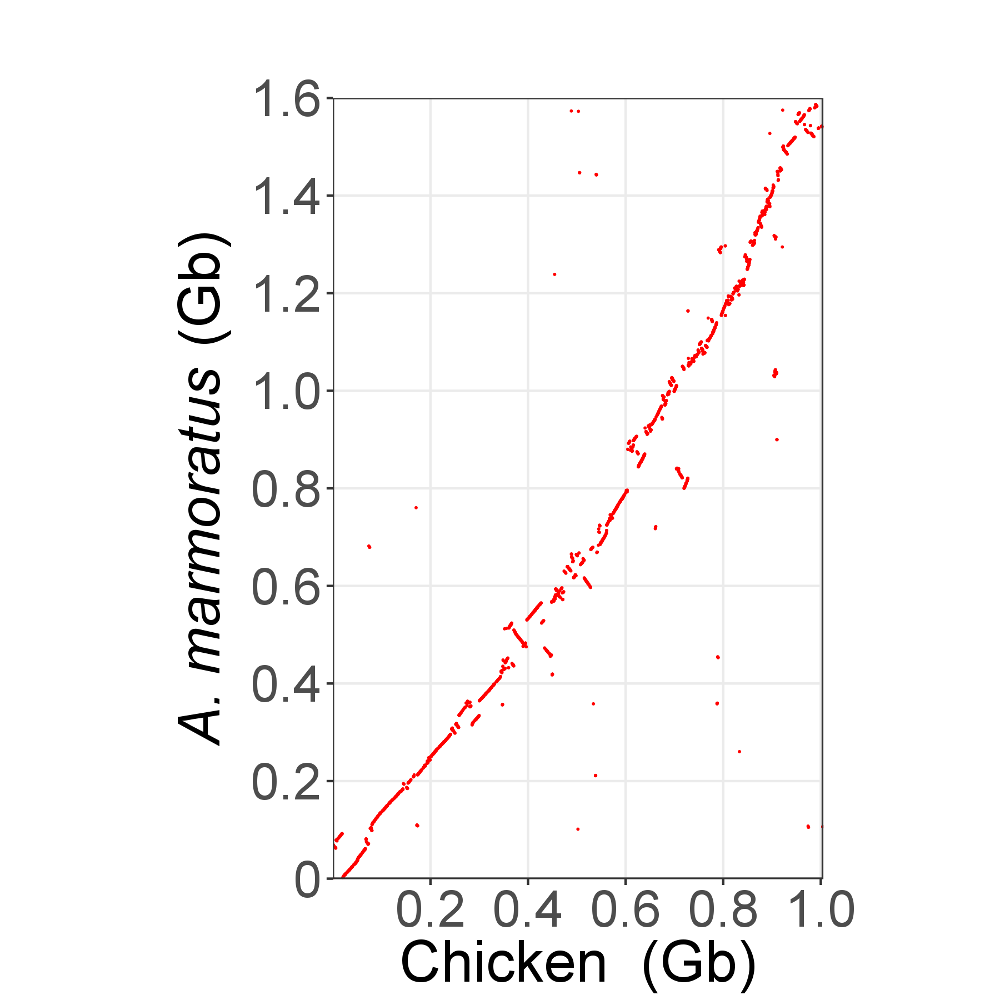

In [58]:
Image('/n/projects/rfs/lizard/marmorata/synteny/figures/Marmorata_Chicken_synteny_99score_allScaff_Arial_common_names.png', height=600, width=600)

## Repeat Analysis (Done by Rutendo Sigauke)

In [59]:
%%bash
cp /n/projects/rfs/lizard/marmorata/repeats/analysis/figures/repeats_genomes_summary_common_names_Ariel.pdf ../fig2/supplemental_figure_1.pdf

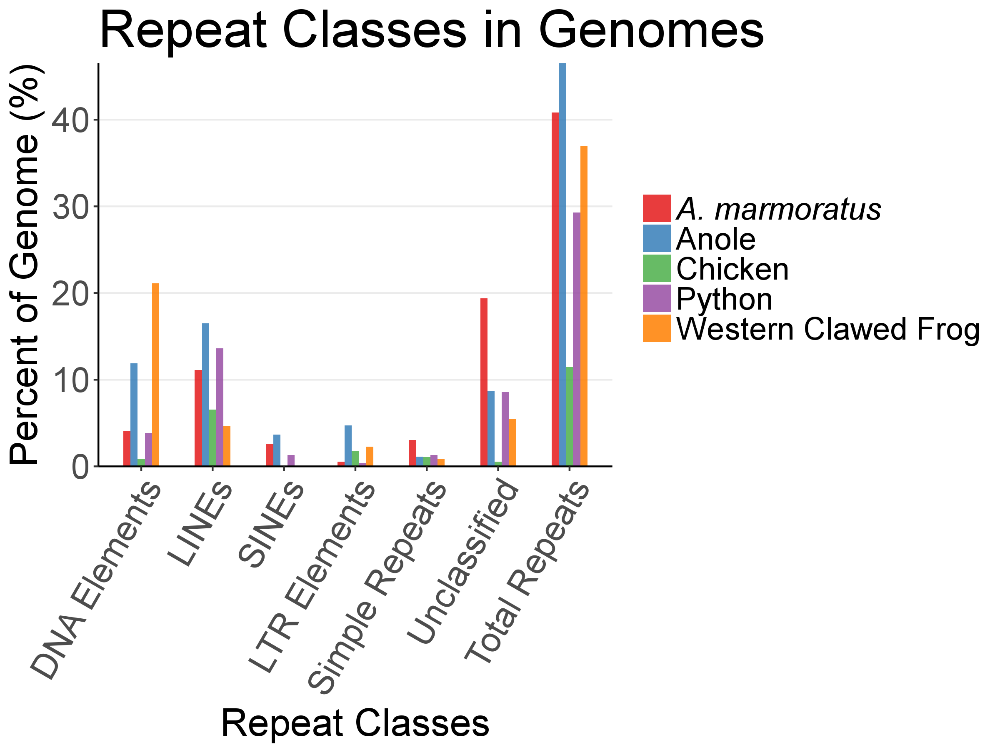

In [60]:
Image('/n/projects/rfs/lizard/marmorata/repeats/analysis/figures/repeats_genomes_summary_common_names_Ariel.png', height=600, width=600)

In [61]:
%%bash 
cp /n/projects/rfs/lizard/marmorata/repeats/repeat_masker/repeat_summaries/RepeatFamilySummariesPercentOfGenome.tsv ../data/supplemental_data/supplemental_table_6.tsv

In [62]:
pd.read_csv('../data/supplemental_data/supplemental_table_6.tsv', sep='\t').tail()

,repeats,marmorata,anole,xenopus,gallus,python
67,SINE/tRNA-Sauria-L2,0.000000,1.134833,0.000000,0.000000,0.011473
68,SINE/tRNA-Sauria-RTE,0.000000,0.102815,0.000000,0.000000,0.099582
69,SINE/U,0.000000,0.000624,0.011249,0.000000,0.000000
70,snRNA,0.004796,0.000000,0.009599,0.000000,0.001264
71,Unknown,20.640800,7.684774,5.144897,0.531585,8.898379


## Load Annotations

The following python module can be used to manipulate and plot the contained in a GFF3 formatted file.

In [63]:
# %load ../bin/gff3_plotting.py

Here I load in the genome annotations, these are used later in the hox gene analysis and vmnr analysis.

In [64]:
gffMarmAbInPath='../data/augustus.renamed.putative_function.iprscan.gff3'
gffMarmPath = '../data/a_tigris_1.renamed.putative_function.iprscan.wintrons.gff'
gffMarmDF= gff3.gff3_to_attribute_df(gff_path=gffMarmPath,ensembl=False)
gffMarmDF = gff3.add_gene_symbol(gffMarmDF, ensembl=False)
gffMarmDF = gff3.add_gene_id(gffMarmDF, ensembl=False)
gffMarmDF = gff3.add_gene_name(gffMarmDF, ensembl=False)
gffMarmDF['count_column'] = gffMarmDF.apply(lambda row: (row['seqid'], row['gene_symbol']), axis=1)
gffMarmDF['source'] = 'MAKER2'

691299 691299


In [65]:
gffMarmAbInDF= gff3.gff3_to_attribute_df(gff_path=gffMarmAbInPath,ensembl=False)
gffMarmAbInDF = gff3.add_gene_symbol(gffMarmAbInDF, ensembl=False)
gffMarmAbInDF = gff3.add_gene_id(gffMarmAbInDF, ensembl=False)
gffMarmAbInDF = gff3.add_gene_name(gffMarmAbInDF, ensembl=False)
gffMarmAbInDF['count_column'] = gffMarmAbInDF.apply(lambda row: (row['seqid'], row['gene_symbol']), axis=1)
gffMarmAbInDF['source']='BRAKER1'

1737575 1737575


In [66]:
supplementalAnnotDF = pd.concat(
    [
        gffMarmAbInDF[['source','feature']], 
        gffMarmDF[['source','feature']]
    ]
     )
supplementalAnnotDF['count'] =1

In [67]:
supplementalAnnotDF = supplementalAnnotDF.groupby(['source','feature']).sum().reset_index()
supplementalAnnotDF

,source,feature,count
0,BRAKER1,CDS,424058
1,BRAKER1,exon,424058
2,BRAKER1,gene,152361
3,BRAKER1,intron,267602
4,BRAKER1,mRNA,156525
5,BRAKER1,start_codon,156457
6,BRAKER1,stop_codon,156514
7,MAKER2,CDS,222450
8,MAKER2,exon,164669
9,MAKER2,five_prime_UTR,22402


In [68]:
supplementalAnnotDF = supplementalAnnotDF.T

In [69]:
supplementalAnnotDF = supplementalAnnotDF.reset_index()
supplementalAnnotDF = supplementalAnnotDF.rename(columns=supplementalAnnotDF.iloc[1])
supplementalAnnotDF = supplementalAnnotDF.reindex(supplementalAnnotDF.index.drop(1))

In [70]:
supplementalAnnotDF

,feature,CDS,exon,gene,intron,mRNA,start_codon,stop_codon,CDS,exon,five_prime_UTR,gene,intron,mRNA,three_prime_UTR
0,source,BRAKER1,BRAKER1,BRAKER1,BRAKER1,BRAKER1,BRAKER1,BRAKER1,MAKER2,MAKER2,MAKER2,MAKER2,MAKER2,MAKER2,MAKER2
2,count,424058,424058,152361,267602,156525,156457,156514,222450,164669,22402,25856,189732,44461,21729


In [71]:
supplementalAnnotDF.T.to_csv('../data/supplemental_data/supplemental_table_7.csv',index=True,header='False')

## HOX Gene Analysis

Here I link to the braker ab initio gene predictions

In [72]:
%%bash
cd ../data
#ln -s ../../dovetail_braker_annotation/data/augustus.renamed.putative_function.iprscan.gff3

Next, I downloaded annotation sets for human, mouse, and anolis. I was originally going to compare annotations directly in the GFF file, but I decided not too because the annotations for mouse and human have far more evidence than the annotations for anolis.

In [73]:
%%bash
cd ../data
#wget ftp://ftp.ensembl.org/pub/release-87/gff3/homo_sapiens/Homo_sapiens.GRCh38.87.abinitio.gff3.gz
#wget ftp://ftp.ensembl.org/pub/release-87/gff3/homo_sapiens/Homo_sapiens.GRCh38.87.chr.gff3.gz
#gunzip Homo_sapiens.GRCh38.87.abinitio.gff3.gz
#gunzip Homo_sapiens.GRCh38.87.chr.gff3.gz


In [74]:
%%bash
cd ../data
#wget ftp://ftp.ensembl.org/pub/release-87/gff3/mus_musculus/Mus_musculus.GRCm38.87.chr.gff3.gz
#wget ftp://ftp.ensembl.org/pub/release-87/gff3/mus_musculus/Mus_musculus.GRCm38.87.abinitio.gff3.gz
#gunzip Mus_musculus.GRCm38.87.chr.gff3.gz
#gunzip Mus_musculus.GRCm38.87.abinitio.gff3.gz

In [75]:
%%bash
cd ../data
#wget ftp://ftp.ensembl.org/pub/release-87/gff3/anolis_carolinensis/Anolis_carolinensis.AnoCar2.0.87.chr.gff3.gz
#wget ftp://ftp.ensembl.org/pub/release-87/gff3/anolis_carolinensis/Anolis_carolinensis.AnoCar2.0.87.abinitio.gff3.gz
#gunzip Anolis_carolinensis.AnoCar2.0.87.chr.gff3.gz
#gunzip Anolis_carolinensis.AnoCar2.0.87.abinitio.gff3.gz

In [76]:
%%bash
cd ../data
#wget ftp://ftp.ensembl.org/pub/release-87/gff3/anolis_carolinensis/Anolis_carolinensis.AnoCar2.0.87.gff3.gz
#gunzip Anolis_carolinensis.AnoCar2.0.87.gff3.gz

Here I am searching for the HOX gene clusters and plotting them using the python script loaded into this notebook (gff3).

1737575 1737575
1737575
165


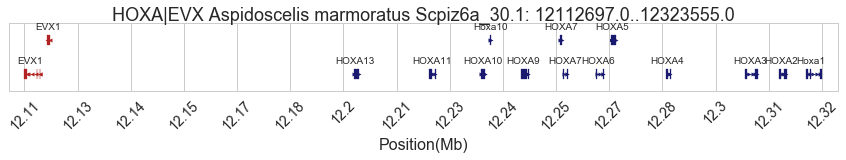

1737575 1737575
1737575
171


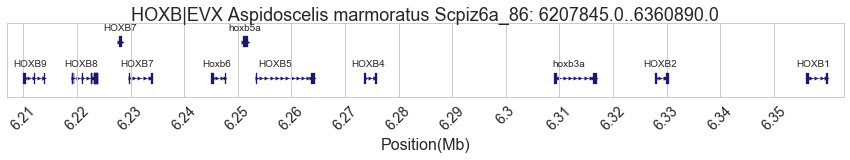

1737575 1737575
1737575
168


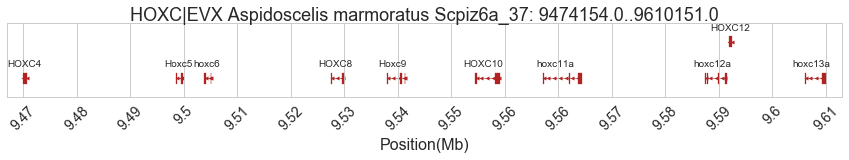

1737575 1737575
1737575
200


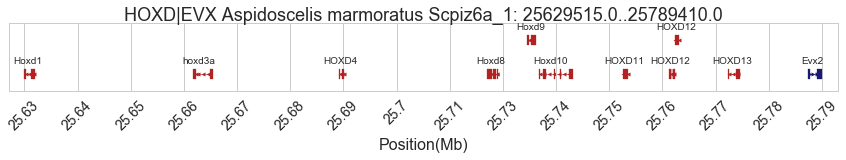

In [77]:
for c in ['a','b','c','d']:
    #Aspidoscelis marmorata
    regex = 'hox%s|evx'%c
    organism = 'Aspidoscelis marmoratus'
    fig, ax = gff3.plot_single_cluster_series(gff3_paths=['../data/augustus.renamed.putative_function.iprscan.gff3'], subset_regex=regex, species=organism, path_targ='augustus')
    #fig.savefig('../fig/%s_hox-%s.pdf'%(organism, c), bbox_inches='tight', pad_inches=0.2)
    plt.show()

Here I subset out the scaffolds which contain the hox gene clusters. This was done in case they were needed for supplemental. I also extracted out the annotations for just those scaffolds from the GFF3 braker gene predictions.

In [78]:
hoxScaffolds = ['>Scpiz6a_1','>Scpiz6a_37','>Scpiz6a_86','>Scpiz6a_30.1']
hoxGenomeDict = {k:v for k,v in dtGenome.fasta_dict.items() if k in hoxScaffolds}
fa.write_two_line_fasta('../data/hox_scaffolds.fa', list(hoxGenomeDict.items()))

In [79]:
augHoxGFFDF = pd.read_csv('../data/augustus.renamed.putative_function.iprscan.gff3',sep='\t',header=None)
augHoxGFFDF = augHoxGFFDF[augHoxGFFDF[0].isin([s.strip('>') for s in hoxScaffolds])]
augHoxGFFDF.to_csv('../data/aug_hox_annotations.gff3',sep='\t')
augHoxGFFDF.head()


,0,1,2,3,4,5,6,7,8
348850,Scpiz6a_37,AUGUSTUS,gene,3902,4216,0.59,+,.,ID=ATIG_ab_00023958;Name=;Alias=g31007;Note=Similar to NSMF: NMDA receptor synaptonuclear signaling and neuronal migration factor (Homo sapiens);
348851,Scpiz6a_37,AUGUSTUS,mRNA,3902,4216,0.59,+,.,ID=ATIG_ab_00023958-RA;Parent=ATIG_ab_00023958;Name=;Alias=g31007.t1;Note=Similar to NSMF: NMDA receptor synaptonuclear signaling and neuronal migration factor (Homo sapiens);
348852,Scpiz6a_37,AUGUSTUS,start_codon,3902,3904,.,+,0,Parent=ATIG_ab_00023958-RA;
348853,Scpiz6a_37,AUGUSTUS,CDS,3902,4216,0.59,+,0,ID=g31007.t1.CDS1;Parent=ATIG_ab_00023958-RA;
348854,Scpiz6a_37,AUGUSTUS,exon,3902,4216,.,+,.,ID=g31007.t1.exon1;Parent=ATIG_ab_00023958-RA;


Because the above figures are a bit messy looking I decided to make a simple schematic for the text. I start with pulling out all the gene coordinates for the above figures.

In [80]:
%%bash
cd ../data
#awk '$3=="gene"' augustus.renamed.putative_function.iprscan.gff3 | grep -E -i ' hox|evx' | awk  '$1=="Scpiz6a_86" || $1=="Scpiz6a_30.1" || $1=="Scpiz6a_37" || $1=="Scpiz6a_1"' | sed 's/Similar to /\t/' | cut -f -5,7,10 | tr ':' '\t' | cut -f -7 > hox_gene_coords.tsv

I also independently found HOXB13 in the MAKER annotations by manually blasting a nearby model. I next added the coordinates from that model to the file I generated above.

In [81]:
%%bash
cd ../data
#grep ATIG_00008349 a_tigris_1.renamed.putative_function.iprscan.wintrons.gff  | awk '$3=="gene"' | cut -f -5,7 | tr '\n' '~' | sed "s/~/@Hoxb13~/" | tr '~' '\n' | tr '@' '\t' >> hox_gene_coords.tsv

I found later on that hoxc3 is present in the anolis lizard (https://www.ncbi.nlm.nih.gov/pmc/articles/PMC2665779/). I couldn't find a copy of the sequence mentioned in the paper, but I was able to find a sequence for Xenopus HOXC3. I generated the following curl command directly from the ensemble website.

In [82]:
%%bash
cd ../data
#curl --header 'Host: www.ensembl.org' \
#--header 'User-Agent: Mozilla/5.0 (Macintosh; Intel Mac OS X 10.11; rv:52.0) Gecko/20100101 Firefox/52.0' \
#--header 'Accept: text/html,application/xhtml+xml,application/xml;q=0.9,*/*;q=0.8' \
#--header 'Accept-Language: en-US,en;q=0.5' \
#--header 'Referer: http://www.ensembl.org/Xenopus_tropicalis/Gene/Sequence?db=core;g=ENSXETG00000025181;r=GL172862.1:552422-558412;t=ENSXETT00000053914' \
#--header 'Cookie: _ga=GA1.2.780793432.1475001731; ENSEMBL_WIDTH=2300; DYNAMIC_WIDTH=1; _pk_ref..c10e=%5B%22%22%2C%22%22%2C1481326908%2C%22http%3A%2F%2Fuseast.ensembl.org%2FAnolis_carolinensis%2FInfo%2FIndex%22%5D; _pk_id..c10e=6f2a23a1cab0d268.1481326908.1.1481327562.1481326908.; ENSEMBL_HINX_SESSION=0ea132a2ddae24e00aa90673589a5dc90ab37997b5a94c19eec2634e; ENSEMBL_GENOVERSE_SCROLL=0; _gid=GA1.2.2055248845.1494971795; ENSEMBL_REGION_PAN=1; ENSEMBL_SEARCH=ensembl_all; _gali=KDbFOwdW_3; _gat=1' \
#--header 'DNT: 1' \
#--header 'Connection: keep-alive' \
#--header 'Upgrade-Insecure-Requests: 1' 'http://www.ensembl.org/Xenopus_tropicalis/Download/DataExport?compression=;db=core;file=temporary/2017_05_16/session_295535549/HAUljTwe/Xenopus_tropicalis_hoxc3_sequence.fa;filename=Xenopus_tropicalis_hoxc3_sequence.fa;format=FASTA;g=ENSXETG00000025181;r=GL172862.1:552422-558412;t=ENSXETT00000053914' \
#-o 'Xenopus_tropicalis_hoxc3_sequence.fa' \
#-L
cat ../data/Xenopus_tropicalis_hoxc3_sequence.fa

>hoxc3-201 peptide: ENSXETP00000053914 pep:KNOWN_protein_coding
MPKSLFYDNSASFGGCGFQGNNGMGYLGQQDYPSEDDYQPPFCLPPDTANGSASHKGEHS
IKGIDFHLSEVSEQAQQPKSPNSDSPLPKSASTQSCTSKKSTGPVSSDVTSPNKKSKGSN
MPKQIFPWMKETRQNSKQKKQAPPPAEEACKVREKNTGSFSASKRARTAYTNSQLVELEK
EFHFNRYLCRPRRLEMAKLLNLSERQIKIWFQNRRMKFKKDHKGKGGGGSPGGLSPSSSP
SLMPYSGNLPLDGDCGYEVPMATGAYNKSPGNMYGLTAYSAPLFEGPSAQKRYGPQSLAP
EYDPHSMQGDNNYDTSGLPNGQGYLGNYLENGSESCSMFSLPHPSSESMDYSCAAQTPSK
HHLGPCDPHPTYTDLHIHPVPQACSQEPPVLTHL



In [83]:
%%bash
#exonerate --model protein2genome \
#--showvulgar no \
#--showalignment no \
#--showtargetgff yes \
#--maxintron 50000 \
#--ryo ">%qi length=%ql alnlen=%qaln>%ti length=%tl alnlen=%taln" \
#--query ../data/Xenopus_tropicalis_hoxc3_sequence.fa \
#--target ../data/tigris_scaffolds_filt_10000.fa \
#> Xenopus_tropicalis_hoxc3_to_marmoratus_genome.out &
#mv Xenopus_tropicalis_hoxc3_to_marmoratus_genome.out ../data


In [84]:
%%bash
cd ../data
#grep -v '^#' Xenopus_tropicalis_hoxc3_to_marmoratus_genome.out | grep -v '^>' | grep -v 'bonsai.sgc.loc' | grep -v '^Command line:' > Xenopus_tropicalis_hoxc3_to_marmoratus_genome.gff

In [85]:
xenopusHoxcHits = pd.read_csv('../data/Xenopus_tropicalis_hoxc3_to_marmoratus_genome.gff',sep='\t', names=['seqid', 'source', 'feature', 'start', 'end', 'score', 'strand', 'phase', 'attributes'])
xenopusHoxcHits.head()

,seqid,source,feature,start,end,score,strand,phase,attributes
0,Scpiz6a_49,exonerate:protein2genome:local,gene,19691975,19692514,198,+,.,gene_id 1 ; sequence hoxc3-201 ; gene_orientation + ; identity 35.40 ; similarity 50.31
1,Scpiz6a_49,exonerate:protein2genome:local,cds,19691975,19692248,.,+,.,NaN
2,Scpiz6a_49,exonerate:protein2genome:local,exon,19691975,19692248,.,+,.,insertions 0 ; deletions 0 ; identity 43.96 ; similarity 57.14
3,Scpiz6a_49,exonerate:protein2genome:local,splice5,19692249,19692250,.,+,.,"intron_id 1 ; splice_site ""TC"""
4,Scpiz6a_49,exonerate:protein2genome:local,intron,19692249,19692302,.,+,.,intron_id 1


The second best hit appears in the right area.

In [86]:
xenopusHoxcHits[(xenopusHoxcHits.feature == 'gene') &(xenopusHoxcHits.seqid == 'Scpiz6a_37')].sort_values('score',ascending=False).head()


,seqid,source,feature,start,end,score,strand,phase,attributes
391,Scpiz6a_37,exonerate:protein2genome:local,gene,9403550,9404943,346,-,.,gene_id 1 ; sequence hoxc3-201 ; gene_orientation + ; identity 60.80 ; similarity 72.00
400,Scpiz6a_37,exonerate:protein2genome:local,gene,9473492,9474480,243,-,.,gene_id 2 ; sequence hoxc3-201 ; gene_orientation + ; identity 40.85 ; similarity 56.34
409,Scpiz6a_37,exonerate:protein2genome:local,gene,9500001,9500189,228,-,.,gene_id 3 ; sequence hoxc3-201 ; gene_orientation . ; identity 71.43 ; similarity 82.54
413,Scpiz6a_37,exonerate:protein2genome:local,gene,9504971,9505144,205,-,.,gene_id 4 ; sequence hoxc3-201 ; gene_orientation . ; identity 67.24 ; similarity 81.03
417,Scpiz6a_37,exonerate:protein2genome:local,gene,9535775,9535966,203,-,.,gene_id 5 ; sequence hoxc3-201 ; gene_orientation . ; identity 60.94 ; similarity 78.12


In [87]:
%%bash
cd ../data
#cat Xenopus_tropicalis_hoxc3_to_marmoratus_genome.gff | awk '$1=="Scpiz6a_37" && $4==9403550 && $3=="gene"' | cut -f -5,7 | tr '\n' '~' | sed "s/~/@Hoxc3~/" | tr '~' '\n' | tr '@' '\t' >> hox_gene_coords.tsv

In [88]:
hoxExonCoords = pd.read_csv('../data/hox_gene_coords.tsv', sep='\t', names=['seqid','source','type','start','stop','strand','name'])
hoxExonCoords

,seqid,source,type,start,stop,strand,name
0,Scpiz6a_37,AUGUSTUS,gene,9282120,9288133,-,hoxa1
1,Scpiz6a_37,AUGUSTUS,gene,9474154,9474759,-,HOXC4
2,Scpiz6a_37,AUGUSTUS,gene,9499983,9501230,-,Hoxc5
3,Scpiz6a_37,AUGUSTUS,gene,9504857,9506031,-,hoxc6
4,Scpiz6a_37,AUGUSTUS,gene,9526250,9528579,-,HOXC8
5,Scpiz6a_37,AUGUSTUS,gene,9535748,9538860,-,Hoxc9
6,Scpiz6a_37,AUGUSTUS,gene,9550771,9554871,-,HOXC10
7,Scpiz6a_37,AUGUSTUS,gene,9562146,9568818,-,hoxc11a
8,Scpiz6a_37,AUGUSTUS,gene,9589583,9593356,-,hoxc12a
9,Scpiz6a_37,AUGUSTUS,gene,9593673,9594302,-,HOXC12


Here I drop annotations that I accidentally picked up a

In [89]:
hoxExonCoords = hoxExonCoords[~hoxExonCoords.name.isin(['hoxU','hoxM','HOX3'])]
hoxExonCoords['factor_name'] = hoxExonCoords.name.apply(lambda x: x.upper()[:-1] if x[-1] not in [str(s) for s in range(20)] else x.upper())
hoxExonCoords = hoxExonCoords.sort_values(['seqid', 'start']).reset_index(drop=True)
hoxExonCoords

/home/dut/anaconda3/envs/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


,seqid,source,type,start,stop,strand,name,factor_name
0,Scpiz6a_1,AUGUSTUS,gene,25629515,25631702,-,Hoxd1,HOXD1
1,Scpiz6a_1,AUGUSTUS,gene,25663228,25667221,-,hoxd3a,HOXD3
2,Scpiz6a_1,AUGUSTUS,gene,25692499,25693667,-,HOXD4,HOXD4
3,Scpiz6a_1,AUGUSTUS,gene,25722293,25724423,-,Hoxd8,HOXD8
4,Scpiz6a_1,AUGUSTUS,gene,25730347,25732122,-,Hoxd9,HOXD9
5,Scpiz6a_1,AUGUSTUS,gene,25732652,25739472,-,Hoxd10,HOXD10
6,Scpiz6a_1,AUGUSTUS,gene,25749545,25750504,-,HOXD11,HOXD11
7,Scpiz6a_1,AUGUSTUS,gene,25758704,25759860,-,HOXD12,HOXD12
8,Scpiz6a_1,AUGUSTUS,gene,25760003,25760716,-,HOXD12,HOXD12
9,Scpiz6a_1,AUGUSTUS,gene,25770564,25772996,-,HOXD13,HOXD13


There are still certain HOX gene homologies present on scaffolds outside of the clusters.

In [90]:
hoxExonCoords = hoxExonCoords.drop(hoxExonCoords.index[[38,26]])
hoxExonCoords

,seqid,source,type,start,stop,strand,name,factor_name
0,Scpiz6a_1,AUGUSTUS,gene,25629515,25631702,-,Hoxd1,HOXD1
1,Scpiz6a_1,AUGUSTUS,gene,25663228,25667221,-,hoxd3a,HOXD3
2,Scpiz6a_1,AUGUSTUS,gene,25692499,25693667,-,HOXD4,HOXD4
3,Scpiz6a_1,AUGUSTUS,gene,25722293,25724423,-,Hoxd8,HOXD8
4,Scpiz6a_1,AUGUSTUS,gene,25730347,25732122,-,Hoxd9,HOXD9
5,Scpiz6a_1,AUGUSTUS,gene,25732652,25739472,-,Hoxd10,HOXD10
6,Scpiz6a_1,AUGUSTUS,gene,25749545,25750504,-,HOXD11,HOXD11
7,Scpiz6a_1,AUGUSTUS,gene,25758704,25759860,-,HOXD12,HOXD12
8,Scpiz6a_1,AUGUSTUS,gene,25760003,25760716,-,HOXD12,HOXD12
9,Scpiz6a_1,AUGUSTUS,gene,25770564,25772996,-,HOXD13,HOXD13


Next I collapse all of the coordinates for similar gene models into a single range of evidence for each HOX gene.

In [91]:
collapsedCoordsList = []
for hox_factor in hoxExonCoords.factor_name.unique():
    hox_df = hoxExonCoords[hoxExonCoords.factor_name == hox_factor]
    start = hox_df.start.min()
    stop = hox_df.stop.max()
    data_dict = {'seqid':hox_df.seqid.unique()[0], 'gene':hox_factor, 'start':start, 'stop':stop, 'strand':hox_df.strand.unique()[0]}
    collapsedCoordsList.append(data_dict)
    
hoxGeneCoordsDF = pd.DataFrame(collapsedCoordsList)
hoxGeneCoordsDF

,gene,seqid,start,stop,strand
0,HOXD1,Scpiz6a_1,25629515,25631702,-
1,HOXD3,Scpiz6a_1,25663228,25667221,-
2,HOXD4,Scpiz6a_1,25692499,25693667,-
3,HOXD8,Scpiz6a_1,25722293,25724423,-
4,HOXD9,Scpiz6a_1,25730347,25732122,-
5,HOXD10,Scpiz6a_1,25732652,25739472,-
6,HOXD11,Scpiz6a_1,25749545,25750504,-
7,HOXD12,Scpiz6a_1,25758704,25760716,-
8,HOXD13,Scpiz6a_1,25770564,25772996,-
9,EVX2,Scpiz6a_1,25786550,25789410,+


I then need to normalize each interval so that they start at 0.

In [92]:
for scaffold in hoxGeneCoordsDF.seqid.unique():
    min_start = hoxGeneCoordsDF[hoxGeneCoordsDF.seqid == scaffold].start.min()
    hoxGeneCoordsDF.loc[hoxGeneCoordsDF.seqid == scaffold, 'start'] = hoxGeneCoordsDF[hoxGeneCoordsDF.seqid == scaffold].start - min_start
    hoxGeneCoordsDF.loc[hoxGeneCoordsDF.seqid == scaffold, 'stop'] = hoxGeneCoordsDF[hoxGeneCoordsDF.seqid == scaffold].stop - min_start
hoxGeneCoordsDF

,gene,seqid,start,stop,strand
0,HOXD1,Scpiz6a_1,0,2187,-
1,HOXD3,Scpiz6a_1,33713,37706,-
2,HOXD4,Scpiz6a_1,62984,64152,-
3,HOXD8,Scpiz6a_1,92778,94908,-
4,HOXD9,Scpiz6a_1,100832,102607,-
5,HOXD10,Scpiz6a_1,103137,109957,-
6,HOXD11,Scpiz6a_1,120030,120989,-
7,HOXD12,Scpiz6a_1,129189,131201,-
8,HOXD13,Scpiz6a_1,141049,143481,-
9,EVX2,Scpiz6a_1,157035,159895,+


In [93]:
def coord_to_square(coord, level, color, width):
    start = coord[0]
    end = coord[1]
    polygon = PolygonPatch(
        Polygon(
            [(start, level - width),
             (start, level + width),
             (end, level + width),
             (end, level - width)]
        ), color=color
    )
    return polygon

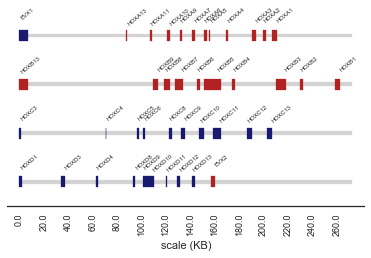

In [94]:
x_buffer = 10000
num_clusters = len(hoxGeneCoordsDF.seqid.unique())


sns.set(font_scale=1.0, style='white')
fig=plt.figure(figsize=(6.4,3.5))
fig.subplots_adjust(hspace=0,wspace=0)
gs = gridspec.GridSpec(num_clusters, 1)
base_cluster_length = hoxGeneCoordsDF.stop.max() + x_buffer
for i,scaffold in enumerate(['Scpiz6a_30.1','Scpiz6a_86','Scpiz6a_37','Scpiz6a_1']):
    ax = plt.subplot(gs[i, :])
    ax.set_ylim(0,4)
    #base_cluster_length = hoxGeneCoordsDF[hoxGeneCoordsDF.seqid == scaffold].stop.max() + x_buffer
    ax.set_xlim(-x_buffer, base_cluster_length + x_buffer)
    cluster_patch = coord_to_square(coord = (0,base_cluster_length), level = 2, color='lightgrey', width=0.15)
    ax.add_patch(cluster_patch)
    counter = 0 
    for i, row in hoxGeneCoordsDF[hoxGeneCoordsDF.seqid == scaffold].iterrows():
        if row['strand'] == '+':
            color = 'firebrick'
        else:
            color = 'midnightblue'
        evidence_square = coord_to_square(coord = (row['start'], row['stop']), level=2, color=color, width=0.45)
        ax.add_patch(evidence_square)
        if counter % 2 == 0:
            text_div = 15.0
        else:
            text_div = 1.3
        
        ax.annotate(row['gene'], xy=(row['start'] + ((row['stop'] - row['start']) / text_div),
                                   4.0), ha='left', fontsize=6, rotation=40)
        counter+=1 
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_yticks([])
    xticks = ax.get_xticks()
    ax.set_xticks([])
ax.spines['bottom'].set_visible(True)
ax.set_xticks(np.arange(0,280000,20000))
x1kb_labels = [str(x/1000) for x in ax.get_xticks()]
ax.set_xticklabels(x1kb_labels,fontsize=minorFontSize,rotation=90)
ax.set_xlabel("scale (KB)")
fig.savefig('../fig2/supplemental_figure_2.pdf',bbox_inches='tight',pad_inches=0.1)

In [95]:
hoxGeneCoordsDF.seqid.unique()
['Scpiz6a_30.1','Scpiz6a_86','Scpiz6a_37','Scpiz6a_1']

['Scpiz6a_30.1', 'Scpiz6a_86', 'Scpiz6a_37', 'Scpiz6a_1']

## GATK

### Running GATK

The following python command line tool was used organize and run the gatk pipeline on our computational server. The tool outputs shell scripts that can be run directly from the commandline. In hindsight making this tool was a bit of a waste of time, given that GATK has since provided their own framework for running GATK

In [ ]:
# %load ../bin/gatk6_pipeline.py
#!/usr/bin/env python
#Author: Duncan Tormey
#Email: dut@stowers.org or duncantormey@gmail.com

import os
import sys
import datetime
import argparse
from collections import defaultdict
sys.path = ["/home/dut/bin/python_scripts/"] + sys.path
import lims_classes as lims


def make_script_fh(base_name):
    date = datetime.datetime.today()
    date = str(date)
    date = date[:10]
    name = './%s_%s.sh' % (base_name, date)
    fh = open(name, "w")
    return fh, name


def make_output_dir(directory_name):
    working_directory = os.getcwd()
    output_directory = working_directory + "/" + directory_name
    if not os.path.exists(output_directory):
        os.makedirs(output_directory)
    return output_directory


def make_proc_capture(i):
    proc_capture = 'proc%s=$!\n' % str(i)
    proc = '\"$proc%s\"' % str(i)
    return proc_capture, proc


def prep_reference_commands(fasta_path,  picard_tools_path, write_prep_ref):
    output_dir = make_output_dir("reference")
    fasta_name = os.path.basename(fasta_path)
    fasta_ref_path = output_dir + "/" + fasta_name
    fasta_dict_path = output_dir + "/" + fasta_name.replace(".fa", ".dict")
    create_seq_dict = picard_tools_path + 'CreateSequenceDictionary.jar'
    sym_link = "ln -s %s %s/\n" % (fasta_path, output_dir)
    bwa_index = "bwa index -a bwtsw %s\n" % fasta_ref_path
    samtools_faidx = "samtools faidx %s\n" % fasta_ref_path
    sequence_dir = "java -jar %s REFERENCE=%s OUTPUT=%s\n" % (
        create_seq_dict, fasta_ref_path, fasta_dict_path)

    if write_prep_ref:
        fh, scriptname = make_script_fh("gatk_0_prep_ref")
        fh.write("#!/bin/bash\n")
        fh.write(sym_link)
        fh.write(bwa_index)
        fh.write(samtools_faidx)
        fh.write(sequence_dir)

        fh.close()

    return fasta_ref_path, scriptname


def ret_down_sample_read_pairs(pairs, sample, dwn_frac,outdir):
    #print(pairs)
    dwn_frac = float(dwn_frac)
    r_pair = pairs[0].path
    f_pair = pairs[1].path
    seed=sum([ord(a) for a in sample])
    pairs[0].path = outdir + '/' + os.path.basename(r_pair).replace('.fq.gz', '.%sds.fq'%str(dwn_frac)).replace('.fastq.gz', '.%sds.fastq'%str(dwn_frac))
    pairs[1].path = outdir + '/' + os.path.basename(f_pair).replace('.fq.gz', '.%sds.fq'%str(dwn_frac)).replace('.fastq.gz', '.%sds.fastq'%str(dwn_frac))
    dwn_sample_cmd = 'seqtk sample -s%s %s %s > %s; seqtk sample -s%s %s %s > %s &\n' % (seed, r_pair, dwn_frac, pairs[0].path,
                                                                                         seed, f_pair, dwn_frac, pairs[1].path)
    return dwn_sample_cmd, pairs

def down_sample_cmds(lane_pairs, down_sample, write, write_prefix, outdir):
    print('\n\n')
    print(lane_pairs)
    print('\n\n')
    outdir = make_output_dir(outdir)
    down_samples = dict(down_sample)  
    if write:
        fh, scriptname = make_script_fh(write_prefix)
        fh.write("#!/bin/bash\n")
    n = 1
    all_procs = []
    for sample in lane_pairs:
        if sample in down_samples:
            for  lane, pairs in lane_pairs[sample].items():
                print(sample)
                print(lane)
                print(pairs)
                cmd, pairs = ret_down_sample_read_pairs(pairs, sample, down_samples[sample], outdir)
                
                proc_capture, proc = make_proc_capture(n)
                all_procs.append(proc)
                if write:
                    fh.write(cmd)
                    fh.write(proc_capture)
                
                n+=1
                lane_pairs[sample][lane] = pairs
    if write:
        wait_command = "wait %s\n" % " ".join(all_procs)
        fh.write(wait_command)
        
    return lane_pairs, scriptname
                
def ret_bwa_align_sort_cmd(pairs, sample, outdir, cpus, fasta_ref_path):
    cpus = str(cpus)
    r_pair = pairs[0].path
    f_pair = pairs[1].path
    lane_id = pairs[0].lane_id
    read_group = pairs[0].read_group

    output_bam = '%s/%s.bam' % (outdir, lane_id)
    bwa_command = "bwa mem -M -R \"%s\" -t %s %s %s %s" % (
        read_group, cpus, fasta_ref_path, r_pair, f_pair)
    sam_to_sorted_bam = ('samtools view -Sb -@ %s - | '
                         'samtools sort -o -@ %s - %s > %s') % (
        cpus, cpus, lane_id, output_bam)

    align_sort_cmd = "(%s | %s) &\n" % (bwa_command, sam_to_sorted_bam)

    return align_sort_cmd, output_bam


def ret_dedup_cmd(sample_input,  sample, outdir, picard_tools_path):
    dedup = '%s/MarkDuplicates.jar' % picard_tools_path
    dedup_basename = os.path.basename(sample_input).replace('.bam', '')
    dedup_metric = '%s/%s_metrics.txt' % (outdir, dedup_basename)
    dedup_output = '%s/%s.dedup.bam' % (outdir, dedup_basename)
    dedup_command = "java -Xmx4g -jar %s I=%s O=%s M=%s &\n" % (
        dedup, sample_input, dedup_output, dedup_metric)

    return dedup_command, dedup_output


def ret_merge_bams_cmd(sample_input,  sample, outdir, cpus, tempdir):
    cpus = str(cpus)
    bam_files = ' '.join(sample_input)
    temp_file = '%s/%s.temp' % (tempdir, sample)
    out_bam = '%s/%s.merged.bam' % (outdir, sample)
    merge_cmd = ('(samtools merge -@ %s - %s | samtools sort '
                 '- -m 10G -@ %s -T %s -o %s; samtools index %s) &\n') % (
                     cpus, bam_files, cpus, temp_file, out_bam, out_bam)

    return merge_cmd, out_bam


def ret_index_cmd(sample_input, sample, outdir):
    index_cmd = 'samtools index -b %s &\n' % sample_input

    return index_cmd, sample_input


def ret_realign_indels_cmd(sample_input, sample, outdir, cpus, fasta_ref_path, gatk_path):
    realign_basename = os.path.basename(sample_input).replace('.bam', '')
    realign_list = '%s/%s_target_intervals.list' % (outdir, realign_basename)
    out_bam = '%s/%s.realigned.bam' % (outdir, realign_basename)
    targets_cmd = '%s -T RealignerTargetCreator -R %s -I %s -o %s -nt %s' % (
        gatk_path, fasta_ref_path, sample_input, realign_list, cpus)

    raln_cmd = '%s -T IndelRealigner -R %s -I %s -targetIntervals %s -o %s' % (
        gatk_path, fasta_ref_path, sample_input, realign_list, out_bam)

    target_realign_cmd = '(%s; %s) &\n' % (targets_cmd, raln_cmd)

    return target_realign_cmd, out_bam


def ret_haplotype_caller_cmd(sample_input, sample, outdir, fasta_ref_path,
                             gatk_path, gatk_args, i, param_string=None):
    out_vars = '%s/%s.%s_raw_var.vcf' % (outdir, sample, str(i))
    if param_string:
        cmd = '%s -T HaplotypeCaller %s -R %s -I %s %s -o %s' % (
            gatk_path, param_string, fasta_ref_path,
            sample_input, gatk_args, out_vars)
    else:
        cmd = '%s -T HaplotypeCaller -R %s -I %s %s -o %s' % (
            gatk_path, fasta_ref_path, sample_input, gatk_args, out_vars)

    return cmd, out_vars


def ret_extract_snps_cmd(input_vars, sample, gatk_path, fasta_ref_path,
                         outdir, i):
    out_snps = '%s/%s.%s_raw_snps.vcf' % (outdir, sample, str(i))
    cmd = '%s -T SelectVariants -R %s -V %s -selectType SNP -o %s' % (
        gatk_path, fasta_ref_path, input_vars, out_snps)

    return cmd, out_snps


def ret_filter_snps_cmd(input_snps, sample, gatk_path, snp_filter,
                        snp_filter_name, fasta_ref_path, outdir, i):
    out_snps = '%s/%s.%s_filt_snps.vcf' % (outdir, sample, str(i))
    cmd = '%s -T VariantFiltration -R %s -V %s --filterExpression \"%s\" --filterName \"%s\" -o %s' % (
        gatk_path, fasta_ref_path, input_snps, snp_filter, snp_filter_name, out_snps)

    return cmd, out_snps


def ret_extract_indels_cmd(input_vars, sample, gatk_path, fasta_ref_path,
                           outdir, i):
    out_indels = '%s/%s.%s_raw_indels.vcf' % (outdir, sample, str(i))
    cmd = '%s -T SelectVariants -R %s -V %s -selectType INDEL -o %s' % (
        gatk_path, fasta_ref_path, input_vars, out_indels)

    return cmd, out_indels


def ret_filter_indels_cmd(input_indels, sample, gatk_path, indel_filter,
                          indel_filter_name, fasta_ref_path, outdir, i):
    out_indels = '%s/%s.%s_filt_indels.vcf' % (outdir, sample, str(i))
    cmd = '%s -T VariantFiltration -R %s -V %s --filterExpression \"%s\" --filterName \"%s\" -o %s' % (
        gatk_path, fasta_ref_path, input_indels, indel_filter,
        indel_filter_name, out_indels)

    return cmd, out_indels


def ret_combine_snps_cmd(all_snps, gatk_path, fasta_ref_path, outdir, i):
    out_snps = '%s/all_snps_%s.vcf' % (outdir, str(i))
    cmd = '%s -R %s -T CombineVariants --variant %s -o %s --excludeNonVariants --minimumN 1' % (
        gatk_path, fasta_ref_path, ' --variant '.join(all_snps), out_snps)

    return cmd, out_snps


def ret_combine_indels_cmd(all_indels, gatk_path, fasta_ref_path, outdir, i):
    out_indels = '%s/all_indels_%s.vcf' % (outdir, str(i))
    cmd = '%s -R %s -T CombineVariants --variant %s -o %s --excludeNonVariants --minimumN 1' % (
        gatk_path, fasta_ref_path, ' --variant '.join(all_indels), out_indels)

    return cmd, out_indels


def ret_vcf_tools_snp_cmd(input_snps, snp_filter_name):
    out_snps = input_snps.replace('.vcf', '')

    cmd = 'vcftools --vcf %s --remove-filtered LowQual --remove-filtered %s --recode --recode-INFO-all --out %s' % (
        input_snps, snp_filter_name, out_snps)

    out_snps = out_snps + '.recode.vcf'
    return cmd, out_snps


def ret_vcf_tools_indel_cmd(input_indels, indel_filter_name):
    out_indels = input_indels.replace('.vcf', '')
    cmd = 'vcftools --vcf %s --remove-filtered LowQual --remove-filtered %s --recode --recode-INFO-all --out %s' % (
        input_indels, indel_filter_name, out_indels)

    out_indels = out_indels + '.recode.vcf'
    return cmd, out_indels


def ret_first_recal_cmd(input_indels, input_snps, sample_input, sample, outdir,
                        gatk_path, fasta_ref_path, i):
    before_table = '%s/%s_%s.before_table' % (outdir, sample, str(i))
    cmd = '%s -T BaseRecalibrator -R %s -I %s -knownSites %s -knownSites %s -o %s' % (
        gatk_path, fasta_ref_path, sample_input, input_indels, input_snps,
        before_table)
    return cmd, before_table


def ret_print_reads_cmd(sample_input, recal_table, sample, outdir, gatk_path,
                        fasta_ref_path, i):
    out_bam = os.path.basename(sample_input).replace(
        '.bam', '.recal_%s.bam' % str(i))
    out_bam = '%s/%s' % (outdir, out_bam)
    cmd = '%s -T PrintReads -R %s -I %s -BQSR %s -o %s' % (
        gatk_path, fasta_ref_path, sample_input, recal_table, out_bam)

    return cmd, out_bam


def ret_second_recal_cmd(input_indels, input_snps, sample_input, before_table,
                         sample, outdir, gatk_path, fasta_ref_path, i):
    after_table = '%s/%s_%s.after_table' % (outdir, sample, str(i))
    cmd = '%s -T BaseRecalibrator -R %s -I %s -knownSites %s -knownSites %s -BQSR %s -o %s' % (
        gatk_path, fasta_ref_path, sample_input, input_snps, input_indels,
        before_table, after_table)
    return cmd, after_table


def ret_recal_plot_cmd(before_table, after_table, sample, outdir, gatk_path,
                       fasta_ref_path, i):
    recal_plot = '%s/%s_%s.plots' % (outdir, sample, str(i))
    cmd = '%s -T AnalyzeCovariates -R %s -before %s -after %s -plots %s' % (
        gatk_path, fasta_ref_path, before_table, after_table, recal_plot)

    return cmd


def ret_genotype_gvcf_command(sample_inputs, fasta_ref_path, gatk_path, cpus, outdir):
    all_inputs = '--variant %s' % ' --variant '.join(
        [item for sublist in sample_inputs.values() for item in sublist])
    output_gvcf = '%s/jg_%s.gvcf' % (outdir, '_'.join(sample_inputs.keys()))
    cmd = '%s -T GenotypeGVCFs -nt %s -ploidy 2 -R %s %s -allSites -o %s\n' % (
        gatk_path, cpus, fasta_ref_path, all_inputs, output_gvcf)

    return cmd, output_gvcf


def ret_hc_call_cmds(sample_input, sample, fasta_ref_path, gatk_path, outdir, i, param_string=None):
    gatk_args = " -stand_call_conf 30 -stand_emit_conf 30 -mbq 17 "
    snp_filter = 'QD < 2.0 || FS > 60.0 || MQ < 40.0 || MQRankSum < -12.5 || ReadPosRankSum < -8.0'
    indel_filter = 'QD < 2.0 || FS > 200.0 || ReadPosRankSum < -20.0'
    indel_filter_name = 'default_indel_filter'
    snp_filter_name = 'default_snp_filter'
    haplotype_caller_cmd, out_vars = ret_haplotype_caller_cmd(
        sample_input=sample_input, sample=sample, outdir=outdir,
        fasta_ref_path=fasta_ref_path, gatk_path=gatk_path,
        gatk_args=gatk_args, i=i, param_string=param_string)

    extract_snps_cmd, raw_snps = ret_extract_snps_cmd(
        input_vars=out_vars, sample=sample, gatk_path=gatk_path,
        fasta_ref_path=fasta_ref_path, outdir=outdir, i=i)

    filter_snps_cmd, out_snps = ret_filter_snps_cmd(
        input_snps=raw_snps, sample=sample, gatk_path=gatk_path,
        snp_filter=snp_filter, snp_filter_name=snp_filter_name,
        fasta_ref_path=fasta_ref_path, outdir=outdir, i=i)

    extract_indels_cmd, raw_indels = ret_extract_indels_cmd(
        input_vars=out_vars, sample=sample, gatk_path=gatk_path,
        fasta_ref_path=fasta_ref_path, outdir=outdir, i=i)

    filter_indels_cmd, out_indels = ret_filter_indels_cmd(
        input_indels=raw_indels, sample=sample, gatk_path=gatk_path,
        indel_filter=indel_filter, indel_filter_name=indel_filter_name,
        fasta_ref_path=fasta_ref_path, outdir=outdir, i=i)

    hc_commands = '(%s) &\n' % '; '.join(
        [haplotype_caller_cmd, extract_snps_cmd, filter_snps_cmd,
         extract_indels_cmd, filter_indels_cmd])

    return hc_commands, out_snps, out_indels


def ret_recode_indels_and_snps_cmd(all_snps, all_indels, snp_filter_name,
                                   indel_filter_name, gatk_path,
                                   fasta_ref_path, outdir, i):

    combine_snps_cmd, out_snps = ret_combine_snps_cmd(
        all_snps=all_snps, gatk_path=gatk_path, fasta_ref_path=fasta_ref_path,
        outdir=outdir, i=i)

    combine_indels_cmd, out_indels = ret_combine_indels_cmd(
        all_indels=all_indels, gatk_path=gatk_path,
        fasta_ref_path=fasta_ref_path, outdir=outdir, i=i)

    vcf_tools_snp_cmd, recode_snps = ret_vcf_tools_snp_cmd(
        input_snps=out_snps, snp_filter_name=snp_filter_name)

    vcf_tools_indel_cmd, recode_indels = ret_vcf_tools_indel_cmd(
        input_indels=out_indels, indel_filter_name=indel_filter_name)

    combine_recode_cmd = '%s\n' % '\n'.join(
        [combine_snps_cmd, combine_indels_cmd, vcf_tools_snp_cmd,
         vcf_tools_indel_cmd])

    return combine_recode_cmd, recode_snps, recode_indels


def ret_recalibration_cmds(sample_input, sample, outdir, input_snps,
                           input_indels, gatk_path, fasta_ref_path, i):
    first_recal_cmd, before_table = ret_first_recal_cmd(
        input_indels=input_indels, input_snps=input_snps, sample_input=sample_input,
        sample=sample, outdir=outdir, gatk_path=gatk_path,
        fasta_ref_path=fasta_ref_path, i=i)

    print_reads_cmd, out_bam = ret_print_reads_cmd(
        sample_input=sample_input, recal_table=before_table, sample=sample,
        outdir=outdir, gatk_path=gatk_path, fasta_ref_path=fasta_ref_path,
        i=i)

    second_recal_cmd, after_table = ret_second_recal_cmd(
        input_indels=input_indels, input_snps=input_snps, sample_input=sample_input,
        before_table=before_table, sample=sample, outdir=outdir,
        gatk_path=gatk_path, fasta_ref_path=fasta_ref_path, i=i)

    recal_plot_cmd = ret_recal_plot_cmd(
        before_table=before_table, after_table=after_table, sample=sample,
        outdir=outdir, gatk_path=gatk_path, fasta_ref_path=fasta_ref_path, i=i)

    recal_cmd = '(%s) &\n' % '; '.join(
        [first_recal_cmd, print_reads_cmd, second_recal_cmd, recal_plot_cmd])

    return recal_cmd, out_bam


def final_variant_calling(input_dict, fasta_ref_path, gatk_path, cpus, write,
                          write_prefix, hcgvcfs):
    if write:
        fh, scriptname = make_script_fh(write_prefix)
        fh.write("#!/bin/bash\n")
    gatk_args = " -stand_call_conf 30 -stand_emit_conf 30 -mbq 17 "
    param_string = '--variant_index_type LINEAR --variant_index_parameter 128000 -ERC GVCF'
    hc_outdir = make_output_dir('final_variant_calling/hc_variant_calling')
    jg_outdir = make_output_dir('final_variant_calling/joint_genotypes')
    variant_dict = defaultdict(list)
    snp_filter = 'QD < 2.0 || FS > 60.0 || MQ < 40.0 || MQRankSum < -12.5 || ReadPosRankSum < -8.0'
    indel_filter = 'QD < 2.0 || FS > 200.0 || ReadPosRankSum < -20.0'
    indel_filter_name = 'default_indel_filter'
    snp_filter_name = 'default_snp_filter'
    p = 0
    job_procs = []

    for sample in input_dict:
        cmd, out_var = ret_haplotype_caller_cmd(
            sample_input=input_dict[sample][0], sample=sample,
            outdir=hc_outdir, fasta_ref_path=fasta_ref_path,
            gatk_path=gatk_path, gatk_args=gatk_args,
            i='final', param_string=param_string)
        variant_dict[sample].append(out_var)
        proc_capture, proc = make_proc_capture(p)
        job_procs.append(proc)
        if write:
            fh.write(cmd + ' &\n')
            fh.write(proc_capture)
        p += 1

    wait_command = "wait %s\n" % " ".join(job_procs)
    job_procs = []
    
    if write:
        fh.write(wait_command)

    if hcgvcfs:
        for sample, gvcf in hcgvcfs:
            variant_dict[sample].append(gvcf)
        
    genotype_cmd, out_gvcf = ret_genotype_gvcf_command(
        sample_inputs=variant_dict, fasta_ref_path=fasta_ref_path,
        gatk_path=gatk_path, cpus=cpus, outdir=jg_outdir)

    if write:
        fh.write(genotype_cmd)
    sample = '_'.join(input_dict.keys())
    extract_snps_cmd, raw_snps = ret_extract_snps_cmd(
        input_vars=out_gvcf, sample=sample, gatk_path=gatk_path,
        fasta_ref_path=fasta_ref_path, outdir=jg_outdir, i='final')

    filter_snps_cmd, out_snps = ret_filter_snps_cmd(
        input_snps=raw_snps, sample=sample, gatk_path=gatk_path,
        snp_filter=snp_filter, snp_filter_name=snp_filter_name,
        fasta_ref_path=fasta_ref_path, outdir=jg_outdir, i='final')

    extract_indels_cmd, raw_indels = ret_extract_indels_cmd(
        input_vars=out_gvcf, sample=sample, gatk_path=gatk_path,
        fasta_ref_path=fasta_ref_path, outdir=jg_outdir, i='final')

    filter_indels_cmd, out_indels = ret_filter_indels_cmd(
        input_indels=raw_indels, sample=sample, gatk_path=gatk_path,
        indel_filter=indel_filter, indel_filter_name=indel_filter_name,
        fasta_ref_path=fasta_ref_path, outdir=jg_outdir, i='final')

    remove_nocall_cmd = 'cat %s | grep -v \'\./\.\'  > %s' % (
        out_gvcf, out_gvcf.replace('.gvcf', '.no_call_removed.gvcf'))
    badsnps_cmd = 'cat %s | grep \'%s\' | cut -f 1,2 > %s/bad_snps.tsv' % (
        out_snps, snp_filter_name, jg_outdir)
    badindels_cmd = 'cat %s   | grep \'%s\' | cut -f 1,2 > %s/bad_indels.tsv' % (
        out_indels, indel_filter_name, jg_outdir)
    bad_positions_cmd = 'cat %s/bad_indels.tsv %s/bad_snps.tsv > %s/bad_positions.tsv' % (
        jg_outdir, jg_outdir, jg_outdir)
    remove_bad_positions = 'vcftools --vcf %s --recode --out %s --exclude-positions %s/bad_positions.tsv' % (
        out_gvcf.replace('.gvcf', '.no_call_removed.gvcf'), out_gvcf.replace('.gvcf', '.no_call_removed.filt'), jg_outdir)

    if write:
        fh.write(extract_snps_cmd + '\n')
        fh.write(filter_snps_cmd + '\n')
        fh.write(extract_indels_cmd + '\n')
        fh.write(filter_indels_cmd + '\n')
        fh.write(remove_nocall_cmd + '\n')
        fh.write(badsnps_cmd + '\n')
        fh.write(badindels_cmd + '\n')
        fh.write(bad_positions_cmd + '\n')
        fh.write(remove_bad_positions + '\n')

        fh.close()

    return out_gvcf, scriptname


def training_commands(input_dict, rounds, fasta_ref_path, gatk_path, write,
                      write_prefix):
    variant_outdir = make_output_dir('training/variant_calling')
    recal_outdir = make_output_dir('training/recal_bams')
    if write:
        fh, scriptname = make_script_fh(write_prefix)
        fh.write('#!/bin/bash\n')
    job_procs = []
    p = 0
    print(rounds, range(rounds))
    for i in range(rounds):
        all_snps = []
        all_indels = []
        if i == 0:
            bam_dict = input_dict
        else:
            bam_dict = recal_bams
        for sample in bam_dict:
            hc_cmd, snps, indels = ret_hc_call_cmds(
                sample_input=bam_dict[sample][0], sample=sample,
                fasta_ref_path=fasta_ref_path, gatk_path=gatk_path,
                outdir=variant_outdir, i=i)

            all_snps.append(snps)
            all_indels.append(indels)
            proc_capture, proc = make_proc_capture(p)
            job_procs.append(proc)
            if write:
                fh.write(hc_cmd)
                fh.write(proc_capture)
            p += 1
        wait_command = "wait %s\n" % " ".join(job_procs)
        job_procs = []
        if write:
            fh.write(wait_command)

        recode_cmd, recode_snps, recode_indels = ret_recode_indels_and_snps_cmd(
            all_snps=all_snps, all_indels=all_indels,
            snp_filter_name='default_snp_filter',
            indel_filter_name='default_indel_filter', gatk_path=gatk_path,
            fasta_ref_path=fasta_ref_path, outdir=variant_outdir, i=i)

        if write:
            fh.write(recode_cmd)
        recal_bams = defaultdict(list)
        if i < rounds - 1:
            for sample in bam_dict:
                recal_cmd, recal_bam = ret_recalibration_cmds(
                    input_snps=recode_snps, input_indels=recode_indels,
                    sample_input=bam_dict[sample][0], sample=sample,
                    gatk_path=gatk_path, fasta_ref_path=fasta_ref_path,
                    outdir=recal_outdir, i=i)

                recal_bams[sample].append(recal_bam)
                proc_capture, proc = make_proc_capture(p)
                job_procs.append(proc)
                if write:
                    fh.write(recal_cmd)
                    fh.write(proc_capture)
                p += 1
            wait_command = "wait %s\n" % " ".join(job_procs)
            job_procs = []
            if write:
                fh.write(wait_command)
    fh.close()

    return recode_snps, recode_indels, scriptname


def parallel_cmd_loop(input_dict, nested, write, write_prefix,
                      cmd_function, outdir, **kwargs):
    out_dict = defaultdict(list)
    outdir = make_output_dir(outdir)
    if write:
        fh, scriptname = make_script_fh(write_prefix)
        fh.write("#!/bin/bash\n")
    n = 1
    all_procs = []
    job_procs = []
    out_dict = defaultdict(list)
    for sample in input_dict:
        if nested:
            try:
                nested_inputs = input_dict[sample].values()
            except AttributeError:
                nested_inputs = input_dict[sample]

            for nested_input in nested_inputs:
                cmd, output = cmd_function(
                    nested_input, sample, outdir, **kwargs)
                proc_capture, proc = make_proc_capture(n)
                if write:
                    fh.write(cmd)
                    fh.write(proc_capture)

                job_procs.append(proc)
                all_procs.append(proc)

                if n % 3 == 0:
                    wait_command = "wait %s\n" % " ".join(job_procs)
                    job_procs = []
                    if write:
                        fh.write(wait_command)

                out_dict[sample].append(output)
                # print(out_dict)
                n += 1
        else:
            # print(input_dict[sample])
            if type(input_dict[sample]) == list and len(input_dict[sample]) == 1:
                sample_input = input_dict[sample][0]
            else:
                sample_input = input_dict[sample]

            cmd, output = cmd_function(
                sample_input=sample_input, sample=sample, outdir=outdir, **kwargs)
            # print(output)
            proc_capture, proc = make_proc_capture(n)
            if write:
                fh.write(cmd)
                fh.write(proc_capture)

            job_procs.append(proc)
            all_procs.append(proc)

            if n % 3 == 0:
                wait_command = "wait %s\n" % " ".join(job_procs)
                job_procs = []
                if write:
                    fh.write(wait_command)

            out_dict[sample].append(output)

            n += 1

    if write:
        wait_command = "wait %s\n" % " ".join(all_procs)
        fh.write(wait_command)

    return out_dict, scriptname


def run(args):

    molng = lims.read_list_file(args.molngs)
    samples = lims.read_list_file(args.samples)
    flowcells = lims.read_list_file(args.flowcells)
    train = args.train
    
    fasta_path = args.fasta_path
    cpus = 8
    picard_tools_path = args.picard_path
    gatk = args.gatk_execute

    print(args.hcgvcfs)
    
    tigris_report = lims.Indexed_sample_reports(molng, samples)
    tigris_report.select_flowcells(flowcells)
    lane_pairs = tigris_report.ret_nested_pair_by_lane()
    scripts = []

    
    fasta_ref_path, s0 = prep_reference_commands(
        fasta_path, picard_tools_path, True)
    scripts.append(s0)

    if args.down_sample:
        print(args.down_sample)
        lane_pairs, dwn_s = down_sample_cmds(lane_pairs, args.down_sample, write=True,
                                            write_prefix='gatk_down_sample',outdir='preprocessing/down_sample')
        scripts.append(dwn_s)
        
    lane_bams, s1 = parallel_cmd_loop(
        input_dict=lane_pairs, nested=True, write=True,
        write_prefix='gatk_1_map_to_ref', cmd_function=ret_bwa_align_sort_cmd,
        outdir='preprocessing/map_to_ref_output', cpus=8,
        fasta_ref_path=fasta_ref_path)
    scripts.append(s1)
    
    dedup_lane_bams, s2 = parallel_cmd_loop(
        input_dict=lane_bams, nested=True, write=True,
        write_prefix='gatk_2_dedup_individual', cmd_function=ret_dedup_cmd,
        outdir='preprocessing/dedup_individuals',
        picard_tools_path=picard_tools_path)
    scripts.append(s2)
    
    sample_bams, s3 = parallel_cmd_loop(
        input_dict=dedup_lane_bams, nested=False, write=True,
        write_prefix='gatk_3_merge_bams', cmd_function=ret_merge_bams_cmd,
        outdir='preprocessing/merged_bams', cpus=8, tempdir='/scratch/dut')
    scripts.append(s3)
    
    deduped_sample_bams, s4 = parallel_cmd_loop(
        input_dict=sample_bams, nested=False, write=True,
        write_prefix='gatk_4_dedup_merged', cmd_function=ret_dedup_cmd,
        outdir='preprocessing/dedup_merged',
        picard_tools_path=picard_tools_path)
    scripts.append(s4)
    
    deduped_sample_bams, s5 = parallel_cmd_loop(
        input_dict=deduped_sample_bams, nested=False, write=True,
        write_prefix='gatk_5_index', cmd_function=ret_index_cmd,
        outdir='preprocessing/deduped_merged')
    scripts.append(s5)
    
    realigned_sample_bams, s6 = parallel_cmd_loop(
        input_dict=deduped_sample_bams, nested=False, write=True,
        write_prefix='gatk_6_realign_bams', cmd_function=ret_realign_indels_cmd,
        outdir='preprocessing/realigned_merged_bams', cpus=8,
        fasta_ref_path=fasta_ref_path, gatk_path=gatk)
    scripts.append(s6)
    
    if train:
        known_snps, known_indels, s7 = training_commands(
            input_dict=realigned_sample_bams, rounds=4, fasta_ref_path=fasta_ref_path,
            gatk_path=gatk, write=True, write_prefix='gatk_7_training')
        scripts.append(s7)
    elif args.known_snps and args.known_indels:
        known_snps = args.known_snps
        known_indels = args.known_indels
    else:
        print('train must be set to true or known snps and indels must be provieded')
        sys.exit(1)
        
    recalibrated_bams, s8 = parallel_cmd_loop(
        input_dict=realigned_sample_bams, nested=False, write=True,
        write_prefix='gatk_8_recalibrate_bams', outdir='final_variant_calling/recal_bams',
        cmd_function=ret_recalibration_cmds, input_snps=known_snps,
        input_indels=known_indels, gatk_path=gatk, fasta_ref_path=fasta_ref_path, i='final')
    scripts.append(s8)
    
    gvcf, s9 = final_variant_calling(input_dict=recalibrated_bams, fasta_ref_path=fasta_ref_path,
                                     gatk_path=gatk, cpus=24, write=True,
                                     write_prefix='gatk_9_final_variant_calling', hcgvcfs = args.hcgvcfs)
    scripts.append(s9)
    
    fh, _ = make_script_fh('master')

    fh.write('#!/bin/bash\n')
    
    commands = ['echo \"%s\"\ntime %s &> %s\n' % (
        x.replace('./', '').replace('.sh', ''),
        x,
        x.replace('./', '').replace('.sh', '.out'),
    ) for x in scripts]
    commands = ''.join(commands)
    fh.write(commands)

if __name__ == '__main__':
    parser = argparse.ArgumentParser()

    parser.add_argument('-molngs', action='store', dest='molngs',
                        help='path to file with all molngs paths seperated by newlines')

    parser.add_argument('-samples', action='store', dest='samples',
                        help='path to file with all sample names seperated by newlines')

    parser.add_argument('-flowcells', action='store', dest='flowcells',
                        help='path to file with all flowcell names seperated by newlines')

    parser.add_argument ('-down_sample', nargs=2, action='append',
                         help='pass sample name and fraction to down sample to, e.g -down_sample Atig_122 0.33')
    
    parser.add_argument('-cpus', action='store', dest='cpus', default='8',
                        help='number of cpus to use per sample')

    parser.add_argument('-fasta_path', action='store', dest='fasta_path',
                        default='/home/dut/projects/tigris/genome_annotation/fasta/tigris_scaffolds_filt_10000.fa',
                        help='path to genome fasta')
    
    parser.add_argument('-picard_path', action='store', dest='picard_path',
                        default='/home/dut/bin/picard-tools-1.119/',
                        help='path to picard tools')

    parser.add_argument('-gatk_execute', action='store', dest='gatk_execute',
                        default='java -Xmx3g -jar /home/dut/bin/GenomeAnalysisTK-3.5/GenomeAnalysisTK.jar',
                        help='gatk executable prefix')

    parser.add_argument('-train', action='store_true', dest='train',
                        default=False, help='train for known indels and snps')
    
    parser.add_argument('-known_snps', action='store', dest='known_snps',
                        help='path to known snps(required if training set to false)')

    parser.add_argument('-known_indels', action='store', dest='known_indels',
                        help='path to known indels(required if training set to false)')

    parser.add_argument('-add_hcgvcf',action='append',nargs=2, dest='hcgvcfs',
                        help='additional gvcf files produced by HaplotypeCaller to be used in joint genotypeing(-add_hcgvcf sample_name path_to_file')

    args = parser.parse_args()

    run(args)


This tool outputs a series of bash scripts, meant to be run sequentially. During the course of writting and running our samples throught the pipeline, I found mutiple errors and had to restart steps. Below I include the bash scripts I ended up running in sequential order to generat our final GVCFs.

#### GATK Run on 8450, 001 and 003

Here are all of the bash commands run for the GATK pipline. Some of the scripts are redundant because errors were found that merited the re-running of commands.

In [96]:
%%bash
for file in `ls -1 ../data/gatk6/bash/*.sh`
 do
  echo "------------------------------------------- ${file} -------------------------------------------"
  cat $file
done

------------------------------------------- ../data/gatk6/bash/gatk_0_prep_ref_2016-03-31.sh -------------------------------------------
#!/bin/bash
ln -s /home/dut/projects/tigris/genome_annotation/fasta/tigris_scaffolds_filt_10000.fa /home/dut/projects/tigris/heterozygosity/gatk6/reference/
bwa index -a bwtsw /home/dut/projects/tigris/heterozygosity/gatk6/reference/tigris_scaffolds_filt_10000.fa
samtools faidx /home/dut/projects/tigris/heterozygosity/gatk6/reference/tigris_scaffolds_filt_10000.fa
java -jar /home/dut/bin/picard-tools-1.119/CreateSequenceDictionary.jar REFERENCE=/home/dut/projects/tigris/heterozygosity/gatk6/reference/tigris_scaffolds_filt_10000.fa OUTPUT=/home/dut/projects/tigris/heterozygosity/gatk6/reference/tigris_scaffolds_filt_10000.dict
------------------------------------------- ../data/gatk6/bash/gatk_1_map_to_ref_2016-03-31.sh -------------------------------------------
#!/bin/bash
(bwa mem -M -R "@RG\tID:A_tigris8450_L13136_HF7YWADXXb_2\tSM:A_tigris8450\tPL:

#### GATK Run on 122

Data for the mother was obtained later. We did not re-train, but instead ran the mother seperatately and then re-did the joint genotypeing steps. Here are the scripts for this run.

In [97]:
%%bash
for file in `ls -1 ../data/dwn_sample_atig_122/bash/*.sh`
 do
  echo "------------------------------------------- ${file} -------------------------------------------"
  cat $file
done

------------------------------------------- ../data/dwn_sample_atig_122/bash/gatk_0_prep_ref_2016-06-21.sh -------------------------------------------
#!/bin/bash
ln -s /home/dut/projects/tigris/genome_annotation/fasta/tigris_scaffolds_filt_10000.fa /home/dut/projects/tigris/heterozygosity/dwn_sample_atig_122/reference/
bwa index -a bwtsw /home/dut/projects/tigris/heterozygosity/dwn_sample_atig_122/reference/tigris_scaffolds_filt_10000.fa
samtools faidx /home/dut/projects/tigris/heterozygosity/dwn_sample_atig_122/reference/tigris_scaffolds_filt_10000.fa
java -jar /home/dut/bin/picard-tools-1.119/CreateSequenceDictionary.jar REFERENCE=/home/dut/projects/tigris/heterozygosity/dwn_sample_atig_122/reference/tigris_scaffolds_filt_10000.fa OUTPUT=/home/dut/projects/tigris/heterozygosity/dwn_sample_atig_122/reference/tigris_scaffolds_filt_10000.dict
------------------------------------------- ../data/dwn_sample_atig_122/bash/gatk_1_map_to_ref_2016-06-21.sh ------------------------------------

### GATK Initial Results Figure  (Generated by Morgan Weichert)

These figures were generated by Morgan Weichert. They summarize the heterozygous sites detected by GATK with a few hard filters applied.

In [98]:
%%bash
cp /home/msr/Projects/marmorata_genome/gatk_analysis_A_tigris8450_Atig_122_Atig003_Atig001/fig/top5_8-36x_het_sites_partheno_mom.papersize.png.pdf ../fig2/Figure5.pdf

In [99]:
cp /home/msr/Projects/marmorata_genome/gatk_analysis_A_tigris8450_Atig_122_Atig003_Atig001/fig/top5_8-36x_het_sites_partheno_mom.png ../fig/initial_gatk_results.png

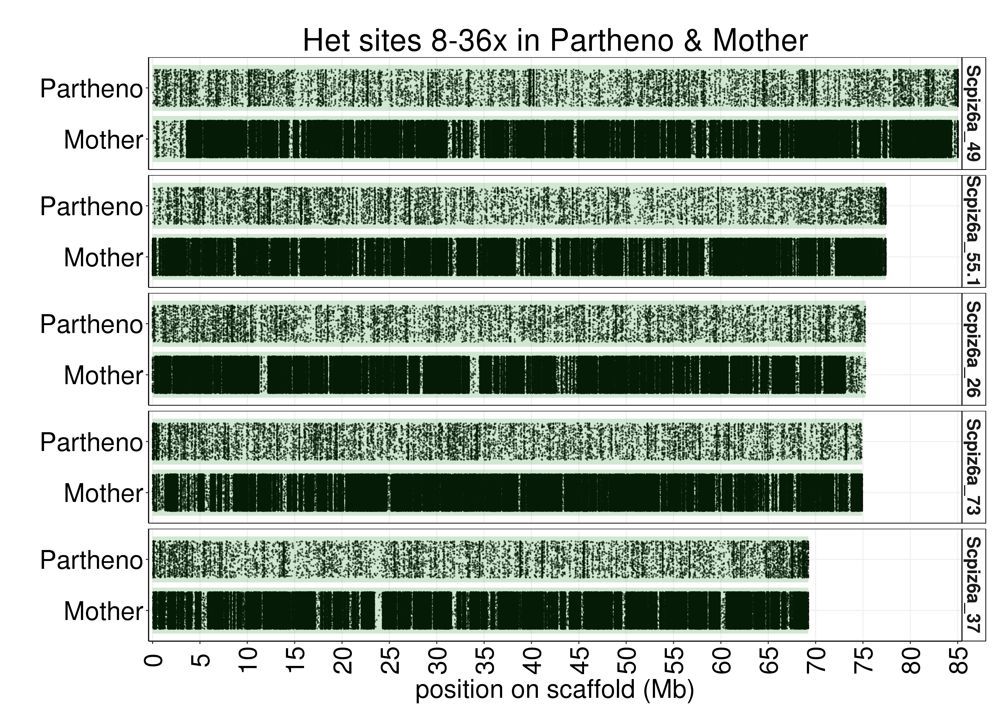

In [100]:
Image('/home/msr/Projects/marmorata_genome/gatk_analysis_A_tigris8450_Atig_122_Atig003_Atig001/fig/top5_8-36x_het_sites_partheno_mom.png', height=600, width=600)

## Coverage Accross Profiles and Affect on Heterozygosity

The following python script will convert an alignment bam file (indexed) into a tsv file of profiles.

In [ ]:
# %load ../bin/pysam_profiler.py
#!/usr/bin/env python
#Author: Duncan Tormey
#Email: dut@stowers.org or duncantormey@gmail.com
#################################################
# This script takes a bam file and a reference  #
# genome file as input. It uses the pysam       #
# python package to pull out the per position   #
# nucleotide coverage, and determes the statust #
# of the position(Transition, Transversion,     #
# Homozygous or Unknown)                        #
#################################################

from __future__ import print_function
from __future__ import division
import pysam
import pysamstats
import sys
import os

def get_prof_status(prof, bases=['A', 'C', 'G', 'T']):
    bases = [bases[i] for i, n in enumerate(prof) if n > 0]
    if len(bases) == 2:
        if bases == ['A', 'G'] or bases == ['C', 'T']:
            status = 'Transition'
        else:
            status = 'Transversion'
    elif len(bases) == 1:
            status = 'Homozygous'
    else:
        status = 'Unknown'

    prof.extend([sum(prof), status])

    return  prof

def write_profiles(bam_path, ref_path):
    outfile = './' + os.path.basename(bam_path).replace('.bam', '.prof')
    bam = pysam.AlignmentFile(bam_path)
    with open(outfile, 'w') as fh:
        fh.write('chrom\tpos\tA\tC\tG\tT\tcov\tstatus\n')
        for rec in pysamstats.stat_variation(bam, ref_path, pad=True, max_depth=1000000):
            prof = [rec['A'], rec['C'], rec['G'], rec['T']]
            prof = get_prof_status(prof)
            prof[:0] = [rec['chrom'], rec['pos']]
            fh.write('%s\n' % '\t'.join(map(str,prof)))


if __name__ == "__main__":
    if len(sys.argv) == 3:
        print(sys.argv)
        write_profiles(sys.argv[1], sys.argv[2])
    else:
        print('usage: pysam_profiler.py /path/to/alignment.bam /path/to/reference.fa')


The following python script takes a tsv profiles file as input and counts the unique profiles across the genome.

In [ ]:
# %load ../bin/count_profiles.py
#!/usr/bin/env python
#Author: Duncan Tormey
#Email: dut@stowers.org or duncantormey@gmail.com
##################################################
# This script takes the tsv file output by      #
# pysam_profiler.py and counts the occurence of #
# each unique profile, ignoring scaffold and    #
# position.                                     #
#################################################


from __future__ import print_function
from __future__ import division
import sys
import os
from collections import Counter


def count_profiles(prof_path):
    outfile = './' + os.path.basename(prof_path).replace('.prof', '.prof_counts')
    counts = Counter()
    with open(prof_path, 'r') as fh:
        fh.next() # skip header
        for line in fh:
            line = line.strip().split()
            prof = tuple(line[2:])
            counts[prof] += 1

    return counts, outfile


def write_profiles(counts, outfile):
    with open(outfile, 'w') as fho:
        fho.write('occurence\tA\tC\tG\tT\tcov\tstatus\n')
        for prof, count in counts.items():
            fho.write('%s\t%s\n' % (str(count), '\t'.join(map(str, prof))))
    

if __name__ == "__main__":
    if len(sys.argv) == 2:
        print(sys.argv)
        counts, outfile = count_profiles(sys.argv[1])
        write_profiles(counts, outfile)
    else:
        print('usage: count_profiles /path/to/profile ')


In [101]:
pysamCountsPaths = ['/n/projects/dut/a_marmorata/parthenogen_heterozygosity/data/pysam/Atig001.merged.dedup.realigned.prof_counts',
                     '/n/projects/dut/a_marmorata/parthenogen_heterozygosity/data/pysam/A_tigris8450.merged.dedup.realigned.prof_counts',
                     '/n/projects/dut/a_marmorata/parthenogen_heterozygosity/data/pysam/Atig003.merged.dedup.realigned.prof_counts',
                     '/n/projects/dut/a_marmorata/parthenogen_heterozygosity/data/pysam/Atig_122.merged.dedup.realigned.prof_counts']

In [102]:
profCountsDict = {os.path.basename(p).split('.')[0] :pd.read_csv(p, sep = '\t', header = 0) for p in pysamCountsPaths}

In [103]:
for animal in profCountsDict.keys():
    profCountsDict[animal]['animal'] = animal
    avg_cov = sum(profCountsDict[animal]['cov']*profCountsDict[animal]['occurence'])/profCountsDict[animal]['occurence'].sum()
    profCountsDict[animal]['avg_cov'] = avg_cov
    print(animal, avg_cov)

profCountDF= pd.concat(profCountsDict.values())
profCountDF.head()

A_tigris8450 17.5365944457
Atig_122 18.8524151373
Atig003 18.3134659875
Atig001 15.9133728851


,occurence,A,C,G,T,cov,status,animal,avg_cov
0,38,306,0,0,1,307,Transversion,A_tigris8450,17.536594
1,3,13,0,199,0,212,Transition,A_tigris8450,17.536594
2,1,0,58,6,4,68,Unknown,A_tigris8450,17.536594
3,1,1,2918,2,1,2922,Unknown,A_tigris8450,17.536594
4,1,4,3,770,2,779,Unknown,A_tigris8450,17.536594


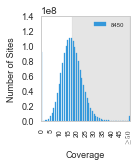

In [104]:
sns.set_style("whitegrid", {'axes.grid' : False})
animal="A_tigris8450"
outer_lim = 50
cov_dist = profCountDF[profCountDF.animal == animal][['cov','occurence']].groupby('cov')['occurence'].sum().reset_index()
cov_mean = sum(cov_dist['cov'] * cov_dist.occurence)/cov_dist.occurence.sum()
cov_dist['occurence'][cov_dist['cov'] >= outer_lim] = cov_dist['occurence'][cov_dist['cov'] >= outer_lim].sum()
cov_dist = cov_dist[cov_dist['cov'] <= outer_lim] 

plt.rc('font', size=minorFontSize)
ax1 = cov_dist.plot(x='cov',
                    y='occurence',
                    kind='bar',
                    legend=True,
                    color=color_ids[animal], 
                    label=change_name(animal), 
                    fontsize=minorFontSize, 
                    edgecolor=color_ids[animal],
                    figsize=(1.6,1.88)
                   )

ticks = ax1.xaxis.get_ticklocs()
ticklabels = [l.get_text() for l in ax1.xaxis.get_ticklabels()]
ticklabels[-1] = r'$\geq%s$'%str(outer_lim)
ax1.xaxis.set_ticks(ticks[::5])
ax1.xaxis.set_ticklabels(ticklabels[::5],rotation=90, fontsize=minorFontSize-2)


ax1.set_ylabel('Number of Sites', fontsize=minorFontSize)
ax1.set_xlabel('Coverage', fontsize=minorFontSize)
#ax1.set_title("Distribution of Coverage: %s" % change_name(animal))
ax1.set_ylim(0, 1.4e8)
ax1.set_yticks(np.arange(0,1.5e8,2e7))
#ax1.get_yaxis().get_major_formatter().set_useOffset(False)
ax1.yaxis.get_offset_text().set_fontsize(majorFontSize)
#add fill
ax1.fill_between((cov_mean, ax1.get_xlim()[1]),ax1.get_ylim()[0],ax1.get_ylim()[1],color='grey',alpha=0.2) 

#add figure label
ax1.legend(prop={'size':6})
fig = ax1.get_figure()
fig.savefig('../fig2/Figure6A1.pdf', bbox_inches='tight',)

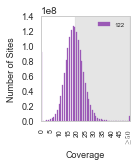

In [105]:
sns.set_style("whitegrid", {'axes.grid' : False})
animal="Atig_122"
outer_lim = 50
cov_dist = profCountDF[profCountDF.animal == animal][['cov','occurence']].groupby('cov')['occurence'].sum().reset_index()
cov_mean = sum(cov_dist['cov'] * cov_dist.occurence)/cov_dist.occurence.sum()
cov_dist['occurence'][cov_dist['cov'] >= outer_lim] = cov_dist['occurence'][cov_dist['cov'] >= outer_lim].sum()
cov_dist = cov_dist[cov_dist['cov'] <= outer_lim] 

plt.rc('font', size=minorFontSize)
ax1 = cov_dist.plot(x='cov',
                    y='occurence',
                    kind='bar',
                    legend=True,
                    color=color_ids[animal], 
                    label=change_name(animal), 
                    fontsize=minorFontSize, 
                    edgecolor=color_ids[animal],
                    figsize=(1.6,1.88)
                   )

ticks = ax1.xaxis.get_ticklocs()
ticklabels = [l.get_text() for l in ax1.xaxis.get_ticklabels()]
ticklabels[-1] = r'$\geq%s$'%str(outer_lim)
ax1.xaxis.set_ticks(ticks[::5])
ax1.xaxis.set_ticklabels(ticklabels[::5],rotation=90, fontsize=minorFontSize-2)


ax1.set_ylabel('Number of Sites', fontsize=minorFontSize)
ax1.set_xlabel('Coverage', fontsize=minorFontSize)
#ax1.set_title("Distribution of Coverage: %s" % change_name(animal))
ax1.set_ylim(0, 1.4e8)
ax1.set_yticks(np.arange(0,1.5e8,2e7))
#ax1.get_yaxis().get_major_formatter().set_useOffset(False)
ax1.yaxis.get_offset_text().set_fontsize(majorFontSize)
#add fill
ax1.fill_between((cov_mean, ax1.get_xlim()[1]),ax1.get_ylim()[0],ax1.get_ylim()[1],color='grey',alpha=0.2) 

#add figure label
ax1.legend(prop={'size':6})
fig = ax1.get_figure()
fig.savefig('../fig2/Figure6A2.pdf', bbox_inches='tight')

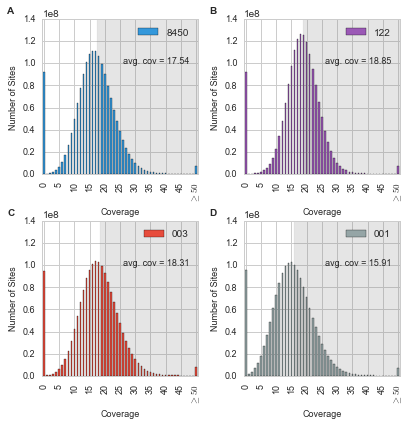

In [106]:
sns.set(font_scale=1.0)
sns.set_style("whitegrid")
fig=plt.figure(figsize=(6.4,6.4))
fig.subplots_adjust(hspace=0.3,wspace=0.30)
gs = gridspec.GridSpec(2, 2)
row = [0,0,1,1]
column = [0,1,0,1]
letters = ['A', 'B', 'C', 'D']

for i, animal in enumerate(profCountDF.animal.unique()): 
    ax = plt.subplot(gs[row[i], column[i]])
    outer_lim = 50
    cov_dist = profCountDF[profCountDF.animal == animal][['cov','occurence']].groupby('cov')['occurence'].sum().reset_index()
    cov_mean = sum(cov_dist['cov'] * cov_dist.occurence)/cov_dist.occurence.sum()
    cov_dist['occurence'][cov_dist['cov'] >= outer_lim] = cov_dist['occurence'][cov_dist['cov'] >= outer_lim].sum()
    cov_dist = cov_dist[cov_dist['cov'] <= outer_lim] 

    ax = cov_dist.plot(x='cov',y='occurence',kind='bar',legend=True,ax=ax,  color=color_ids[animal], label=change_name(animal), fontsize=minorFontSize)
    ticks = ax.xaxis.get_ticklocs()
    ticklabels = [l.get_text() for l in ax.xaxis.get_ticklabels()]
    ticklabels[-1] = r'$\geq%s$'%str(outer_lim)
    ax.xaxis.set_ticks(ticks[::5])
    ax.xaxis.set_ticklabels(ticklabels[::5],rotation=90, fontsize=minorFontSize)
    ax.set_ylabel('Number of Sites', fontsize=minorFontSize)
    ax.set_xlabel('Coverage', fontsize=minorFontSize)
    #ax.set_title( 'Animal:'%change_name(animal), fontsize=minorFontSize)
    ax.set_ylim(0,140000000)
    ax.fill_between((cov_mean, ax.get_xlim()[1]),ax.get_ylim()[0],ax.get_ylim()[1],color='grey',alpha=0.2) 
    ax.text(26,100000000,'avg. cov = %s' % str(round(cov_mean,2)), fontsize=minorFontSize)
    ax.text(-0.18, 1.08, letters[i], transform=ax.transAxes,
      fontsize=majorFontSize, fontweight='bold', va='top', ha='right')
fig.savefig('../fig2/supplemental_figure_3.pdf',bbox_inches='tight',pad_inches=0.1)


In [107]:
def check_equal_het(row):
    counts = [row['A'],row['T'],row['C'],row['G']]
    non_zero_counts = [n for n in counts if n > 0]
    if len(non_zero_counts)==2 and len(set(non_zero_counts))==1:
        return True
    else:
        return False

In [108]:
def allele_count(row):
    counts = [row['A'],row['T'],row['C'],row['G']]
    non_zero_counts = [n for n in counts if n > 0]
    non_zero_counts = sorted(non_zero_counts)
    return tuple(non_zero_counts)

In [109]:
profCountDF['allele_count'] = apply_by_multiprocessing(profCountDF, allele_count,8)

In [110]:
profCountDF['equal_het'] = apply_by_multiprocessing(profCountDF,check_equal_het,8)

In [111]:
def ret_per_cov_equal_rates(prof_count_df):
    tuple_list = []
    for animal in prof_count_df.animal.unique():
        for coverage in range(2, 100, 2):
            grouped = prof_count_df[(prof_count_df.animal == animal) & (prof_count_df['cov'] == coverage)].groupby('equal_het').sum()
            try:
                het = grouped['occurence'][True]
            except IndexError:
                het=0
            try:
                hom = grouped['occurence'][False]
            except IndexError:
                hom = 0
            try:
                rate = float(het)/float(het + hom) * 10000
            except ZeroDivisionError:
                rate = 0
            tuple_list.append((animal, coverage, het, hom, het+hom, rate))

    columns = ['animal','cov','num_equal_het', 'homozygous','total_sites','het_per_10kb']
    per_cov_equal_rates_df = pd.DataFrame(tuple_list)
    per_cov_equal_rates_df.columns = columns
    
    return per_cov_equal_rates_df

In [112]:
perCovEqualRatesDF = ret_per_cov_equal_rates(profCountDF)
perCovEqualRatesDF.head()

,animal,cov,num_equal_het,homozygous,total_sites,het_per_10kb
0,A_tigris8450,2,5583,1012258,1017841,54.851396
1,A_tigris8450,4,1263,3500489,3501752,3.606766
2,A_tigris8450,6,654,10612477,10613131,0.616218
3,A_tigris8450,8,670,25872112,25872782,0.258959
4,A_tigris8450,10,726,49982983,49983709,0.145247


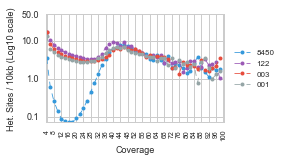

In [113]:
##### sns.set_style("whitegrid", {'axes.grid' : True})
fig = plt.figure(1, figsize=(3.2, 1.93))
#fig = plt.figure(1, figsize=(32, 19.3))

ax = fig.add_subplot(111)

for animal in perCovEqualRatesDF.animal.unique():
    data = perCovEqualRatesDF[(perCovEqualRatesDF.animal == animal) & (perCovEqualRatesDF['cov'] > 2)]
    ax = data.plot(x='cov', 
                    y='het_per_10kb',
                    ylim=(-0.5,18), 
                    xlim = (3.5,100.5), 
                    style='--o', 
                    yticks = np.arange(0,18,1),
                    logy=True,
                    xticks=np.arange(0,102,4),
                    label=change_name(animal), 
                    ax=ax,
                    color=color_ids[animal], 
                    fontsize=minorFontSize, 
                    markersize=4, 
                    linewidth=0.8
)
    
    ax.set_ylabel('Het. Sites / 10kb (Log10 scale)', fontsize=minorFontSize)
    ax.set_xlabel('Coverage', fontsize=minorFontSize)
    #ax2.set_title('Rate of Even Split Heterozygous Sites vs Coverage', fontsize=minorFontSize)
    ax.legend(loc=5, bbox_to_anchor=(1.32, 0.5), prop={'size':8})


ax.set_xticklabels(ax.get_xticks(), rotation=90, fontsize=minorFontSize-2);
ax.set_yticks( [0.1,1,10,50])
ax.yaxis.set_major_formatter(ScalarFormatter())
#ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda y,pos: ('{{:.{:1d}f}}'.format(int(np.maximum(-np.log10(y),0)))).format(y)))

fig.savefig('../fig2/Figure6B.pdf', format="pdf",bbox_inches='tight')

## Confidence in Allele Support Inferred from Transition Transversion Ratio

In [114]:
def ret_tntv_df(prof_count_df):
    tuple_list = []
    for animal in prof_count_df.animal.unique():
        for cov in xrange(10,22,2):
            temp = prof_count_df[(prof_count_df.status != 'Homozygous') & (prof_count_df.animal == animal) & (prof_count_df['cov'] == cov)].sort_values('allele_count')
            genos = temp['allele_count'].unique().tolist()
            for geno in genos:
                transitions = temp[(temp.status=='Transition')&(temp.allele_count == geno)]['occurence'].sum()
                transversions = temp[(temp.status=='Transversion')&(temp.allele_count == geno)]['occurence'].sum()
                total = temp[temp.allele_count == geno]['occurence'].sum()
                try:
                    ratio = float(transitions)/float(transversions)
                    definable = True
                except ZeroDivisionError:
                    ratio = 0
                    definable = False   
                t = (animal, cov, geno, transitions, transversions, ratio, definable, total)

                tuple_list.append(t)



    tntv_df = pd.DataFrame(tuple_list)
    tntv_df.columns = ['animal','cov','allele_count','transitions','transversions', 'tn_tv_ratio','definable','total']

    return tntv_df

In [115]:
tntvDF = ret_tntv_df(profCountDF)
tntvDF.head()

,animal,cov,allele_count,transitions,transversions,tn_tv_ratio,definable,total
0,A_tigris8450,10,"(1, 1, 1, 7)",0,0,0.0,False,42
1,A_tigris8450,10,"(1, 1, 2, 6)",0,0,0.0,False,17
2,A_tigris8450,10,"(1, 1, 3, 5)",0,0,0.0,False,2
3,A_tigris8450,10,"(1, 1, 8)",0,0,0.0,False,6942
4,A_tigris8450,10,"(1, 2, 2, 5)",0,0,0.0,False,1


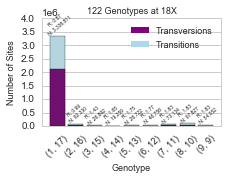

In [116]:
fig = plt.figure(1, figsize=(3.2, 1.93))

ax = fig.add_subplot(111)
animal = 'Atig_122'
cov = 18

subed = tntvDF[(tntvDF.animal == animal) & (tntvDF['cov']==cov) & (tntvDF.definable==True)]

ax = sns.barplot(x = subed.allele_count, y = subed.transitions + subed.transversions, color = "lightblue",ax=ax)

#Plot 2 - overlay - "bottom" series
bottom_plot = sns.barplot(x = subed.allele_count, y = subed.transversions, color = "purple",ax=ax)

#legend
topbar = plt.Rectangle((0,0),1,1,fc="lightblue", edgecolor = 'none')
bottombar = plt.Rectangle((0,0),1,1,fc='purple',  edgecolor = 'none')

l = ax.legend([bottombar, topbar], 
              ['Transversions', 'Transitions'], 
              loc=1, 
              ncol = 1, 
              fontsize=minorFontSize
              )

l.draw_frame(False)

#label bars
rects = ax.patches

labels = ['R: {}\n N: {:,}'.format(str(i)[:4], t) for i,t in zip(subed.tn_tv_ratio, subed.total)]

for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 27, label, ha='center',rotation=40, va='bottom', fontsize=minorFontSize-4,)
    
bottom_plot.set_ylabel("Number of Sites", fontsize=minorFontSize)
bottom_plot.set_xlabel("Genotype", fontsize=minorFontSize)
ax.set_xticklabels(ax.get_xticklabels(),rotation=45, fontsize=minorFontSize)
ax.set_xlim(ax.get_xlim()[0]-0.3,
            ax.get_xlim()[1]+0.3)

ax.set_title('%s Genotypes at %sX'%(change_name(animal), str(cov)), fontsize=minorFontSize)
ax.set_yticks(xrange(0,4500000,500000));
ax.ticklabel_format(style='sci',scilimits=(-3,4),axis='y',useOffset=True, fontsize=minorFontSize)


fig.savefig('../fig/Figure6D_v1.png',bbox_inches='tight', dpi=300)
fig.savefig('../fig2/Figure6D.pdf',bbox_inches='tight')

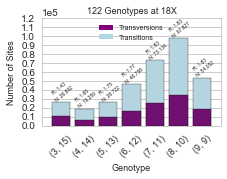

In [117]:
fig = plt.figure(1, figsize=(3.2, 1.93))

ax = fig.add_subplot(111)
animal = 'Atig_122'
cov = 18

subed = tntvDF[(tntvDF.animal == animal) & (tntvDF['cov']==cov) & (tntvDF.definable==True)]
subed = subed[(subed.allele_count != (1,cov-1)) & (subed.allele_count != (2, cov-2))]

ax = sns.barplot(x = subed.allele_count, y = subed.transitions + subed.transversions, color = "lightblue",ax=ax)

#Plot 2 - overlay - "bottom" series
bottom_plot = sns.barplot(x = subed.allele_count, y = subed.transversions, color = "purple",ax=ax)

#legend
topbar = plt.Rectangle((0,0),1,1,fc="lightblue", edgecolor = 'none')
bottombar = plt.Rectangle((0,0),1,1,fc='purple',  edgecolor = 'none')

l = ax.legend([bottombar, topbar], 
              ['Transversions', 'Transitions'], 
              loc='upper center', 
              ncol = 1, 
              fontsize=minorFontSize-2
              )

l.draw_frame(False)

#label bars
rects = ax.patches

labels = ['R: {}\n N: {:,}'.format(str(i)[:4], t) for i,t in zip(subed.tn_tv_ratio, subed.total)]

for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 27, label, ha='center',rotation=40, va='bottom', fontsize=minorFontSize-4,)
    
bottom_plot.set_ylabel("Number of Sites", fontsize=minorFontSize)
bottom_plot.set_xlabel("Genotype", fontsize=minorFontSize)
ax.set_xticklabels(ax.get_xticklabels(),rotation=45, fontsize=minorFontSize)
ax.set_xlim(ax.get_xlim()[0]-0.3,
            ax.get_xlim()[1]+0.3)


ax.set_title('%s Genotypes at %sX'%(change_name(animal), str(cov)), fontsize=minorFontSize)
ax.ticklabel_format(style='sci',scilimits=(-3,4),axis='y',useOffset=True, fontsize=minorFontSize)
ax.set_yticks(xrange(0,130000,10000));

fig.savefig('../fig/Figure6D_v2.png',bbox_inches='tight', dpi=300)
fig.savefig('../fig/Figure6D_v2.pdf',bbox_inches='tight')

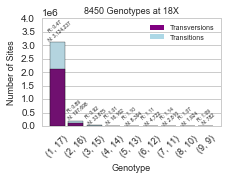

In [118]:
fig = plt.figure(1, figsize=(3.2, 1.93))

ax = fig.add_subplot(111)
animal = 'A_tigris8450'
cov = 18

subed = tntvDF[(tntvDF.animal == animal) & (tntvDF['cov']==cov)&(tntvDF.definable==True)]

ax = sns.barplot(x = subed.allele_count, y = subed.transitions + subed.transversions, color = "lightblue",ax=ax)

#Plot 2 - overlay - "bottom" series
bottom_plot = sns.barplot(x = subed.allele_count, y = subed.transversions, color = "purple",ax=ax)

#legend
topbar = plt.Rectangle((0,0),1,1,fc="lightblue", edgecolor = 'none')
bottombar = plt.Rectangle((0,0),1,1,fc='purple',  edgecolor = 'none')
l = ax.legend([bottombar, topbar], ['Transversions', 'Transitions'], loc=1, ncol = 1, fontsize=minorFontSize - 2
              )
l.draw_frame(False)

#label bars
rects = ax.patches

# Now make some labels
labels = ['R: {}\n N: {:,}'.format(str(i)[:4], t) for i,t in zip(subed.tn_tv_ratio, subed.total)]

for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 27, label, ha='center',rotation=40, va='bottom', fontsize=minorFontSize-4,)

bottom_plot.set_ylabel("Number of Sites", fontsize=minorFontSize)
bottom_plot.set_xlabel("Genotype", fontsize=minorFontSize)
ax.set_xticklabels(ax.get_xticklabels(),rotation=45, fontsize=minorFontSize)
ax.set_xlim(ax.get_xlim()[0]-0.3,
            ax.get_xlim()[1]+0.3)


ax.set_title('%s Genotypes at %sX'%(change_name(animal), str(cov)), fontsize=minorFontSize)
ax.ticklabel_format(style='sci',scilimits=(-3,4),axis='y',useOffset=True, fontsize=minorFontSize)
ax.set_yticks(xrange(0,4500000,500000));

fig.savefig('../fig/Figure6E_v1.png',bbox_inches='tight', dpi=300)
fig.savefig('../fig2/Figure6E.pdf',bbox_inches='tight')

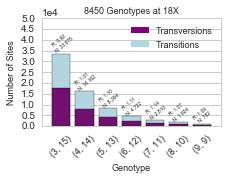

In [119]:
fig = plt.figure(1, figsize=(3.2, 1.93))

ax = fig.add_subplot(111)
animal = 'A_tigris8450'
cov = 18

subed = tntvDF[(tntvDF.animal == animal) & (tntvDF['cov']==cov)&(tntvDF.definable==True)]
subed = subed[(subed.allele_count != (1,cov-1)) & (subed.allele_count != (2, cov-2))]

ax = sns.barplot(x = subed.allele_count, y = subed.transitions + subed.transversions, color = "lightblue",ax=ax)

#Plot 2 - overlay - "bottom" series
bottom_plot = sns.barplot(x = subed.allele_count, y = subed.transversions, color = "purple",ax=ax)

#legend
topbar = plt.Rectangle((0,0),1,1,fc="lightblue", edgecolor = 'none')
bottombar = plt.Rectangle((0,0),1,1,fc='purple',  edgecolor = 'none')
l = ax.legend([bottombar, topbar], ['Transversions', 'Transitions'], loc=1, ncol = 1, fontsize=minorFontSize
              )
l.draw_frame(False)

#label bars
rects = ax.patches

# Now make some labels
labels = ['R: {}\n N: {:,}'.format(str(i)[:4], t) for i,t in zip(subed.tn_tv_ratio, subed.total)]

for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 27, label, ha='center',rotation=40, va='bottom', fontsize=minorFontSize-4,)

bottom_plot.set_ylabel("Number of Sites", fontsize=minorFontSize)
bottom_plot.set_xlabel("Genotype", fontsize=minorFontSize)
ax.set_xticklabels(ax.get_xticklabels(),rotation=45, fontsize=minorFontSize)
ax.set_xlim(ax.get_xlim()[0]-0.3,
            ax.get_xlim()[1]+0.3)


ax.set_title('%s Genotypes at %sX'%(change_name(animal), str(cov)), fontsize=minorFontSize)
ax.ticklabel_format(style='sci',scilimits=(-3,4),axis='y',useOffset=True, fontsize=minorFontSize)
ax.set_yticks(xrange(0,55000,5000));

fig.savefig('../fig/Figure6E_v2.png',bbox_inches='tight', dpi=300)
fig.savefig('../fig/Figur6E_v2.pdf',bbox_inches='tight')

In [120]:
subed.head()

,animal,cov,allele_count,transitions,transversions,tn_tv_ratio,definable,total
151,A_tigris8450,18,"(3, 15)",16212,17463,0.928363,True,33675
156,A_tigris8450,18,"(4, 14)",8142,8020,1.015212,True,16162
159,A_tigris8450,18,"(5, 13)",4397,3997,1.100075,True,8394
160,A_tigris8450,18,"(6, 12)",2485,2237,1.110863,True,4722
161,A_tigris8450,18,"(7, 11)",1500,1310,1.145038,True,2810


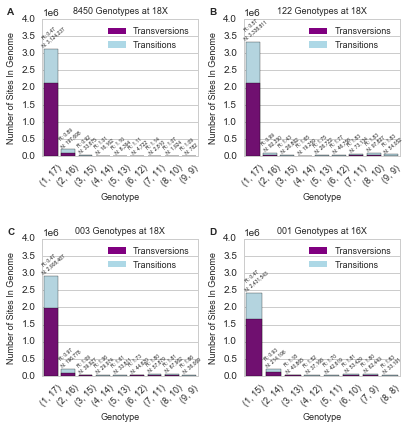

In [121]:
sns.set(font_scale=1.0)
sns.set_style("whitegrid")
fig=plt.figure(figsize=(6.4,6.4))
fig.subplots_adjust(hspace=0.6,wspace=0.30)
gs = gridspec.GridSpec(2, 2)
row = [0,0,1,1]
column = [0,1,0,1]
covValuesDict = {'A_tigris8450':18,
'Atig_122':18,
'Atig003':18,
'Atig001':16,
}

letters = ['A', 'B', 'C', 'D']


for i, animal in enumerate(tntvDF.animal.unique()):
    ax = plt.subplot(gs[row[i], column[i]])
    ax.text(-0.18, 1.08, letters[i], transform=ax.transAxes,fontsize=majorFontSize, fontweight='bold', va='top', ha='right')
    cov = covValuesDict[animal]
    subed = tntvDF[(tntvDF.animal == animal) & (tntvDF['cov']==cov)&(tntvDF.definable==True)]
    ax = sns.barplot(x = subed.allele_count, y = subed.transitions + subed.transversions, color = "lightblue",ax=ax)

    #Plot 2 - overlay - "bottom" series
    bottom_plot = sns.barplot(x = subed.allele_count, y = subed.transversions, color = "purple",ax=ax)

    #legend
    topbar = plt.Rectangle((0,0),1,1,fc="lightblue", edgecolor = 'none')
    bottombar = plt.Rectangle((0,0),1,1,fc='purple',  edgecolor = 'none')
    l = ax.legend([bottombar, topbar], ['Transversions', 'Transitions'], loc=1, ncol = 1, fontsize=minorFontSize
                  )
    l.draw_frame(False)

    #label bars
    rects = ax.patches

    # Now make some labels
    labels = ['R: {}\n N: {:,}'.format(str(i)[:4], t) for i,t in zip(subed.tn_tv_ratio, subed.total)]

    for rect, label in zip(rects, labels):
        height = rect.get_height()
        ax.text(rect.get_x() + rect.get_width()/2, height + 27, label, ha='center',rotation=40, va='bottom', fontsize=minorFontSize-4,)

    bottom_plot.set_ylabel("Number of Sites In Genome", fontsize=minorFontSize)
    bottom_plot.set_xlabel("Genotype", fontsize=minorFontSize)
    ax.set_xticklabels(ax.get_xticklabels(),rotation=45, fontsize=minorFontSize)
    #plt.xticks(rotation=45)


    ax.set_title('%s Genotypes at %sX'%(change_name(animal), str(cov)), fontsize=minorFontSize)
    ax.ticklabel_format(style='sci',scilimits=(-3,4),axis='y',useOffset=True)
    ax.set_yticks(xrange(0,4500000,500000))

fig.savefig('../fig2/supplemental_figure_4.pdf',bbox_inches='tight',pad_inches=0.1)


## Pysam 10kb Non-Overlapping Windows

The following python script will apply a non-overlapping window across all sequences represented in a profiles file and count the number of even split heterozygous sites in each window.


In [ ]:
# %load ../bin/scan_profile_no_lim.py
#!/usr/bin/env python
#Author: Duncan Tormey
#Email: dut@stowers.org or duncantormey@gmail.com
##################################################
# This script takes the  tsv output from         #
# pysam_profiler.py and applies a 10Kb sliding   #
# window accross each scaffod, counting sites as #
# heterozygous if the pass the conditions of the #
# function is_het. This script is currently hard #
# coded for my data.                             #
##################################################

from __future__ import print_function
from __future__ import division
import pandas as pd
import multiprocessing as mp
import numpy as np

def apply_df(df, func, *args):
    return df.apply(lambda x: func(x, *args), axis=1)


def apply_by_multiprocessing(df, func, workers, *args):
    pool = mp.Pool(processes=workers)
    result = [pool.apply_async(apply_df, args = (d, func) + args) for d in np.array_split(df, workers)]
    output = [p.get() for p in result]
    pool.close()
    return pd.concat(output)



def check_equal_het(row):
    counts = [row['A'],row['T'],row['C'],row['G']]
    non_zero_counts = [n for n in counts if n > 0]
    if len(non_zero_counts)==2 and len(set(non_zero_counts))==1:
        return True
    else:
        return False


def is_het(row, avg_cov):
    if row['cov'] <= 8:
        return False
    elif check_equal_het(row):
        return True
    else:
        return False


def load_het_profiles(path, cpus, avg_cov):
    het_profs = pd.read_csv(path,sep='\t',header=0)
    #het_profs['is_het'] = het_profs.apply(lambda row: is_het(row, avg_cov))
    het_profs['is_het'] = apply_by_multiprocessing(het_profs, is_het, cpus, avg_cov) #this broke with all sites
    het_profs[het_profs['is_het']==True].to_csv(path + '.is_het8.nolim',sep = '\t', index=False)
    
    return het_profs


def return_window_df(het_profs, scaffold_sizes, window=10000):
    windows = []
    append = windows.append
    for scaffold in het_profs.chrom.unique():
        scaffold_data = het_profs[het_profs.chrom == scaffold]
        scaffold_size = scaffold_sizes[scaffold_sizes.scaffold == scaffold]['scaffold_size'].values[0]
        for i in xrange(0,scaffold_size, window):
            if i+window <= scaffold_size:
                num_het = scaffold_data[(scaffold_data['pos']>=i)&(scaffold_data['pos']<i+window)]['is_het'].sum()
                size = window
            else:
                num_het = scaffold_data[scaffold_data['pos']>i]['is_het'].sum()
                size = len(scaffold_data[scaffold_data['pos']>i])

            append((scaffold, i, num_het, size))

    window_df = pd.DataFrame(windows, columns = ['chrom','window_start', 'het_sites','window_size'])
    
    return window_df
    
def write_window_df(het_prof_path, avg_cov, scaffold_sizes_path, cpus, window=10000):
    scaffold_sizes = pd.read_csv(scaffold_sizes_path,sep='\t', names = ['scaffold','scaffold_size'])
    het_profs = load_het_profiles(het_prof_path, cpus, avg_cov)
    window_df = return_window_df(het_profs, scaffold_sizes, window)
    window_df.to_csv(het_prof_path+'.%skbwindows8.nolim.tsv' % str(window/1000), sep='\t',index=False)
    return None

if __name__ == '__main__':
    scaffold_sizes_path = '/home/dut/projects/tigris/genome_annotation/fasta/scaffold_sizes.clean.tsv'

    paths =['/n/projects/dut/a_marmorata/parthenogen_heterozygosity/data/pysam/Atig001.merged.dedup.realigned.prof.not_hom',
            '/n/projects/dut/a_marmorata/parthenogen_heterozygosity/data/pysam/Atig003.merged.dedup.realigned.prof.not_hom',
            '/n/projects/dut/a_marmorata/parthenogen_heterozygosity/data/pysam/Atig_122.merged.dedup.realigned.prof.not_hom',
            '/n/projects/dut/a_marmorata/parthenogen_heterozygosity/data/pysam/A_tigris8450.merged.dedup.realigned.prof.not_hom']

    avg_covs = [16, 18,19,18]
    for path, avg_cov in zip(paths, avg_covs):
        print(path)
        write_window_df(path, avg_cov, scaffold_sizes_path, 8, 10000)

    


In [122]:
equalWindowPaths = ['/n/projects/dut/a_marmorata/parthenogen_heterozygosity/data/pysam/Atig001.merged.dedup.realigned.prof.not_hom.10.0kbwindows8.nolim.tsv',
                        '/n/projects/dut/a_marmorata/parthenogen_heterozygosity/data/pysam/Atig_122.merged.dedup.realigned.prof.not_hom.10.0kbwindows8.nolim.tsv',
                        '/n/projects/dut/a_marmorata/parthenogen_heterozygosity/data/pysam/Atig003.merged.dedup.realigned.prof.not_hom.10.0kbwindows8.nolim.tsv',
                        '/n/projects/dut/a_marmorata/parthenogen_heterozygosity/data/pysam/A_tigris8450.merged.dedup.realigned.prof.not_hom.10.0kbwindows8.nolim.tsv']

In [123]:
def ret_sample_name(file_path, sp_case = 'A_tigris8450'):
    my_file = file_path.split('/')[-1]
    sample_name = my_file.split('.')[0]
    return sample_name

In [124]:
def ret_equal_het_windows(window_paths, sample_name_func, **kwargs):
    for i, path in enumerate(window_paths):        
        sample_name = sample_name_func(path,**kwargs)
        window_df = pd.read_csv(path, sep='\t')
        window_df['animal'] = sample_name
        if i == 0:
            df_equal_het_windows = window_df
        else:
            df_equal_het_windows = pd.concat([df_equal_het_windows, window_df])

        print(len(df_equal_het_windows), i, path, sample_name)
        
    return df_equal_het_windows

In [125]:
equalHetWindowsDF = ret_equal_het_windows(equalWindowPaths, ret_sample_name)

163465 0 /n/projects/dut/a_marmorata/parthenogen_heterozygosity/data/pysam/Atig001.merged.dedup.realigned.prof.not_hom.10.0kbwindows8.nolim.tsv Atig001
326930 1 /n/projects/dut/a_marmorata/parthenogen_heterozygosity/data/pysam/Atig_122.merged.dedup.realigned.prof.not_hom.10.0kbwindows8.nolim.tsv Atig_122
490395 2 /n/projects/dut/a_marmorata/parthenogen_heterozygosity/data/pysam/Atig003.merged.dedup.realigned.prof.not_hom.10.0kbwindows8.nolim.tsv Atig003
653860 3 /n/projects/dut/a_marmorata/parthenogen_heterozygosity/data/pysam/A_tigris8450.merged.dedup.realigned.prof.not_hom.10.0kbwindows8.nolim.tsv A_tigris8450


In [126]:
equalHetWindowsDF['chrom_size'] = equalHetWindowsDF.chrom.apply(lambda x: scaffoldSizeDict[x])

In [127]:
equalHetWindowsDF.sort_values(['animal','chrom_size', 'window_start'], ascending=[True, False, True], inplace=True)
equalHetWindowsDF.head()

,chrom,window_start,het_sites,window_size,animal,chrom_size
0,Scpiz6a_49,0,2,10000,A_tigris8450,85027298
1,Scpiz6a_49,10000,0,10000,A_tigris8450,85027298
2,Scpiz6a_49,20000,0,10000,A_tigris8450,85027298
3,Scpiz6a_49,30000,0,10000,A_tigris8450,85027298
4,Scpiz6a_49,40000,0,10000,A_tigris8450,85027298


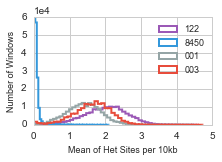

In [128]:
fig = plt.figure(1, figsize=(3.2, 1.93))
ax = fig.add_subplot(111)

for animal in animal_ids:
    rolling_mean_data = equalHetWindowsDF[equalHetWindowsDF.animal==animal].rolling(100).mean().het_sites.dropna()
    sns.distplot(rolling_mean_data,
                 kde=False,
                 hist_kws={"alpha":1, 
                           "color":color_ids[animal], 
                           "linewidth":2, 
                           "histtype": "step"},
                 label=id_to_name[animal],
                 ax=ax)


#ax5.set_title('1Mb Heterozygosity Distribution', fontsize=minorFontSize)
ax.set_ylabel('Number of Windows', fontsize=minorFontSize)
ax.set_xlabel('Mean of Het Sites per 10kb', fontsize=minorFontSize)
ax.legend(fontsize=minorFontSize)
ax.ticklabel_format(style='sci', scilimits=(-3,4), axis='y',useOffset=True)
fig.savefig('../fig2/Figure6F.pdf')

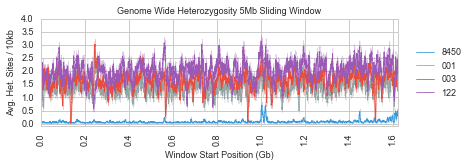

In [129]:
fig = plt.figure(1, figsize=(6.4, 1.93))
ax = fig.add_subplot(111)
step=500
for animal in equalHetWindowsDF.animal.unique():
    five_mb_rolling = equalHetWindowsDF[(equalHetWindowsDF['animal']==animal) & (equalHetWindowsDF['chrom_size']>5e5)].reset_index().het_sites.rolling(window=step)
    
    five_mb_rolling.mean().plot(legend=False, 
                                      rot = 90, 
                                      #style='.', 
                                      linewidth=0.8,
                                      ax=ax, 
                                      label=id_to_name[animal], 
                                      color=color_ids[animal], 
                                      #markersize=1.0,
                                      fontsize=minorFontSize,
                                     rasterized=True)
    
    ax.fill_between(five_mb_rolling.mean().index, 
                     five_mb_rolling.mean()-2*five_mb_rolling.std()/np.sqrt(step), 
                     five_mb_rolling.mean()+2*five_mb_rolling.std()/np.sqrt(step), 
                     color=color_ids[animal], 
                     alpha=0.3,
                    rasterized=True)

megabase_labels = [str((x*10000/1000000000)) for x in ax.get_xticks()]
ax.set_title('Genome Wide Heterozygosity 5Mb Sliding Window', fontsize=minorFontSize)
ax.set_xticklabels(megabase_labels, rotation=90, fontsize=minorFontSize) 
ax.set_xlabel('Window Start Position (Gb)', fontsize=minorFontSize)
ax.set_ylabel('Avg. Het. Sites / 10kb', fontsize=minorFontSize)
ax.set_ylim(-0.1,4)
ax.legend(loc=5, bbox_to_anchor=(1.20, 0.5), markerscale=5, fontsize=minorFontSize)

fig.savefig('../fig2/Figure7A.pdf',bbox_inches='tight',dpi=300)
fig.savefig('../fig/Figure7A.png',bbox_inches='tight',dpi=300)

In [130]:
equalHetWindowsDF.head()

,chrom,window_start,het_sites,window_size,animal,chrom_size
0,Scpiz6a_49,0,2,10000,A_tigris8450,85027298
1,Scpiz6a_49,10000,0,10000,A_tigris8450,85027298
2,Scpiz6a_49,20000,0,10000,A_tigris8450,85027298
3,Scpiz6a_49,30000,0,10000,A_tigris8450,85027298
4,Scpiz6a_49,40000,0,10000,A_tigris8450,85027298


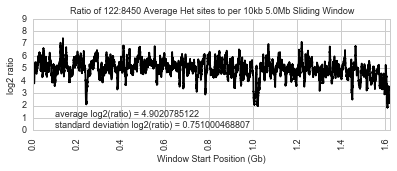

In [131]:
step = 500
mother = equalHetWindowsDF[(equalHetWindowsDF.animal == 'Atig_122') & (equalHetWindowsDF['chrom_size']>5e5)].reset_index().het_sites.rolling(window=step).mean()
fp_animal = equalHetWindowsDF[(equalHetWindowsDF.animal == 'A_tigris8450') & (equalHetWindowsDF['chrom_size']>5e5)].reset_index().het_sites.rolling(window=step).mean()
ratio = mother/fp_animal

ax = np.log2(ratio).plot(legend=False, 
                rot = 90, 
                style='-',
                label=animal,
                color='black',
                markersize=0.5,
               figsize=(6.4,2),
               fontsize=minorFontSize)

ax.set_title('Ratio of 122:8450 Average Het sites to per 10kb %sMb Sliding Window' % str(step/100), fontsize=minorFontSize)
megabase_labels = [str((x*10000/1000000000)) for x in ax.get_xticks()]
ax.set_xticklabels(megabase_labels,rotation=90, fontsize=minorFontSize) 
ax.set_xlabel('Window Start Position (Gb)', fontsize=minorFontSize)
ax.set_ylabel('log2 ratio', fontsize=minorFontSize)
ax.set_ylim(0,9)
mean_r = np.log2(ratio).mean()
se_r = np.log2(ratio).std()#/np.sqrt(len(ratio.dropna()))
ax.text(1.0e4,0.25, 'average log2(ratio) = %s\nstandard deviation log2(ratio) = %s'%(str(mean_r), str(se_r)), fontsize=minorFontSize)
fig = ax.get_figure()
fig.savefig('../fig2/supplemental_figure_5.pdf', bbox_inches='tight', pad_inches=0.25)
fig.savefig('../fig/supplemental_figure_5.png', bbox_inches='tight', pad_inches=0.25, dpi=300)


## V2R Copy Number analysis MAKER Annotations

This first table I am reading in shows the copy number variation for every gene annotated in the MAKER annotations.

In [132]:
gffCopyNumMarmDF = pd.read_csv('../../dovetail_vomeronasal/data/annotCopyNumsDF.tsv', sep='\t')
gffCopyNumMarmDF = gffCopyNumMarmDF[gffCopyNumMarmDF.type=="gene"]
gffCopyNumMarmDF.cnv.fillna('CN1',inplace=True)
gffCopyNumMarmDF['copies'] = gffCopyNumMarmDF['cnv'].apply(lambda x: int(x[2]))
gffCopyNumMarmDF.head()

,seqnames,start,end,width,strand,source,type,score,phase,ID,...,Note,Dbxref,Parent,X_AED,X_QI,X_eAED,Ontology_term,score.1,cnv,copies
0,Scpiz6a_1,69274,86971.0,17698,+,maker,gene,NaN,NaN,gene1,...,Similar to LYPD6: Ly6/PLAUR domain-containing protein 6 (Homo sapiens),"c(""Gene3D:G3DSA:2.10.60.10"", ""SUPERFAMILY:SSF57302"")",character(0),NaN,NaN,NaN,character(0),NaN,CN1,1
11,Scpiz6a_1,105656,124326.0,18671,-,maker,gene,NaN,NaN,gene2,...,"Similar to MMADHC: Methylmalonic aciduria and homocystinuria type D homolog, mitochondrial (Gallus gallus)","c(""InterPro:IPR019362"", ""Pfam:PF10229"")",character(0),NaN,NaN,NaN,GO:0009235,NaN,CN1,1
40,Scpiz6a_1,458899,468953.0,10055,-,maker,gene,NaN,NaN,gene3,...,Similar to Rnd3: Rho-related GTP-binding protein RhoE (Rattus norvegicus),"c(""Gene3D:G3DSA:3.40.50.300"", ""InterPro:IPR001806"", ""InterPro:IPR003578"", ""InterPro:IPR003579"", ""InterPro:IPR027417"", ""Pfam:PF00071"", ""ProSiteProfiles:PS51420"", ""SMART:SM00174"", ""SMART:SM00175"", ""SUPERFAMILY:SSF52540"")",character(0),NaN,NaN,NaN,"c(""GO:0005525"", ""GO:0005622"", ""GO:0007264"", ""GO:0015031"")",NaN,CN1,1
50,Scpiz6a_1,609021,609749.0,729,-,maker,gene,NaN,NaN,gene4,...,Protein of unknown function,"c(""Gene3D:G3DSA:1.10.443.10"", ""InterPro:IPR011010"", ""InterPro:IPR013762"", ""SUPERFAMILY:SSF56349"")",character(0),NaN,NaN,NaN,"c(""GO:0003677"", ""GO:0006310"", ""GO:0015074"")",NaN,CN1,1
54,Scpiz6a_1,677616,678006.0,391,-,maker,gene,NaN,NaN,gene5,...,Similar to rgr-1: Mediator of RNA polymerase II transcription subunit 14 (Caenorhabditis briggsae),character(0),character(0),NaN,NaN,NaN,character(0),1246.0,CN1,1


Next I add a column to contain the gene symbol.

In [133]:
gffCopyNumMarmDF['gene_symbol'] = gffCopyNumMarmDF['Note'].apply(lambda x: x.replace('Similar to ', '').split(':')[0])
gffCopyNumMarmDF['gene_symbol'].head()

0     LYPD6                      
11    MMADHC                     
40    Rnd3                       
50    Protein of unknown function
54    rgr-1                      
Name: gene_symbol, dtype: object

Here I number of times each gene symbol occurs genome wide. Only gene symbols that occur more than 10 times are shown.

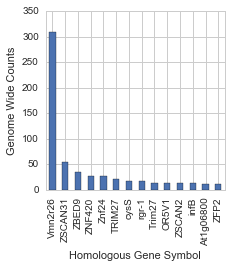

In [134]:
fig = plt.figure(1, figsize=(3.2, 3.2))
ax = fig.add_subplot(111)
value_counts = pd.DataFrame(gffCopyNumMarmDF[gffCopyNumMarmDF['gene_symbol'] != "Protein of unknown function"]['gene_symbol'].value_counts())
data = value_counts[value_counts.gene_symbol > 10]
data.plot(kind='bar', ax=ax, legend=False)
ax.set_ylabel('Genome Wide Counts')
ax.set_xlabel('Homologous Gene Symbol')
fig.savefig('../fig/vmnr_maker_all_counts.pdf', bbox_inches='tight')

Here are the numbers from that plot. Vmn2r26 occurs 309 times genome wide.

In [135]:
data

,gene_symbol
Vmn2r26,309
ZSCAN31,55
ZBED9,35
ZNF420,28
Znf24,28
TRIM27,21
cysS,18
rgr-1,17
Trim27,14
OR5V1,13


Here I generate the same plot as above, but only for scaffold 45 (which is the scaffold that shows increased apparent heterozygosity). Only symbols 4 or more occurences are shown.

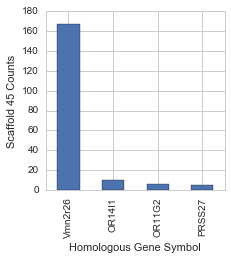

In [136]:
fig = plt.figure(1, figsize=(3.2, 3.2))
ax = fig.add_subplot(111)
value_counts = pd.DataFrame(gffCopyNumMarmDF[(gffCopyNumMarmDF['gene_symbol'] != "Protein of unknown function") & (gffCopyNumMarmDF.seqnames =='Scpiz6a_45')]['gene_symbol'].value_counts())
data = value_counts[value_counts.gene_symbol > 4]
data.plot(kind='bar', ax=ax, legend=False)
ax.set_ylabel('Scaffold 45 Counts')
ax.set_xlabel('Homologous Gene Symbol')
fig.savefig('../fig/vmnr_maker_45_counts.pdf', bbox_inches='tight')

Here is the data for this plot. Vmn2r26 occurs 177 time on scaffold 45.

In [137]:
data

,gene_symbol
Vmn2r26,167
OR14I1,10
OR11G2,6
PRSS27,5


Here I save the subsetted table for all Vmn2r26 that are on scaffold 45.

In [138]:
vmnrGffCopyDF = gffCopyNumMarmDF[(gffCopyNumMarmDF.Note.str.contains('Vmn2r26',case=False)) & (gffCopyNumMarmDF.seqnames =='Scpiz6a_45')].reset_index().copy()
vmnrGffCopyDF.head()

,index,seqnames,start,end,width,strand,source,type,score,phase,...,Dbxref,Parent,X_AED,X_QI,X_eAED,Ontology_term,score.1,cnv,copies,gene_symbol
0,465598,Scpiz6a_45,5125710,5235885.0,110176,+,maker,gene,NaN,NaN,...,"c(""Gene3D:G3DSA:3.40.50.2300"", ""InterPro:IPR000337"", ""InterPro:IPR001828"", ""InterPro:IPR004073"", ""InterPro:IPR011500"", ""InterPro:IPR017978"", ""InterPro:IPR017979"", ""InterPro:IPR028082"", ""PRINTS:PR00248"", ""PRINTS:PR01535"", ""Pfam:PF00003"", ""Pfam:PF01094"", ""Pfam:PF07562"", ""ProSitePatterns:PS00981"", ""ProSiteProfiles:PS50259"", ""SUPERFAMILY:SSF53822"", ""SUPERFAMILY:SSF81665"")",character(0),NaN,NaN,NaN,"c(""GO:0004930"", ""GO:0007186"", ""GO:0016021"")",NaN,CN1,1,Vmn2r26
1,465885,Scpiz6a_45,5243577,5320649.0,77073,-,maker,gene,NaN,NaN,...,"c(""Gene3D:G3DSA:3.40.50.2300"", ""InterPro:IPR000337"", ""InterPro:IPR001828"", ""InterPro:IPR004073"", ""InterPro:IPR011500"", ""InterPro:IPR017978"", ""InterPro:IPR017979"", ""InterPro:IPR028082"", ""PRINTS:PR00248"", ""PRINTS:PR01535"", ""Pfam:PF00003"", ""Pfam:PF01094"", ""Pfam:PF07562"", ""ProSitePatterns:PS00981"", ""ProSiteProfiles:PS50259"", ""SUPERFAMILY:SSF53822"", ""SUPERFAMILY:SSF81665"")",character(0),NaN,NaN,NaN,"c(""GO:0004930"", ""GO:0007186"", ""GO:0016021"")",NaN,CN1,1,Vmn2r26
2,466138,Scpiz6a_45,5332681,5367671.0,34991,-,maker,gene,NaN,NaN,...,"c(""Gene3D:G3DSA:3.40.50.2300"", ""InterPro:IPR000337"", ""InterPro:IPR001828"", ""InterPro:IPR004073"", ""InterPro:IPR011500"", ""InterPro:IPR017978"", ""InterPro:IPR017979"", ""InterPro:IPR028082"", ""PRINTS:PR00248"", ""PRINTS:PR01535"", ""Pfam:PF00003"", ""Pfam:PF01094"", ""Pfam:PF07562"", ""ProSitePatterns:PS00981"", ""ProSiteProfiles:PS50259"", ""SUPERFAMILY:SSF53822"")",character(0),NaN,NaN,NaN,"c(""GO:0004930"", ""GO:0007186"", ""GO:0016021"")",NaN,CN1,1,Vmn2r26
3,466383,Scpiz6a_45,5374537,5392755.0,18219,+,maker,gene,NaN,NaN,...,"c(""Gene3D:G3DSA:3.40.50.2300"", ""InterPro:IPR000337"", ""InterPro:IPR001828"", ""InterPro:IPR004073"", ""InterPro:IPR011500"", ""InterPro:IPR017978"", ""InterPro:IPR017979"", ""InterPro:IPR028082"", ""PRINTS:PR00248"", ""PRINTS:PR01535"", ""Pfam:PF00003"", ""Pfam:PF01094"", ""Pfam:PF07562"", ""ProSitePatterns:PS00981"", ""ProSiteProfiles:PS50259"", ""SUPERFAMILY:SSF53822"")",character(0),NaN,NaN,NaN,"c(""GO:0004930"", ""GO:0007186"", ""GO:0016021"")",NaN,CN1,1,Vmn2r26
4,466470,Scpiz6a_45,5509516,5545895.0,36380,+,maker,gene,NaN,NaN,...,"c(""Gene3D:G3DSA:3.40.50.2300"", ""InterPro:IPR000337"", ""InterPro:IPR001828"", ""InterPro:IPR004073"", ""InterPro:IPR011500"", ""InterPro:IPR017978"", ""InterPro:IPR017979"", ""InterPro:IPR028082"", ""PRINTS:PR00248"", ""PRINTS:PR01535"", ""Pfam:PF00003"", ""Pfam:PF01094"", ""Pfam:PF07562"", ""ProSitePatterns:PS00981"", ""ProSiteProfiles:PS50259"", ""SUPERFAMILY:SSF53822"")",character(0),NaN,NaN,NaN,"c(""GO:0004930"", ""GO:0007186"", ""GO:0016021"")",NaN,CN1,1,Vmn2r26


In this next section I compare the compy number estimations in 8450 to the number of annotations present in the genome assembly 

There are 323 copies of Vmn2r26 in 8450, according to the MAKER gene annotations and the copy number variation analysis. 

In [139]:
gffCopyNumMarmDF[(gffCopyNumMarmDF.type == 'gene') & (gffCopyNumMarmDF.Note.str.contains('Vmn2r26',case=False))].copies.sum()

323

Of the 323 copies, 177 reside on scaffold 45.

In [140]:
vmnrGffCopyDF.copies.sum()

177

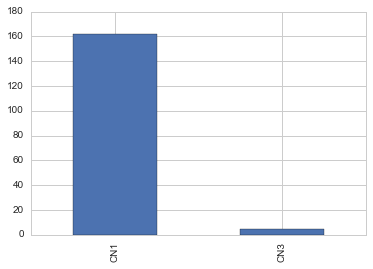

In [141]:
vmnrGffCopyDF.cnv.value_counts().plot(kind='bar')

In [142]:
vmnrDF = gffMarmDF[(gffMarmDF.feature == 'gene') & (gffMarmDF.gene_symbol=='Vmn2r26') & (gffMarmDF.seqid =='Scpiz6a_45')].copy()
vmnrDF['width'] = vmnrDF['end'] - vmnrDF['start']
vmnrDF['broken_bars'] = vmnrDF.apply(lambda row: (row['start']/10000, row['width']/10000), axis=1)
vmnrDF.head()

,seqid,source,feature,start,end,score,strand,phase,attributes,gene_attributes,gene_symbol,gene_id,name,count_column,width,broken_bars
482606,Scpiz6a_45,MAKER2,gene,5125710.0,5235885.0,.,+,.,"ID=gene17679;Name=ATIG_00000233;Alias=maker-Scpiz6a_45-exonerate_protein2genome-gene-52.0;Note=Similar to Vmn2r26: Vomeronasal type-2 receptor 26 (Mus musculus);Dbxref=Gene3D:G3DSA:3.40.50.2300,InterPro:IPR000337,InterPro:IPR001828,InterPro:IPR004073,InterPro:IPR011500,InterPro:IPR017978,InterPro:IPR017979,InterPro:IPR028082,PRINTS:PR00248,PRINTS:PR01535,Pfam:PF00003,Pfam:PF01094,Pfam:PF07562,ProSitePatterns:PS00981,ProSiteProfiles:PS50259,SUPERFAMILY:SSF53822,SUPERFAMILY:SSF81665;Ontology_term=GO:0004930,GO:0007186,GO:0016021","ID=gene17679;Name=ATIG_00000233;Alias=maker-Scpiz6a_45-exonerate_protein2genome-gene-52.0;Note=Similar to Vmn2r26: Vomeronasal type-2 receptor 26 (Mus musculus);Dbxref=Gene3D:G3DSA:3.40.50.2300,InterPro:IPR000337,InterPro:IPR001828,InterPro:IPR004073,InterPro:IPR011500,InterPro:IPR017978,InterPro:IPR017979,InterPro:IPR028082,PRINTS:PR00248,PRINTS:PR01535,Pfam:PF00003,Pfam:PF01094,Pfam:PF07562,ProSitePatterns:PS00981,ProSiteProfiles:PS50259,SUPERFAMILY:SSF53822,SUPERFAMILY:SSF81665;Ontology_term=GO:0004930,GO:0007186,GO:0016021",Vmn2r26,gene17679,ATIG_00000233,"(Scpiz6a_45, Vmn2r26)",110175.0,"(512.571, 11.0175)"
482894,Scpiz6a_45,MAKER2,gene,5243577.0,5320649.0,.,-,.,"ID=gene17680;Name=ATIG_00000234;Alias=maker-Scpiz6a_45-exonerate_protein2genome-gene-53.0;Note=Similar to Vmn2r26: Vomeronasal type-2 receptor 26 (Mus musculus);Dbxref=Gene3D:G3DSA:3.40.50.2300,InterPro:IPR000337,InterPro:IPR001828,InterPro:IPR004073,InterPro:IPR011500,InterPro:IPR017978,InterPro:IPR017979,InterPro:IPR028082,PRINTS:PR00248,PRINTS:PR01535,Pfam:PF00003,Pfam:PF01094,Pfam:PF07562,ProSitePatterns:PS00981,ProSiteProfiles:PS50259,SUPERFAMILY:SSF53822,SUPERFAMILY:SSF81665;Ontology_term=GO:0004930,GO:0007186,GO:0016021","ID=gene17680;Name=ATIG_00000234;Alias=maker-Scpiz6a_45-exonerate_protein2genome-gene-53.0;Note=Similar to Vmn2r26: Vomeronasal type-2 receptor 26 (Mus musculus);Dbxref=Gene3D:G3DSA:3.40.50.2300,InterPro:IPR000337,InterPro:IPR001828,InterPro:IPR004073,InterPro:IPR011500,InterPro:IPR017978,InterPro:IPR017979,InterPro:IPR028082,PRINTS:PR00248,PRINTS:PR01535,Pfam:PF00003,Pfam:PF01094,Pfam:PF07562,ProSitePatterns:PS00981,ProSiteProfiles:PS50259,SUPERFAMILY:SSF53822,SUPERFAMILY:SSF81665;Ontology_term=GO:0004930,GO:0007186,GO:0016021",Vmn2r26,gene17680,ATIG_00000234,"(Scpiz6a_45, Vmn2r26)",77072.0,"(524.3577, 7.7072)"
483148,Scpiz6a_45,MAKER2,gene,5332681.0,5367671.0,.,-,.,"ID=gene17681;Name=ATIG_00000235;Alias=maker-Scpiz6a_45-exonerate_protein2genome-gene-53.1;Note=Similar to Vmn2r26: Vomeronasal type-2 receptor 26 (Mus musculus);Dbxref=Gene3D:G3DSA:3.40.50.2300,InterPro:IPR000337,InterPro:IPR001828,InterPro:IPR004073,InterPro:IPR011500,InterPro:IPR017978,InterPro:IPR017979,InterPro:IPR028082,PRINTS:PR00248,PRINTS:PR01535,Pfam:PF00003,Pfam:PF01094,Pfam:PF07562,ProSitePatterns:PS00981,ProSiteProfiles:PS50259,SUPERFAMILY:SSF53822;Ontology_term=GO:0004930,GO:0007186,GO:0016021","ID=gene17681;Name=ATIG_00000235;Alias=maker-Scpiz6a_45-exonerate_protein2genome-gene-53.1;Note=Similar to Vmn2r26: Vomeronasal type-2 receptor 26 (Mus musculus);Dbxref=Gene3D:G3DSA:3.40.50.2300,InterPro:IPR000337,InterPro:IPR001828,InterPro:IPR004073,InterPro:IPR011500,InterPro:IPR017978,InterPro:IPR017979,InterPro:IPR028082,PRINTS:PR00248,PRINTS:PR01535,Pfam:PF00003,Pfam:PF01094,Pfam:PF07562,ProSitePatterns:PS00981,ProSiteProfiles:PS50259,SUPERFAMILY:SSF53822;Ontology_term=GO:0004930,GO:0007186,GO:0016021",Vmn2r26,gene17681,ATIG_00000235,"(Scpiz6a_45, Vmn2r26)",34990.0,"(533.2681, 3.499)"
483394,Scpiz6a_45,MAKER2,gene,5374537.0,5392755.0,.,+,.,"ID=gene17682;Name=ATIG_00000236;Alias=maker-Scpiz6a_45-exonerate_protein2genome-gene-55.0;Note=Similar to Vmn2r26: Vomeronasal type-2 receptor 26 (Mus musculus);Dbxref=Gene3D:G3DSA:3.40.50.2300,InterPro:IPR000337,Inter

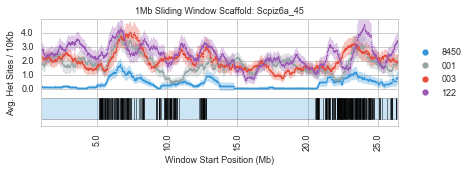

In [143]:
fig = plt.figure(1, figsize=(6.4, 1.93))
ax = fig.add_subplot(111)
step=100
scaffold='Scpiz6a_45'
lns = None
for animal in equalHetWindowsDF.animal.unique():
    scaffold_het_rolling = equalHetWindowsDF[(equalHetWindowsDF['animal']==animal) & (equalHetWindowsDF['chrom']==scaffold)].reset_index().het_sites.rolling(window=step)
    ln1 = ax.plot(scaffold_het_rolling.mean(),
           '.',
            color=color_ids[animal],
            label=id_to_name[animal],
            markersize=2.5,
                 rasterized=True)

    ax.fill_between(scaffold_het_rolling.mean().index, 
                     scaffold_het_rolling.mean()-2*scaffold_het_rolling.std()/np.sqrt(step), 
                     scaffold_het_rolling.mean()+2*scaffold_het_rolling.std()/np.sqrt(step), 
                     color=color_ids[animal], 
                     alpha=0.3,
                   rasterized=True)
    if not lns:
        lns = ln1
    else:
        lns+=ln1
    
ax.set_ylim(-2.7, 5)    
ax.set_yticks(np.arange(0,5.0,1.0))
ax.set_yticklabels(ax.get_yticks(), fontsize=minorFontSize)
ax.set_ylabel('Avg. Het Sites / 10Kb', fontsize=minorFontSize)


megabase_labels = [str((x*10000/1000000)) for x in ax.get_xticks()]
ax.set_xticklabels(megabase_labels,rotation=90, fontsize=minorFontSize) 
ax.set_xlabel("Window Start Position (Mb)", fontsize=minorFontSize)

ax.set_title('%dMb Sliding Window Scaffold: %s' % (step*10000/1000000, scaffold), fontsize=minorFontSize)
ax.set_xlim(scaffold_het_rolling.mean().dropna().index.min(),scaffold_het_rolling.mean().dropna().index.max())

labs = [l.get_label() for l in lns]
ax.legend(lns, labs, loc=5, bbox_to_anchor=(1.20, 0.5),markerscale=5, fontsize=minorFontSize)



chrom = ax.add_collection(BrokenBarHCollection(
        [(scaffold_het_rolling.mean().dropna().index.min()+2, scaffold_het_rolling.mean().dropna().index.max()-105)], 
        (-2.2,1.5),
        facecolors=color_ids['A_tigris8450'],
        alpha=0.25,
        linewidths=[1]
                                      )
    )


ax.add_collection(BrokenBarHCollection(
        vmnrDF[vmnrDF['feature']=='gene'].broken_bars, 
        (-2.2,1.5),
        facecolors=['black' for i in xrange(len(vmnrDF.broken_bars))],
        linewidths=[0.5 for i in xrange(len(vmnrDF.broken_bars))]
                                      )
    )
fig.savefig('../fig2/Figure7B.pdf', bbox_inches='tight', )

## V2R Exonerate Copy Number analysis

Instead of using the maker annotations I also tried identifying v2r genes by aligning the mouse ortholog to the genome with exonerate.

In [144]:
vmnrCopyNumbers = pd.read_csv('../../dovetail_vomeronasal/data/vmnrCopyNumsDF.csv')

In [145]:
vmnrCopyNumbers.head()

,Unnamed: 0,seqnames,start,end,width,strand,source,type,score,phase,...,similarity,insertions,deletions,intron_id,splice_site,alignment_id,Query,Align,frameshifts,cnv
0,1,Scpiz6a_49,64908337,64910441,2105,+,exonerate:protein2genome:local,gene,683.0,NaN,...,63.30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CN1
1,2,Scpiz6a_49,64908337,64908463,127,+,exonerate:protein2genome:local,cds,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CN1
2,3,Scpiz6a_49,64908337,64908463,127,+,exonerate:protein2genome:local,exon,NaN,NaN,...,69.05,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,CN1
3,4,Scpiz6a_49,64908464,64908465,2,+,exonerate:protein2genome:local,splice5,NaN,NaN,...,NaN,NaN,NaN,1.0,GT,NaN,NaN,NaN,NaN,CN1
4,5,Scpiz6a_49,64908464,64909578,1115,+,exonerate:protein2genome:local,intron,NaN,NaN,...,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,CN1


In [146]:
vmnrCopyNumbers['copies'] = vmnrCopyNumbers['cnv'].apply(lambda x: int(x[2]))
vmnrCopyNumbers['broken_bars'] = vmnrCopyNumbers.apply(lambda row: (row['start']/10000, row['width']/10000), axis=1)
vmnrCopyNumbers.head()

,Unnamed: 0,seqnames,start,end,width,strand,source,type,score,phase,...,deletions,intron_id,splice_site,alignment_id,Query,Align,frameshifts,cnv,copies,broken_bars
0,1,Scpiz6a_49,64908337,64910441,2105,+,exonerate:protein2genome:local,gene,683.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CN1,1,"(6490.8337, 0.2105)"
1,2,Scpiz6a_49,64908337,64908463,127,+,exonerate:protein2genome:local,cds,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CN1,1,"(6490.8337, 0.0127)"
2,3,Scpiz6a_49,64908337,64908463,127,+,exonerate:protein2genome:local,exon,NaN,NaN,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,CN1,1,"(6490.8337, 0.0127)"
3,4,Scpiz6a_49,64908464,64908465,2,+,exonerate:protein2genome:local,splice5,NaN,NaN,...,NaN,1.0,GT,NaN,NaN,NaN,NaN,CN1,1,"(6490.8464, 0.0002)"
4,5,Scpiz6a_49,64908464,64909578,1115,+,exonerate:protein2genome:local,intron,NaN,NaN,...,NaN,1.0,NaN,NaN,NaN,NaN,NaN,CN1,1,"(6490.8464, 0.1115)"


In [147]:
exon_lengths = []
exon_length= None
for row in vmnrCopyNumbers.itertuples():
    if row[8] == 'gene':
        if not exon_length:
            i=1
            exon_length = 0
            continue
        else:
            exon_length = [exon_length]*i
            exon_lengths.extend(exon_length)
            exon_length = 0
            i=0
    if row[8] == "exon":
        exon_length+=row[5]
    i+=1

exon_length = [exon_length]*i
exon_lengths.extend(exon_length)    
    
vmnrCopyNumbers['sum_exon_lengths'] = exon_lengths
vmnrCopyNumbers.head()

,Unnamed: 0,seqnames,start,end,width,strand,source,type,score,phase,...,intron_id,splice_site,alignment_id,Query,Align,frameshifts,cnv,copies,broken_bars,sum_exon_lengths
0,1,Scpiz6a_49,64908337,64910441,2105,+,exonerate:protein2genome:local,gene,683.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,CN1,1,"(6490.8337, 0.2105)",990
1,2,Scpiz6a_49,64908337,64908463,127,+,exonerate:protein2genome:local,cds,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,CN1,1,"(6490.8337, 0.0127)",990
2,3,Scpiz6a_49,64908337,64908463,127,+,exonerate:protein2genome:local,exon,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,CN1,1,"(6490.8337, 0.0127)",990
3,4,Scpiz6a_49,64908464,64908465,2,+,exonerate:protein2genome:local,splice5,NaN,NaN,...,1.0,GT,NaN,NaN,NaN,NaN,CN1,1,"(6490.8464, 0.0002)",990
4,5,Scpiz6a_49,64908464,64909578,1115,+,exonerate:protein2genome:local,intron,NaN,NaN,...,1.0,NaN,NaN,NaN,NaN,NaN,CN1,1,"(6490.8464, 0.1115)",990


In [148]:
len(vmnrCopyNumbers[(vmnrCopyNumbers.seqnames == 'Scpiz6a_45') & (vmnrCopyNumbers['score']>1000) &(vmnrCopyNumbers['type'] == 'gene')])

196

In [149]:
vmnrCopyNumbers[(vmnrCopyNumbers.seqnames == 'Scpiz6a_45') & (vmnrCopyNumbers['score']>1000) & (vmnrCopyNumbers['type'] == 'gene')].copies.sum()

206

In [150]:
len(vmnrCopyNumbers[(vmnrCopyNumbers['type']=='gene') & (vmnrCopyNumbers['score']>1000)])

205

In [151]:
vmnrCopyNumbers[(vmnrCopyNumbers['type']=='gene') & ((vmnrCopyNumbers['score']>1000))].copies.sum()

215

In [152]:
len(vmnrCopyNumbers[(vmnrCopyNumbers.seqnames == 'Scpiz6a_45') & (vmnrCopyNumbers['score']>800) &(vmnrCopyNumbers['type'] == 'gene')])

309

In [153]:
vmnrCopyNumbers[(vmnrCopyNumbers.seqnames == 'Scpiz6a_45') & (vmnrCopyNumbers['score']>800) & (vmnrCopyNumbers['type'] == 'gene')].copies.sum()

319

In [154]:
len(vmnrCopyNumbers[(vmnrCopyNumbers['type']=='gene') & (vmnrCopyNumbers['score']>800)])

466

In [155]:
vmnrCopyNumbers[(vmnrCopyNumbers['type']=='gene') & ((vmnrCopyNumbers['score']>800))].copies.sum()

478

In [156]:
sorted(vmnrCopyNumbers[vmnrCopyNumbers['type']=='exon']['broken_bars'], key = lambda x: x[1])[0]

(738.6374, 0.0002)

In [157]:
sorted(vmnrCopyNumbers[vmnrCopyNumbers['type']=='gene']['broken_bars'], key = lambda x: x[1])[0]

(9.7566, 0.0072)

In [158]:
vmnrCopyNumbers.cnv.unique()

array(['CN1', 'CN3', 'CN4'], dtype=object)

## V2R Tree

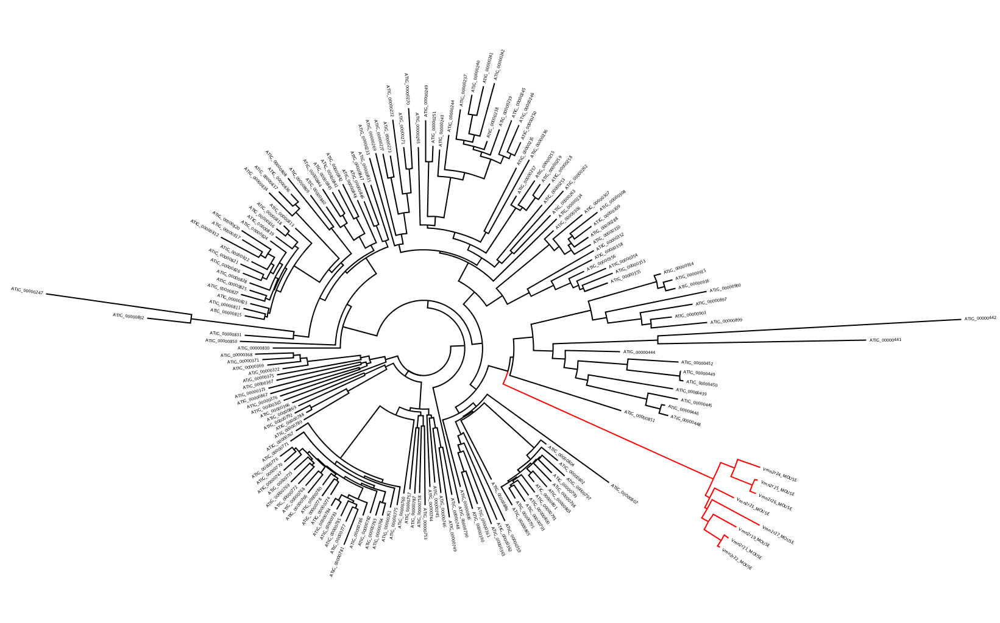

In [159]:
Image('../fig/single_vomeronasal_proteins alignment FastTree Tree_names.newick.png')

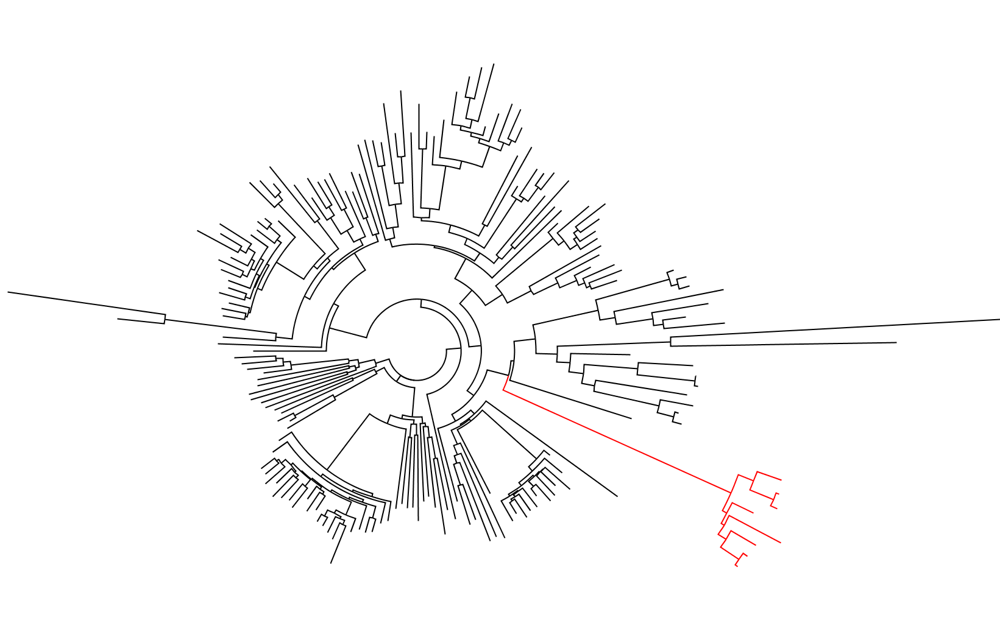

In [160]:
Image('../fig/single_vomeronasal_proteins alignment FastTree Tree.newick.png')

In [161]:
%%bash
cp ../fig/single_vomeronasal_proteins alignment FastTree Tree.newick.pdf ../fig2/Figure7C.pdf

cp: target ‘../fig2/Figure7C.pdf’ is not a directory


## Embryonic FACs Analysis

In [162]:
%%bash
cp ../fig/14-Jun-2017-Layout2_real_percentages.pdf.pdf ../fig2/Figure8.pdf

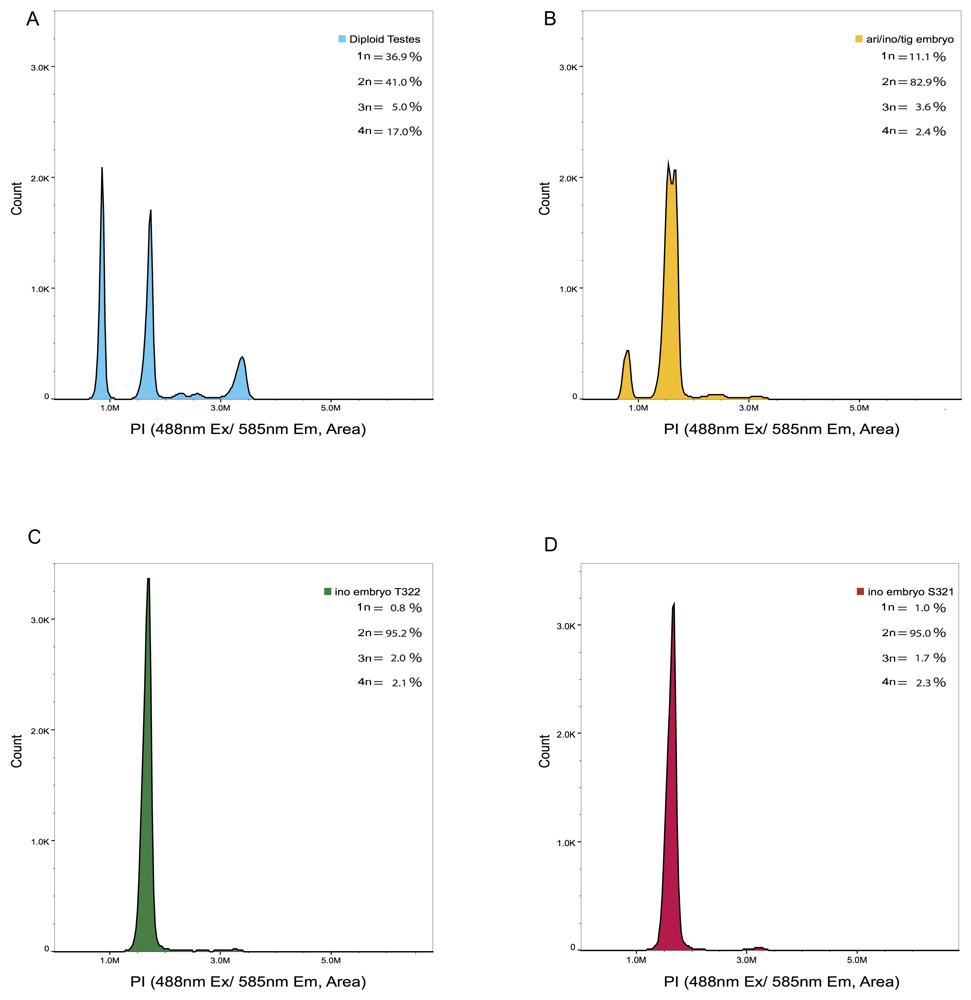

In [163]:
Image('../fig/14-Jun-2017-Layout2_real_percentages.jpg')

## Blood FACs analysis

In [164]:
%%bash
cp ../fig/blood_ploidy_1.pdf ../fig2/Figure9A.pdf
cp ../fig/blood_ploidy_2.pdf ../fig2/Figure9B.pdf

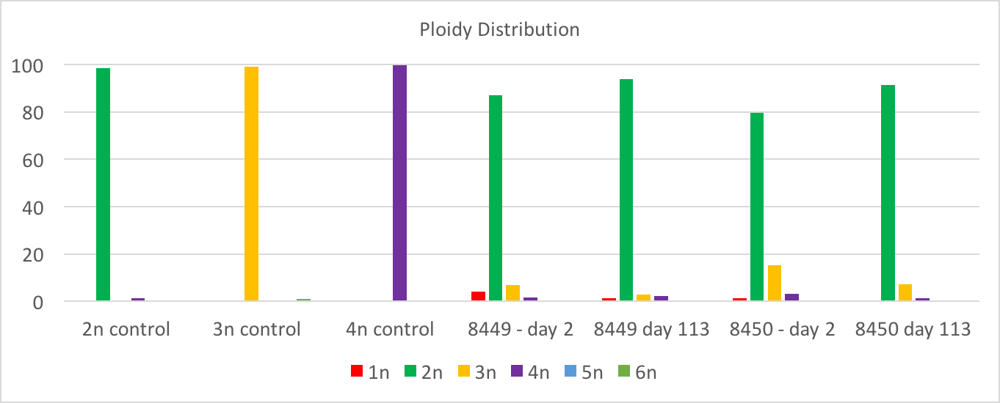

In [165]:
Image('../fig/blood_ploidy2.png.png')

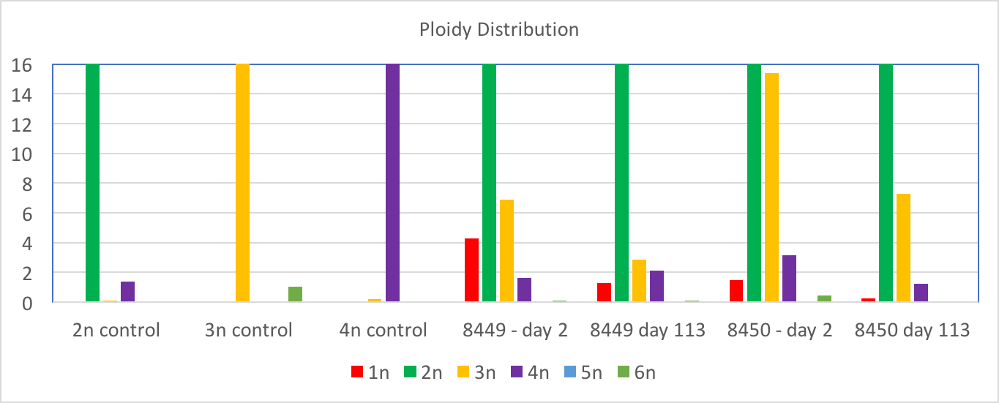

In [166]:
Image('../fig/blood_ploidy1.png')

In [167]:
%%bash
cp ../data/8449-8450\ FACS.xlsx ../data/supplemental_data/supplemental_table_8.xlsx

## Merge figures

In [168]:
%%bash
cd ../fig2
rm merged_figures.pdf
pdfunite *.pdf merged_figures.pdf

## Grouped Figures

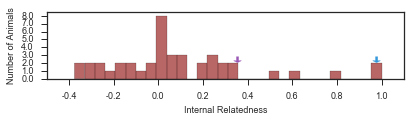

In [169]:
marm_ir = marmPopulation.ir_df
sns.set(style='ticks')
plt.figure(figsize=(6.4,1.2))
ax = sns.distplot(marm_ir['internal_relatedness'], kde=False, rug=False, bins=30, color='darkred', hist_kws={'alpha':0.6})
ax.set_ylim((0,8.5))
ax.set_ylabel('Number of Animals', fontsize=minorFontSize)
ax.set_xlabel('Internal Relatedness', fontsize=minorFontSize)
#ax.set_title('Internal Relatedness of 44 Aspidoscelis marmorata')
ax.arrow(.978,2.8,0.0,-0.5, width=0.01, head_width=0.035, head_length=0.25, color='#3498db')
ax.arrow(0.355 ,2.8,0.0,-0.5, width=0.01, head_width=0.035, head_length=0.25, color="#9b59b6")
ax.set_xlim(-0.5,1.1)
ax.set_xticklabels(ax.get_xticks(), fontsize=minorFontSize)
ax.set_yticklabels(ax.get_yticks(), fontsize=minorFontSize)
#0.336735
#ax.spines['top'].set_visible(False)
#ax.spines['right'].set_visible(False)
ax.get_xaxis().tick_bottom()
ax.get_yaxis().tick_left()
fig = ax.get_figure()
fig.savefig('../fig/internal_relatedness.pdf', bbox_inches='tight', pad_inches=0)


/home/dut/anaconda3/envs/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


{'Anolis_carolinensis': 'Carolina anole lizard', 'Canis_familiaris': 'Dog', '2_Python_molurus_bivittatus-5': 'Burmese python', 'Gallus_gallus': 'Chicken', 'Mus_musculus': 'Mouse', 'Danio_rerio': 'Zebrafish', 'Aspidoscelis_marmorata': 'Aspidoscelis marmoratus', 'Pelodiscus_sinensis': 'Chinese softshell turtle', 'Homo_sapiens': 'Human'}


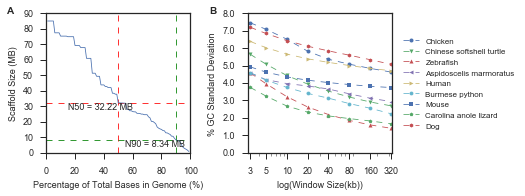

In [170]:
fig=plt.figure(figsize=(6.2,2.5))
fig.subplots_adjust(hspace=0.2,wspace=0.40)
gs = gridspec.GridSpec(1, 2)
ax1 = plt.subplot(gs[0, 0])
ax2 = plt.subplot(gs[0, 1])
#############################################################################################
ax1 = nxDF.plot('perc','size',fontsize=minorFontSize, legend=False, linewidth=0.8, ax=ax1)

ax1.get_yaxis().get_major_formatter().set_scientific(False)
ax1.get_yaxis().set_major_formatter(FuncFormatter(lambda x, p: format(int(x/1000000), ',')))
ax1.set_ylabel('Scaffold Size (MB)',fontsize=minorFontSize)


ax1.set_xlabel('Percentage of Total Bases in Genome (%)',fontsize=minorFontSize)
ax1.set_xticks(np.arange(0,120,20))
#ax1.set_title('${Aspidoscelis\ marmoratus}$ Genome Continuity',fontsize=majorFontSize)

ax1.vlines(x=50,color ='r',ymin=0,ymax=90000000,linestyle='--', linewidth=0.8)
ax1.hlines(y=32220929,color ='r',xmin=0,xmax=100,linestyle='--', linewidth=0.8)
ax1.annotate('N50 = 32.22 MB',xy=(15,28000000),fontsize=minorFontSize)

ax1.vlines(x=90,color ='g',ymin=0,ymax=90000000,linestyle='--', linewidth=0.8)
ax1.hlines(y=8340160,color ='g',xmin=0,xmax=100,linestyle='--', linewidth=0.8)
ax1.annotate('N90 = 8.34 MB',xy=(55,4500000),fontsize = minorFontSize)

ax1.get_xaxis().tick_bottom()
ax1.get_yaxis().tick_left()

ax1.text(-0.22, 1.05, 'A', transform=ax1.transAxes,
      fontsize=majorFontSize, fontweight='bold', va='top', ha='right')
#############################################################################################
organism_map = {'Gallus_gallus': 'Chicken', '2_Python_molurus_bivittatus-5': 'Burmese python', 'Aspidoscelis_marmorata': 'Aspidoscelis marmoratus', 
                'Pelodiscus_sinensis': 'Chinese softshell turtle', 'Homo_sapiens': 'Human', 'Canis_familiaris': 'Dog', 'Mus_musculus': 'Mouse', 
                'Danio_rerio': 'Zebrafish', 'Anolis_carolinensis': 'Carolina anole lizard'}

markers=['--o', '--v', '--^', '--<', '-->', '--8', '--s', '--p', '--h', '--H', '--D', '--d']
for i, organism in enumerate(gcSTD.organism.unique()):
    #name = organism.replace('2_','').replace('-5','').replace('_', ' ')
    name = organism_map[organism]
    gc_dist = gcSTD[gcSTD.organism ==organism]
    gc_dist.sort_values('window_size',inplace=True)
    ax2.plot(gc_dist['window_size'],
            gc_dist['std_dev'], 
            markers[i],
            label=name,
            markersize=4,
            linewidth=0.8)
print(organism_map)
ax2.set_xscale("log")

ax2.set_xticks([10] + gc_dist['window_size'].tolist())
ax2.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
ax2.set_xlim(2770,330000)
xtick_labels = [str(int(float(x)/1000.0)) for x in ax2.get_xticks()]
ax2.set_xticklabels(xtick_labels, fontsize=minorFontSize)

ax2.set_yticks(np.arange(0,11,1.0))
ax2.set_yticklabels(ax2.get_yticks(),fontsize=minorFontSize)

ax2.set_ylim(0,8)
ax2.set_ylabel('% GC Standard Deviation', fontsize=minorFontSize)
ax2.set_xlabel('log(Window Size(kb))', fontsize=minorFontSize)
#ax2.set_title('Standard Deviation of GC Content for Multiple Window Sizes', fontsize=majorFontSize)
ax2.legend(loc=5,bbox_to_anchor=(1.9, 0.5), prop={'size':8})

ax2.get_xaxis().tick_bottom()
ax2.get_yaxis().tick_left()

ax2.text(-0.22, 1.05, 'B', transform=ax2.transAxes,
      fontsize=majorFontSize, fontweight='bold', va='top', ha='right')
#############################################################################################
fig.savefig('../fig/N50_plot_and_GC_std.pdf',bbox_inches='tight',pad_inches=0.1)
fig.savefig('../fig/N50_plot_and_GC_std.png',bbox_inches='tight',pad_inches=0.1)
plt.show()

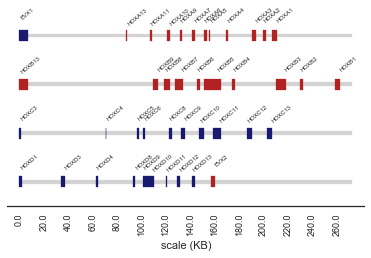

In [171]:
x_buffer = 10000
num_clusters = len(hoxGeneCoordsDF.seqid.unique())


sns.set(font_scale=1.0, style='white')
fig=plt.figure(figsize=(6.4,3.5))
fig.subplots_adjust(hspace=0,wspace=0)
gs = gridspec.GridSpec(num_clusters, 1)
base_cluster_length = hoxGeneCoordsDF.stop.max() + x_buffer
for i,scaffold in enumerate(['Scpiz6a_30.1','Scpiz6a_86','Scpiz6a_37','Scpiz6a_1']):
    ax = plt.subplot(gs[i, :])
    ax.set_ylim(0,4)
    #base_cluster_length = hoxGeneCoordsDF[hoxGeneCoordsDF.seqid == scaffold].stop.max() + x_buffer
    ax.set_xlim(-x_buffer, base_cluster_length + x_buffer)
    cluster_patch = coord_to_square(coord = (0,base_cluster_length), level = 2, color='lightgrey', width=0.15)
    ax.add_patch(cluster_patch)
    counter = 0 
    for i, row in hoxGeneCoordsDF[hoxGeneCoordsDF.seqid == scaffold].iterrows():
        if row['strand'] == '+':
            color = 'firebrick'
        else:
            color = 'midnightblue'
        evidence_square = coord_to_square(coord = (row['start'], row['stop']), level=2, color=color, width=0.45)
        ax.add_patch(evidence_square)
        if counter % 2 == 0:
            text_div = 15.0
        else:
            text_div = 1.3
        
        ax.annotate(row['gene'], xy=(row['start'] + ((row['stop'] - row['start']) / text_div),
                                   4.0), ha='left', fontsize=6, rotation=40)
        counter+=1 
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_yticks([])
    xticks = ax.get_xticks()
    ax.set_xticks([])
ax.spines['bottom'].set_visible(True)
ax.set_xticks(np.arange(0,280000,20000))
x1kb_labels = [str(x/1000) for x in ax.get_xticks()]
ax.set_xticklabels(x1kb_labels,fontsize=minorFontSize,rotation=90)
ax.set_xlabel("scale (KB)")
fig.savefig('../fig/hox_clusters.pdf',bbox_inches='tight',pad_inches=0.1)
fig.savefig('../fig/hox_clusters.png',bbox_inches='tight',pad_inches=0.1,dpi=1000)

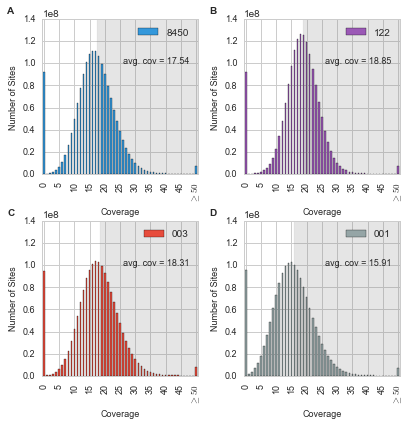

In [172]:
sns.set_style("whitegrid")
fig=plt.figure(figsize=(6.4,6.4))
fig.subplots_adjust(hspace=0.3,wspace=0.30)
gs = gridspec.GridSpec(2, 2)
row = [0,0,1,1]
column = [0,1,0,1]
letters = ['A', 'B', 'C', 'D']

for i, animal in enumerate(profCountDF.animal.unique()): 
    ax = plt.subplot(gs[row[i], column[i]])
    outer_lim = 50
    cov_dist = profCountDF[profCountDF.animal == animal][['cov','occurence']].groupby('cov')['occurence'].sum().reset_index()
    cov_mean = sum(cov_dist['cov'] * cov_dist.occurence)/cov_dist.occurence.sum()
    cov_dist['occurence'][cov_dist['cov'] >= outer_lim] = cov_dist['occurence'][cov_dist['cov'] >= outer_lim].sum()
    cov_dist = cov_dist[cov_dist['cov'] <= outer_lim] 

    ax = cov_dist.plot(x='cov',y='occurence',kind='bar',legend=True,ax=ax,  color=color_ids[animal], label=change_name(animal), fontsize=minorFontSize)
    ticks = ax.xaxis.get_ticklocs()
    ticklabels = [l.get_text() for l in ax.xaxis.get_ticklabels()]
    ticklabels[-1] = r'$\geq%s$'%str(outer_lim)
    ax.xaxis.set_ticks(ticks[::5])
    ax.xaxis.set_ticklabels(ticklabels[::5],rotation=90, fontsize=minorFontSize)
    ax.set_ylabel('Number of Sites', fontsize=minorFontSize)
    ax.set_xlabel('Coverage', fontsize=minorFontSize)
    #ax.set_title( 'Animal:'%change_name(animal), fontsize=minorFontSize)
    ax.set_ylim(0,140000000)
    ax.fill_between((cov_mean, ax.get_xlim()[1]),ax.get_ylim()[0],ax.get_ylim()[1],color='grey',alpha=0.2) 
    ax.text(26,100000000,'avg. cov = %s' % str(round(cov_mean,2)), fontsize=minorFontSize)
    ax.text(-0.18, 1.08, letters[i], transform=ax.transAxes,
      fontsize=majorFontSize, fontweight='bold', va='top', ha='right')
fig.savefig('../fig/supplemental_coverage_distributions.pdf',bbox_inches='tight',pad_inches=0.1)
fig.savefig('../fig/supplemental_coverage_distributions.png',bbox_inches='tight',pad_inches=0.1,dpi=500)

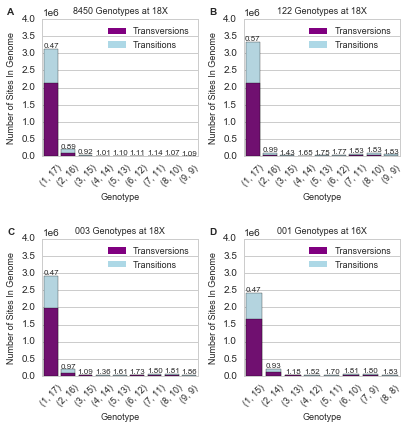

In [173]:

sns.set_style("whitegrid")
fig=plt.figure(figsize=(6.4,6.4))
fig.subplots_adjust(hspace=0.6,wspace=0.30)
gs = gridspec.GridSpec(2, 2)
row = [0,0,1,1]
column = [0,1,0,1]
covValuesDict = {'A_tigris8450':18,
'Atig_122':18,
'Atig003':18,
'Atig001':16,
}

letters = ['A', 'B', 'C', 'D']


for i, animal in enumerate(tntvDF.animal.unique()):
    ax = plt.subplot(gs[row[i], column[i]])
    ax.text(-0.18, 1.08, letters[i], transform=ax.transAxes,fontsize=majorFontSize, fontweight='bold', va='top', ha='right')
    cov = covValuesDict[animal]
    subed = tntvDF[(tntvDF.animal == animal) & (tntvDF['cov']==cov)&(tntvDF.definable==True)]
    ax = sns.barplot(x = subed.allele_count, y = subed.transitions + subed.transversions, color = "lightblue",ax=ax)

    #Plot 2 - overlay - "bottom" series
    bottom_plot = sns.barplot(x = subed.allele_count, y = subed.transversions, color = "purple",ax=ax)

    #legend
    topbar = plt.Rectangle((0,0),1,1,fc="lightblue", edgecolor = 'none')
    bottombar = plt.Rectangle((0,0),1,1,fc='purple',  edgecolor = 'none')
    l = ax.legend([bottombar, topbar], ['Transversions', 'Transitions'], loc=1, ncol = 1, fontsize=minorFontSize
                  )
    l.draw_frame(False)

    #label bars
    rects = ax.patches

    # Now make some labels
    labels = ['%s'%str(i)[:4] for i,t in zip(subed.tn_tv_ratio, subed.total)]

    for rect, label in zip(rects, labels):
        height = rect.get_height()
        ax.text(rect.get_x() + rect.get_width()/2, height + 25, label, ha='center',rotation=0, va='bottom', fontsize=minorFontSize-1)

    bottom_plot.set_ylabel("Number of Sites In Genome", fontsize=minorFontSize)
    bottom_plot.set_xlabel("Genotype", fontsize=minorFontSize)
    ax.set_xticklabels(ax.get_xticklabels(),rotation=45, fontsize=minorFontSize)
    #plt.xticks(rotation=45)


    ax.set_title('%s Genotypes at %sX'%(change_name(animal), str(cov)), fontsize=minorFontSize)
    ax.ticklabel_format(style='sci',scilimits=(-3,4),axis='y',useOffset=True)
    ax.set_yticks(xrange(0,4500000,500000))

fig.savefig('../fig/supplemental_tntv.pdf',bbox_inches='tight',pad_inches=0.1)
fig.savefig('../fig/supplemental_tntv.png',bbox_inches='tight',pad_inches=0.1,dpi=500)

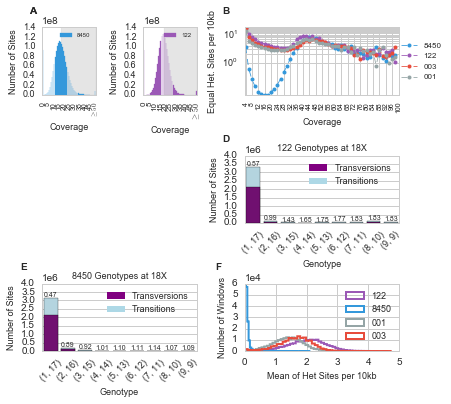

In [174]:

sns.set_style('whitegrid')
fig=plt.figure(figsize=(6.4,5.8))
fig.subplots_adjust(hspace=0.9,wspace=0.90)
gs = gridspec.GridSpec(3, 4)
ax1 = plt.subplot(gs[0, 0])
ax1_5 = plt.subplot(gs[0, 1])
ax2 = plt.subplot(gs[0, 2:])
ax3 = plt.subplot(gs[1, 2:])
ax4 = plt.subplot(gs[2, 0:2])
ax5 = plt.subplot(gs[2, 2:])
all_axes = [ax1, ax1_5, ax2, ax3, ax4, ax5]

######################################################################################################################################################

sns.set_style("whitegrid", {'axes.grid' : False})
animal="A_tigris8450"
outer_lim = 50
cov_dist = profCountDF[profCountDF.animal == animal][['cov','occurence']].groupby('cov')['occurence'].sum().reset_index()
cov_mean = sum(cov_dist['cov'] * cov_dist.occurence)/cov_dist.occurence.sum()
cov_dist['occurence'][cov_dist['cov'] >= outer_lim] = cov_dist['occurence'][cov_dist['cov'] >= outer_lim].sum()
cov_dist = cov_dist[cov_dist['cov'] <= outer_lim] 

ax1 = cov_dist.plot(x='cov',y='occurence',kind='bar',legend=True,ax=ax1,  color=color_ids[animal], label=change_name(animal), fontsize=minorFontSize, edgecolor=color_ids[animal])

ticks = ax1.xaxis.get_ticklocs()
ticklabels = [l.get_text() for l in ax1.xaxis.get_ticklabels()]
ticklabels[-1] = r'$\geq%s$'%str(outer_lim)
ax1.xaxis.set_ticks(ticks[::5])
ax1.xaxis.set_ticklabels(ticklabels[::5],rotation=90, fontsize=minorFontSize-2)
ax1.set_ylabel('Number of Sites', fontsize=minorFontSize)
ax1.set_xlabel('Coverage', fontsize=minorFontSize)
#ax1.set_title("Distribution of Coverage: %s" % change_name(animal))
ax1.set_ylim(0,140000000)

#add fill
ax1.fill_between((cov_mean, ax1.get_xlim()[1]),ax1.get_ylim()[0],ax1.get_ylim()[1],color='grey',alpha=0.2) 

#add figure label
ax1.legend(prop={'size':6})

ax1.text(-0.1, 1.3, 'A', transform=ax1.transAxes, fontsize=majorFontSize, fontweight='bold', va='top', ha='right')

####################################################################################################################################################
sns.set_style("whitegrid", {'axes.grid' : False})

animal="Atig_122"
outer_lim = 50
#profCountDF, animal
cov_dist = profCountDF[profCountDF.animal == animal][['cov','occurence']].groupby('cov')['occurence'].sum().reset_index()
cov_mean = sum(cov_dist['cov'] * cov_dist.occurence)/cov_dist.occurence.sum()
cov_dist['occurence'][cov_dist['cov'] >= outer_lim] = cov_dist['occurence'][cov_dist['cov'] >= outer_lim].sum()
cov_dist = cov_dist[cov_dist['cov'] <= outer_lim] 

ax1_5 = cov_dist.plot(x='cov',y='occurence',kind='bar',legend=True,ax=ax1_5,  color=color_ids[animal], label=change_name(animal), fontsize=minorFontSize, edgecolor=color_ids[animal])
ticks = ax1_5.xaxis.get_ticklocs()
ticklabels = [l.get_text() for l in ax1_5.xaxis.get_ticklabels()]
ticklabels[-1] = r'$\geq%s$'%str(outer_lim)
ax1_5.xaxis.set_ticks(ticks[::5])
ax1_5.xaxis.set_ticklabels(ticklabels[::5],rotation=90, fontsize=minorFontSize-1)
ax1_5.set_ylabel('Number of Sites', fontsize=minorFontSize)
ax1_5.set_xlabel('Coverage', fontsize=minorFontSize)
#ax1_5.set_title(change_name(animal))
ax1_5.set_ylim(0,140000000)

#add fill
ax1_5.fill_between((cov_mean, ax1_5.get_xlim()[1]),ax1_5.get_ylim()[0],ax1_5.get_ylim()[1],color='grey',alpha=0.2) 

ax1_5.legend(prop={'size':6})

ax1_5.text(-0.1, 1.3, 'A', transform=ax1.transAxes,
      fontsize=majorFontSize, fontweight='bold', va='top', ha='right')


####################################################################################################################################################
sns.set_style("whitegrid", {'axes.grid' : True})

for animal in perCovEqualRatesDF.animal.unique():
    ax2 = perCovEqualRatesDF[(perCovEqualRatesDF.animal == animal) & (perCovEqualRatesDF['cov'] > 2)].plot(x='cov',y='het_per_10kb',
                                                                                                           ylim=(-0.5,18), xlim = (3.5,100.5), 
                                                                                                           style='--o', yticks = np.arange(0,18,1),
                                                                                                           logy=True,xticks=np.arange(0,102,4),
                                                                                                           label=change_name(animal), ax=ax2,
                                                                                                           color=color_ids[animal], fontsize=minorFontSize, 
                                                                                                           markersize=4, linewidth=0.8)
    ax2.set_ylabel('Equal Het. Sites per 10kb', fontsize=minorFontSize)
    ax2.set_xlabel('Coverage', fontsize=minorFontSize)
    #ax2.set_title('Rate of Even Split Heterozygous Sites vs Coverage', fontsize=minorFontSize)
    ax2.legend(loc=5, bbox_to_anchor=(1.32, 0.5), prop={'size':8})



ax2.set_xticklabels(ax2.get_xticks(),rotation=90, fontsize=minorFontSize-2)
#ax2.yaxis.set_major_formatter(ScalarFormatter())
#ax2.yaxis.set_major_formatter(ticker.FuncFormatter(lambda y,pos: ('{{:.{:1d}f}}'.format(int(np.maximum(-np.log10(y),0)))).format(y)))

ax2.text(-0.1, 1.3, 'B', transform=ax2.transAxes,
      fontsize=majorFontSize, fontweight='bold', va='top', ha='right')

###################################################################################################################################################

animal = 'Atig_122'
cov = 18
subed = tntvDF[(tntvDF.animal == animal) & (tntvDF['cov']==cov)&(tntvDF.definable==True)]
ax3 = sns.barplot(x = subed.allele_count, y = subed.transitions + subed.transversions, color = "lightblue",ax=ax3)

#Plot 2 - overlay - "bottom" series
bottom_plot = sns.barplot(x = subed.allele_count, y = subed.transversions, color = "purple",ax=ax3)

#legend
topbar = plt.Rectangle((0,0),1,1,fc="lightblue", edgecolor = 'none')
bottombar = plt.Rectangle((0,0),1,1,fc='purple',  edgecolor = 'none')
l = ax3.legend([bottombar, topbar], ['Transversions', 'Transitions'], loc=1, ncol = 1, fontsize=minorFontSize
              )
l.draw_frame(False)

#label bars
rects = ax3.patches

# Now make some labels
labels = ['%s'%str(i)[:4] for i,t in zip(subed.tn_tv_ratio, subed.total)]

for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax3.text(rect.get_x() + rect.get_width()/2, height + 25, label, ha='center',rotation=0, va='bottom', fontsize=minorFontSize-2)

bottom_plot.set_ylabel("Number of Sites", fontsize=minorFontSize)
bottom_plot.set_xlabel("Genotype", fontsize=minorFontSize)
ax3.set_xticklabels(ax3.get_xticklabels(),rotation=45, fontsize=minorFontSize)
#plt.xticks(rotation=45)


ax3.set_title('%s Genotypes at %sX'%(change_name(animal), str(cov)), fontsize=minorFontSize)
ax3.ticklabel_format(style='sci',scilimits=(-3,4),axis='y',useOffset=True, fontsize=minorFontSize)
ax3.set_yticks(xrange(0,4500000,500000))


ax3.text(-0.1, 1.3, 'D', transform=ax3.transAxes,
      fontsize=majorFontSize, fontweight='bold', va='top', ha='right')

##################################################################################################################################################


animal = 'A_tigris8450'
cov = 18
subed = tntvDF[(tntvDF.animal == animal) & (tntvDF['cov']==cov)&(tntvDF.definable==True)]
ax4= sns.barplot(x = subed.allele_count, y = subed.transitions + subed.transversions, color = "lightblue",ax=ax4)

#Plot 2 - overlay - "bottom" series
bottom_plot = sns.barplot(x = subed.allele_count, y = subed.transversions, color = "purple",ax=ax4)

#legend
topbar = plt.Rectangle((0,0),1,1,fc="lightblue", edgecolor = 'none')
bottombar = plt.Rectangle((0,0),1,1,fc='purple',  edgecolor = 'none')
l = ax4.legend([bottombar, topbar], ['Transversions', 'Transitions'], loc=1, ncol = 1, fontsize=minorFontSize
              )
l.draw_frame(False)

#label bars
rects = ax4.patches

# Now make some labels
labels = ['%s'%str(i)[:4] for i,t in zip(subed.tn_tv_ratio, subed.total)]

for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax4.text(rect.get_x() + rect.get_width()/2, height + 25, label, ha='center',rotation=0, va='bottom', fontsize=minorFontSize-2)

bottom_plot.set_ylabel("Number of Sites", fontsize=minorFontSize)
bottom_plot.set_xlabel("Genotype", fontsize=minorFontSize)
ax4.set_xticklabels(ax4.get_xticklabels(),rotation=45, fontsize=minorFontSize)


ax4.set_title('%s Genotypes at %sX'%(change_name(animal), str(cov)), fontsize=minorFontSize)

ax4.ticklabel_format(style='sci',scilimits=(-3,4),axis='y',useOffset=True, fontsize=minorFontSize)
ax4.set_yticks(xrange(0,4500000,500000))


ax4.text(-0.1, 1.3, 'E', transform=ax4.transAxes,
      fontsize=majorFontSize, fontweight='bold', va='top', ha='right')

##################################################################################################################################################

for animal in animal_ids:
    sns.distplot(equalHetWindowsDF[equalHetWindowsDF.animal==animal].rolling(100).mean().het_sites.dropna(),
                 kde=False,
                 hist_kws={"alpha":1,"color":color_ids[animal],"linewidth":2,"histtype": "step"},
                 label=id_to_name[animal],
                 ax=ax5)


#ax5.set_title('1Mb Heterozygosity Distribution', fontsize=minorFontSize)
ax5.set_ylabel('Number of Windows', fontsize=minorFontSize)
ax5.set_xlabel('Mean of Het Sites per 10kb', fontsize=minorFontSize)
ax5.legend(fontsize=minorFontSize)
ax5.ticklabel_format(style='sci',scilimits=(-3,4),axis='y',useOffset=True)

ax5.text(-0.15, 1.3, 'F', transform=ax5.transAxes,
      fontsize=majorFontSize, fontweight='bold', va='top', ha='right')


#####################################################################################################################################################
fig.savefig('../fig/heterozygosity_qc.pdf', bbox_inches='tight', pad_inches=0.2)
fig.savefig('../fig/heterozygosity_qc.png', bbox_inches='tight', pad_inches=0.2, dpi=500)

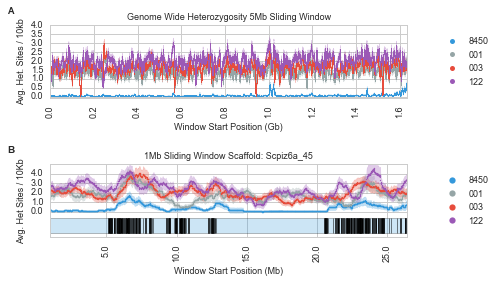

In [175]:

sns.set_style("whitegrid")
fig=plt.figure(figsize=(6.4, 3.8))
fig.subplots_adjust(hspace=0.9,wspace=0.25)
gs = gridspec.GridSpec(2, 2)
ax1 = plt.subplot(gs[0, :])
#ax2 = plt.subplot(gs[1, 0])
ax3 = plt.subplot(gs[1, :])
#ax4 = plt.subplot(gs[2, 0])


#######################################################################################################################################################################################
#######################################################################################################################################################################################
#######################################################################################################################################################################################
#######################################################################################################################################################################################

step=500
for animal in equalHetWindowsDF.animal.unique():
    five_mb_rolling = equalHetWindowsDF[equalHetWindowsDF['animal']==animal].reset_index().het_sites.rolling(window=step)

    ax1 = five_mb_rolling.mean().plot(legend=False, 
                                      rot = 90, 
                                      style='.', 
                                      ax=ax1, 
                                      label=id_to_name[animal], 
                                      color=color_ids[animal], 
                                      markersize=2.0,
                                      fontsize=minorFontSize)

    ax1.fill_between(five_mb_rolling.mean().index, 
                     five_mb_rolling.mean()-2*five_mb_rolling.std()/np.sqrt(step), 
                     five_mb_rolling.mean()+2*five_mb_rolling.std()/np.sqrt(step), 
                     color=color_ids[animal], 
                     alpha=0.3)


megabase_labels = [str((x*10000/1000000000)) for x in ax1.get_xticks()]
ax1.set_title('Genome Wide Heterozygosity 5Mb Sliding Window', fontsize=minorFontSize)
ax1.set_xticklabels(megabase_labels, rotation=90, fontsize=minorFontSize) 
ax1.set_xlabel('Window Start Position (Gb)', fontsize=minorFontSize)
ax1.set_ylabel('Avg. Het. Sites / 10kb', fontsize=minorFontSize)
ax1.set_ylim(-0.1,4)
ax1.legend(loc=5, bbox_to_anchor=(1.25, 0.5),markerscale=5,fontsize = minorFontSize)
ax1.text(-0.1, 1.25, 'A', transform=ax1.transAxes,
      fontsize=minorFontSize, fontweight='bold', va='top', ha='right')
#######################################################################################################################################################################################
#######################################################################################################################################################################################
#######################################################################################################################################################################################
#######################################################################################################################################################################################

step=100
scaffold='Scpiz6a_45'
lns = None
for animal in equalHetWindowsDF.animal.unique():
    scaffold_het_rolling = equalHetWindowsDF[(equalHetWindowsDF['animal']==animal) & (equalHetWindowsDF['chrom']==scaffold)].reset_index().het_sites.rolling(window=step)
    ln1 = ax3.plot(scaffold_het_rolling.mean(),
           '.',
            color=color_ids[animal],
            label=id_to_name[animal],
            markersize=2.5)

    ax3.fill_between(scaffold_het_rolling.mean().index, 
                     scaffold_het_rolling.mean()-2*scaffold_het_rolling.std()/np.sqrt(step), 
                     scaffold_het_rolling.mean()+2*scaffold_het_rolling.std()/np.sqrt(step), 
                     color=color_ids[animal], 
                     alpha=0.3)
    if not lns:
        lns = ln1
    else:
        lns+=ln1
    
ax3.set_ylim(-2.7, 5)    
ax3.set_yticks(np.arange(0,5.0,1.0))
ax3.set_yticklabels(ax3.get_yticks(), fontsize=minorFontSize)
ax3.set_ylabel('Avg. Het Sites / 10Kb', fontsize=minorFontSize)


megabase_labels = [str((x*10000/1000000)) for x in ax3.get_xticks()]
ax3.set_xticklabels(megabase_labels,rotation=90, fontsize=minorFontSize) 
ax3.set_xlabel("Window Start Position (Mb)", fontsize=minorFontSize)

ax3.set_title('%dMb Sliding Window Scaffold: %s' % (step*10000/1000000, scaffold), fontsize=minorFontSize)
ax3.set_xlim(scaffold_het_rolling.mean().dropna().index.min(),scaffold_het_rolling.mean().dropna().index.max())

labs = [l.get_label() for l in lns]
ax3.legend(lns, labs, loc=5, bbox_to_anchor=(1.25, 0.5),markerscale=5, fontsize=minorFontSize)
ax3.text(-0.1, 1.25, 'B', transform=ax3.transAxes,
         fontsize=majorFontSize, fontweight='bold', va='top', ha='right')


chrom = ax3.add_collection(BrokenBarHCollection(
        [(scaffold_het_rolling.mean().dropna().index.min()+2, scaffold_het_rolling.mean().dropna().index.max()-105)], 
        (-2.2,1.5),
        facecolors=color_ids['A_tigris8450'],
        alpha=0.25,
        linewidths=[1]
                                      )
    )


ax3.add_collection(BrokenBarHCollection(
        vmnrDF[vmnrDF['feature']=='gene'].broken_bars, 
        (-2.2,1.5),
        facecolors=['black' for i in xrange(len(vmnrCopyNumbers.broken_bars))],
        linewidths=[0.5 for i in xrange(len(vmnrCopyNumbers.broken_bars))]
                                      )
    )



fig.savefig('../fig/genome_wide_heterozygosity.pdf', bbox_inches='tight', pad_inches=0.25)
fig.savefig('../fig/genome_wide_heterozygosity.png', bbox_inches='tight', pad_inches=0.25, dpi=500)

plt.show()

In [176]:
#head -n 1 A_tigris8450.merged.dedup.realigned.prof > A_tigris8450.merged.dedup.realigned.Scpiz6a_45.prof
#nohup cat A_tigris8450.merged.dedup.realigned.prof | awk '$1=="Scpiz6a_45"' >> A_tigris8450.merged.dedup.realigned.Scpiz6a_45.prof &
#head -n 1 A_tigris8450.merged.dedup.realigned.prof > A_tigris8450.merged.dedup.realigned.Scpiz6a_122.prof
#awk '$1=="Scpiz6a_122"' A_tigris8450.merged.dedup.realigned.prof  >> A_tigris8450.merged.dedup.realigned.Scpiz6a_122.prof &
#head -n 1 A_tigris8450.merged.dedup.realigned.prof > A_tigris8450.merged.dedup.realigned.Scpiz6a_47.prof
#awk '$1=="Scpiz6a_47"' A_tigris8450.merged.dedup.realigned.prof  >> A_tigris8450.merged.dedup.realigned.Scpiz6a_47.prof &
#covScaffold_45_8450 = pd.read_csv('../data/pysam/A_tigris8450.merged.dedup.realigned.Scpiz6a_45.prof',sep='\t')

In [177]:
# step=1000
# rolling = covScaffold_45_8450.rolling(step,)['cov']

# ax = rolling.std().plot(title='Scaffold 45 8450 Standard Deviation Coverage %sbp Sliding Window' % str(step), 
#                          legend=False, 
#                          rot = 90, 
#                          style='-',
#                          #label=animal,
#                          color='darkblue',
#                          markersize=1.0,
#                          alpha=0.5,
#                          figsize=(20,8),
#                         label='Rolling Average')

# # ax.fill_between(rolling.mean().index, 
# #                     rolling.mean()-2*five_mb_rolling.std()/np.sqrt(step), 
# #                     rolling.mean()+2*five_mb_rolling.std()/np.sqrt(step), 
# #                     color='blue', 
# #                     alpha=0.3)
# print(covScaffold_45_8450['cov'].mean())
# ax.hlines(y=covScaffold_45_8450['cov'].mean(),xmin=ax.get_xlim()[0],xmax=ax.get_xlim()[1],label='Scaffold Average')

# megabase_labels = [str((x/1e6)) for x in ax.get_xticks()]
# ax.set_xticklabels(megabase_labels,rotation=90) 
# ax.set_xlabel('Window Start Position (Mb)')
# ax.set_ylabel('Standard Deviation Coverage')
# ax.set_ylim(-5, 250)
# ax.legend(markerscale=10.0)
# #ax.set_yscale('log')

1.4564516129 172.6


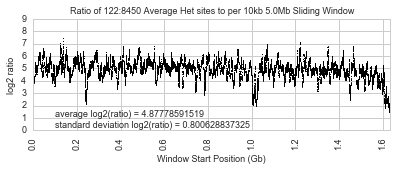

In [178]:
step = 500
mother = equalHetWindowsDF[equalHetWindowsDF.animal == 'Atig_122'].reset_index().het_sites.rolling(window=step).mean()
fp_animal = equalHetWindowsDF[equalHetWindowsDF.animal == 'A_tigris8450'].reset_index().het_sites.rolling(window=step).mean()
ratio = mother/fp_animal
print(min(ratio.dropna()),max(ratio.dropna()))
ax = np.log2(ratio).plot(legend=False, 
                rot = 90, 
                style='.',
                label=animal,
                color='black',
                markersize=2.0,
               figsize=(6.4,2),
               fontsize=minorFontSize)
ax.set_title('Ratio of 122:8450 Average Het sites to per 10kb %sMb Sliding Window' % str(step/100), fontsize=minorFontSize)
megabase_labels = [str((x*10000/1000000000)) for x in ax.get_xticks()]
ax.set_xticklabels(megabase_labels,rotation=90, fontsize=minorFontSize) 
ax.set_xlabel('Window Start Position (Gb)', fontsize=minorFontSize)
ax.set_ylabel('log2 ratio', fontsize=minorFontSize)
ax.set_ylim(0,9)
mean_r = np.log2(ratio).mean()
se_r = np.log2(ratio).std()#/np.sqrt(len(ratio.dropna()))
ax.text(1.0e4,0.25, 'average log2(ratio) = %s\nstandard deviation log2(ratio) = %s'%(str(mean_r), str(se_r)), fontsize=minorFontSize)
fig = ax.get_figure()
fig.savefig('../fig/supplemental_log2_ratio.pdf', bbox_inches='tight', pad_inches=0.25)
fig.savefig('../fig/supplemental_log2_ratio.png', bbox_inches='tight', pad_inches=0.25, dpi=500)